In [56]:
"""
Plot to show fitness over generations
"""

import matplotlib.pyplot as plt

def plot(results, param, fitness_type, jitter):
    
    plt.figure(figsize=(12, 10))
    plt.title(f"Comparing {param}")
    plt.xlabel("Generation")
    plt.ylabel(f"{fitness_type}")
    
    param_values = []
    color_map = {}
    color_legend = {}

    for result in results:

        if result[param] not in param_values:
            param_values.append(result[param])
        
        best_fitness = result[fitness_type]
        generations = range(len(best_fitness))
        
        if jitter:
            jitter_amount = random.uniform(-jitter, jitter)
            best_fitness_j = [f + jitter_amount for f in best_fitness]
        else:
            best_fitness_j = best_fitness

        if result[param] == param_values[0]:
            colour = "blue"
        else:
            colour = "green"
            
        if colour not in color_legend:
            color_legend[colour] = f"{param} = {result[param]}"

        plt.plot(generations, best_fitness_j, color=colour)

    legend_handles = [plt.Line2D([0], [0], color=color, label=label) for color, label in color_legend.items()]
    plt.legend(handles=legend_handles, loc="best")
        
    plt.grid(True)
    plt.show()

In [57]:
"""
Plot to show how strategy of any memory length makes a choice
"""

import networkx as nx

def binary_tree_plot(strategy):
    
    leaves = strategy[1:]
    num_leaf_nodes = len(leaves)
    tree_depth = int(math.log2(num_leaf_nodes))
    
    edge_labels = {}
    node_labels = {}
    node_colours = {}

    G = nx.DiGraph()

    node_count = 1
    G.add_node(node_count)
    node_labels[node_count] = ""
    node_colours[node_count] = "lightblue"
    node_count += 1
    
    for branch in range(1, tree_depth):
        
        for i in range(2**branch):
            
            G.add_node(node_count)
            
            if (node_count % 2): # if odd
                node_labels[node_count] = ""
            else:
                node_labels[node_count] = ""
            node_colours[node_count] = "lightblue"
            node_count += 1
            
    for leaf in leaves:
        
        G.add_node(node_count)
        
        if leaf: # if one
            node_labels[node_count] = "C"
            node_colours[node_count] = "lightgreen"
        else:
            node_labels[node_count] = "D"
            node_colours[node_count] = "pink"
        node_count += 1
            
    for node in range(1, 2**tree_depth):
        if node < 2**(tree_depth-1):
            G.add_edge(node, 2*node)
            edge_labels[(node, 2*node)] = "D"
            G.add_edge(node, 2*node + 1)
            edge_labels[(node, 2*node + 1)] = "C"
        else:
            G.add_edge(node, 2*node)
            G.add_edge(node, 2*node + 1)
            edge_labels[(node, 2*node)] = ""
            edge_labels[(node, 2*node + 1)] = ""

    pos = {}
    x, y = 12, 8
    pos[1] = (x, y)
    
    width = 2*x
    for level in range(1, tree_depth + 1):
        y-= 2
        for i in range(2**level):
            node = (2**level) + i
            increment = width/(2**level+1)
            x = (i+1) * increment
            pos[node] = (x, y)
    
    #print((width-increment), y)
    pos[2**(tree_depth+2)] = ((width-increment), y)

    plt.figure(figsize=(12, 8))
    nx.draw(G, pos, labels=node_labels, node_color=[node_colours[node] for node in G.nodes()], with_labels=True, arrows=True)
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)

    plt.title("Strategy Tree Choice Visualization")
    plt.show()

In [58]:
"""
Defining Standard Strategies
"""

always_cooperates = [1, 1, 1]
                     
always_defects = [0, 0, 0]

tit_for_tat = [1, 0, 1]

# Others..?

fixed_strategies = [always_cooperates, always_defects, tit_for_tat]

In [59]:
"""
Fitness function
"""

payoff_matrix = [[(3, 3), (0, 5)],
                 [(5, 0), (1, 1)]]

def fitness(prisoner, n):
    
    opponents = random.sample(fixed_strategies, len(fixed_strategies))
    
    sum_payoff = 0
    
    for opponent in opponents:
        payoff, opp_payoff = iterated_dilemma(prisoner, opponent, n)
        sum_payoff += payoff
        
    average_payoff = sum_payoff/len(opponents) # average payoff against fixed strategies
    expected_payoff = average_payoff/n # expected payoff for prisoner for any iteration
    return expected_payoff 


In [110]:
"""
Different fitness functions
"""

def fitness_c(prisoner, n): # more occurance of cooperative opponents
    
    opponents = []
    
    opponents.append(fixed_strategies[1])
    opponents.append(fixed_strategies[2])
    
    for i in range(3):
        opponents.append(fixed_strategies[0])
            
    sum_payoff = 0
    for opponent in opponents:
        payoff, opp_payoff = iterated_dilemma(prisoner, opponent, n)
        sum_payoff += payoff
        
    average_payoff = sum_payoff/len(opponents) # average payoff against fixed strategies
    expected_payoff = average_payoff/n # expected payoff for prisoner for any iteration
    
    return expected_payoff 

def fitness_d(prisoner, n): # more occurance of defective opponents
    
    opponents = []
    
    opponents.append(fixed_strategies[0])
    opponents.append(fixed_strategies[2])
    
    for i in range(3):
        opponents.append(fixed_strategies[1])
            
    sum_payoff = 0
    for opponent in opponents:
        payoff, opp_payoff = iterated_dilemma(prisoner, opponent, n)
        sum_payoff += payoff
        
    average_payoff = sum_payoff/len(opponents) # average payoff against fixed strategies
    expected_payoff = average_payoff/n # expected payoff for prisoner for any iteration
    
    return expected_payoff 

def fitness_t(prisoner, n): # more occurance of tit for tat opponents
    
    opponents = []
    
    opponents.append(fixed_strategies[1])
    opponents.append(fixed_strategies[2])
    
    for i in range(3):
        opponents.append(fixed_strategies[0])
            
    sum_payoff = 0
    for opponent in opponents:
        payoff, opp_payoff = iterated_dilemma(prisoner, opponent, n)
        sum_payoff += payoff
        
    average_payoff = sum_payoff/len(opponents) # average payoff against fixed strategies
    expected_payoff = average_payoff/n # expected payoff for prisoner for any iteration
    
    return expected_payoff 


In [111]:
"""
Random population initialisation
"""

import random

random.seed(214)

def random_pop(n, memory_length): # makes random prisoner strategies of specified memory length (with duplicate individuals)
    
    pop = []
    indices = list(range(1 + 2**memory_length))
    
    for individual in range(n):
        num_cooperations = random.randint(0, (1 + 2**memory_length))
        cooperation_indices = random.sample(indices, num_cooperations)
        pop.append([1 if index in cooperation_indices else 0 for index in indices])

    return pop


In [112]:
"""
Selection
"""

def tournament_selection(pop, n=20, k=2, tournament_size=4, fitness_function=fitness):
    
    selection = []
    
    for individual in range(k):
        candidates = random.sample(pop, tournament_size)
        best = max(candidates, key=lambda candidate: fitness_function(candidate, n))
        selection.append(best)
        
    return tuple(selection)


In [113]:
"""
Defining memory n strategies
"""

def strat(prisoner, seqSelf, seqOpp, memory_length): # return 1 for cooperate OR 0 for defect
    
    game_length = len(seqSelf)
    
    if game_length < memory_length: 
        
        if game_length == 0: # what to do on the first move
            return prisoner[0] # predefined first move

        else: # what to do before game is the length of the memory of the agents
            choice_remainders = list(range(2**(memory_length - game_length)))

            count = 0
            base = 1
            for i in range(game_length):
                base += (seqOpp[i] * (2**(memory_length - game_length)))
                count += 1

            choices = [base + remainder for remainder in choice_remainders]
            total_cooperations = sum(prisoner[choice] for choice in choices)

            if total_cooperations < 2**(memory_length - game_length - 1):
                return 0
            else:
                return 1

    else:
        count = 0
        move_index = 1
        while count < memory_length:
            move_index += (seqOpp[-memory_length + count] * (2**(memory_length - count - 1)))
            count += 1
        return prisoner[move_index]


In [114]:
"""
Iterated prisoner dilemma
"""

import math

def iterated_dilemma(prisonerA, prisonerB, n):
    
    memoryA, memoryB = int(math.log2(len(prisonerA) - 1)), int(math.log2(len(prisonerB) - 1)) # memory length of each prisoner
    seqA, seqB = [], [] # sequence of moves for each prisoner
    payoffA, payoffB = 0, 0 # payoff for each prisoner

    for i in range(n): # number of iteration of the dilemma
        
        # move for each prisoner
        moveA = strat(prisonerA, seqA, seqB, memoryA)
        moveB = strat(prisonerB, seqB, seqA, memoryB)
        
        # adds the move to the sequence of previous moves for each prisoner
        seqA.append(moveA)
        seqB.append(moveB)
        
        # calculates once-off pay-off for each prisoner based on move
        if moveA and moveB:
            scoreA, scoreB =  payoff_matrix[0][0]
        elif moveA and not moveB:
            scoreA, scoreB =  payoff_matrix[0][1]
        elif not moveA and moveB:
            scoreA, scoreB =  payoff_matrix[1][0]
        elif not moveA and not moveB:
            scoreA, scoreB =  payoff_matrix[1][1]
        
        # adds once-off pay-off to total pay-off for each prisoner
        payoffA += scoreA
        payoffB += scoreB
        
    return payoffA, payoffB


In [115]:
"""
Crossover operators
"""

def ordered_crossover(parent1, parent2):
    
    n = len(parent1)
    subset_length = (n-1)//4
    
    start_index = random.randint(1, n-subset_length)
    end_index = start_index + subset_length
    
    subset1a, subset1b, subset1c = parent1[:start_index], parent1[start_index:end_index], parent1[end_index:]
    subset2a, subset2b, subset2c = parent2[:start_index], parent2[start_index:end_index], parent2[end_index:]
    
    child1, child2 = [], []
    
    child1.extend(subset1a)
    child1.extend(subset2b) 
    child1.extend(subset1c)

    child2.extend(subset2a)
    child2.extend(subset1b)
    child2.extend(subset2c)
                
    return child1, child2

def split_crossover(parent1, parent2):
    
    n = len(parent1)
    split_index = (n+1)//2
    
    subset1a, subset1b = parent1[:split_index], parent1[split_index:]
    subset2a, subset2b = parent2[:split_index], parent2[split_index:]
    
    child1, child2 = [], []
    
    child1.extend(subset1a)
    child1.extend(subset2b) 

    child2.extend(subset2a)
    child2.extend(subset1b)
                
    return child1, child2


In [116]:
"""
Mutation Operators
"""

def reverse_sequence_mutation(prisoner):
    
    n = len(prisoner)
    
    start_index = random.randint(0, n-2)
    end_index = random.randint(start_index, n-1)

    subset = prisoner[start_index:end_index]
    reverse_subset = subset[::-1]
    
    mutation = prisoner[:start_index] + reverse_subset + prisoner[end_index:]

    return mutation

def inverse_mutation(prisoner):
    
    n = len(prisoner)
    
    start_index = random.randint(0, n-2)
    end_index = random.randint(start_index, n-1)

    subset = prisoner[start_index:end_index]
    inverse_subset = [(choice + 1) % 2 for choice in subset]

    mutation = prisoner[:start_index] + inverse_subset + prisoner[end_index:]

    return mutation


In [117]:
"""
Running the genetic algorithm given hyperparameter values
"""


import time

def run_genetic_algorithm(population_size, num_iterations, memory_length, num_generations, crossover_operator,
                          mutation_operator, mutation_rate, fitness_function):
    
    # features to track
    gen_count = 0
    gen_counts = []
    gen_best_fitnesses = []
    gen_mean_fitnesses = []
    gen_min_fitnesses = []
    gen_times = []
    best_strategy = always_cooperates
    
    pop = random_pop(population_size, memory_length) # initialises population
        
    no_improvement_count = 0 # counter to stop the code if we get 5 generations without improvement
    prev_best_fitness = float('inf')
    prev_mean_fitness = float('inf')

    for generation in range(num_generations):
        
        start_time = time.time() # starts timer
        
        fitnesses = [fitness_function(prisoner, num_iterations) for prisoner in pop] # calculates individuals fitnesses
        new_pop = []

        while len(new_pop) < population_size: # assigns new individuals to the population for next generation
            
            parent1, parent2 = tournament_selection(pop, num_iterations, 2, 4) # tournament selection for choosing parents
            
            # applying crossover operator to create children
            if crossover_operator == 'ordered':
                child1, child2 = ordered_crossover(parent1, parent2)
            elif crossover_operator == 'split':
                child1, child2 = split_crossover(parent1, parent2)
                
            # random chance of mutation
            if random.random() < mutation_rate:
                if mutation_operator == 'reverse_sequence':
                    child1 = reverse_sequence_mutation(child1)
                elif mutation_operator == 'inverse':
                    child1 = inverse_mutation(child1)
                    
            # independent random chance of the second child mutating        
            if random.random() < mutation_rate:
                if mutation_operator == 'reverse_sequence':
                    child2 = reverse_sequence_mutation(child2)
                elif mutation_operator == 'inverse':
                    child2 = inverse_mutation(child2)

            new_pop.append(child1)
            new_pop.append(child2)
        
        pop = new_pop # assigns the new generation to be the current generation
            
        # calculating results for the current generation
        gen_count = gen_count + 1
        gen_best_fitness = max(fitnesses)
        gen_mean_fitness = sum(fitnesses) / population_size
        gen_min_fitness = min(fitnesses)
        gen_time = time.time() - start_time # ends timer
        
        if gen_best_fitness > fitness_function(best_strategy, num_iterations):
            best_strategy = pop[fitnesses.index(gen_best_fitness)]
        
        # adds results
        gen_counts.append(gen_count)
        gen_best_fitnesses.append(gen_best_fitness)
        gen_mean_fitnesses.append(gen_mean_fitness)
        gen_min_fitnesses.append(gen_min_fitness)
        gen_times.append(gen_time)
        
        #""" 
        # if theres no improvement of the best generation fitness
        if gen_best_fitness <= prev_best_fitness:
            no_improvement_count = no_improvement_count + 1
        else:
            no_improvement_count = 0
        
        # stops the evolution algorithm if no improvement in 5 generations
        if no_improvement_count >= 10:
            break
        #"""

        prev_best_fitness = gen_best_fitness
        prev_mean_fitness = gen_mean_fitness
    
    # dictionary for results
    implementation_data = {
        "gen_counts": gen_counts,
        "gen_best_fitnesses": gen_best_fitnesses,
        "gen_mean_fitnesses": gen_mean_fitnesses,
        "gen_min_fitnesses": gen_min_fitnesses,
        "gen_compute_time": gen_times
    }
        
    return implementation_data, best_strategy


In [118]:
"""
DEFINING HYPERPARAMETERS TO BE USED
"""

population_sizes = [60, 120]
memory_lengths = [3, 4]
crossover_operators = ['ordered', 'split']
mutation_operators = ['reverse_sequence', 'inverse']
mutation_rates = [0.1, 0.25]


In [119]:
"""
GRID SEARCH ALL HYPERPARAMETER COMBINATIONS
""" 

results = []

for population_size in population_sizes:
    for memory_length in memory_lengths:
        for crossover_operator in crossover_operators:
            for mutation_operator in mutation_operators:
                for mutation_rate in mutation_rates:
                    
                    print("Population =", population_size, "\nMemory =", memory_length, "\nCrossover Operator =", crossover_operator, "\nMutation Operator =", mutation_operator, "\nMutation Rate =", mutation_rate)
                    
                    start_time = time.time()
                    result, best_strategy = run_genetic_algorithm(population_size, 40, memory_length, 40,
                                                                  crossover_operator, mutation_operator, mutation_rate,
                                                                 fitness)
                    print("Best Strategy =", best_strategy, "\nFitness =", fitness(best_strategy, 40), "\nTime Taken = ", round(time.time()-start_time), "seconds\n")
                    
                    results.append({
                        'strategy': best_strategy,
                        'best fitness per generation': result['gen_best_fitnesses'],
                        'mean fitness per generation': result['gen_mean_fitnesses'],
                        'population size': population_size,
                        'memory length': memory_length,
                        'crossover': crossover_operator,
                        'mutation': mutation_operator,
                        'mutation rate': mutation_rate
                    })

Population = 60 
Memory = 3 
Crossover Operator = ordered 
Mutation Operator = reverse_sequence 
Mutation Rate = 0.1
Best Strategy = [0, 0, 0, 0, 1, 1, 0, 1, 0] 
Fitness = 2.875 
Time Taken =  2 seconds

Population = 60 
Memory = 3 
Crossover Operator = ordered 
Mutation Operator = reverse_sequence 
Mutation Rate = 0.25
Best Strategy = [0, 0, 0, 0, 1, 1, 0, 1, 0] 
Fitness = 2.875 
Time Taken =  2 seconds

Population = 60 
Memory = 3 
Crossover Operator = ordered 
Mutation Operator = inverse 
Mutation Rate = 0.1
Best Strategy = [0, 0, 0, 0, 1, 1, 0, 1, 0] 
Fitness = 2.875 
Time Taken =  2 seconds

Population = 60 
Memory = 3 
Crossover Operator = ordered 
Mutation Operator = inverse 
Mutation Rate = 0.25
Best Strategy = [0, 0, 0, 0, 1, 1, 0, 1, 0] 
Fitness = 2.875 
Time Taken =  2 seconds

Population = 60 
Memory = 3 
Crossover Operator = split 
Mutation Operator = reverse_sequence 
Mutation Rate = 0.1
Best Strategy = [0, 0, 1, 1, 1, 0, 0, 1, 0] 
Fitness = 2.875 
Time Taken =  1 seconds

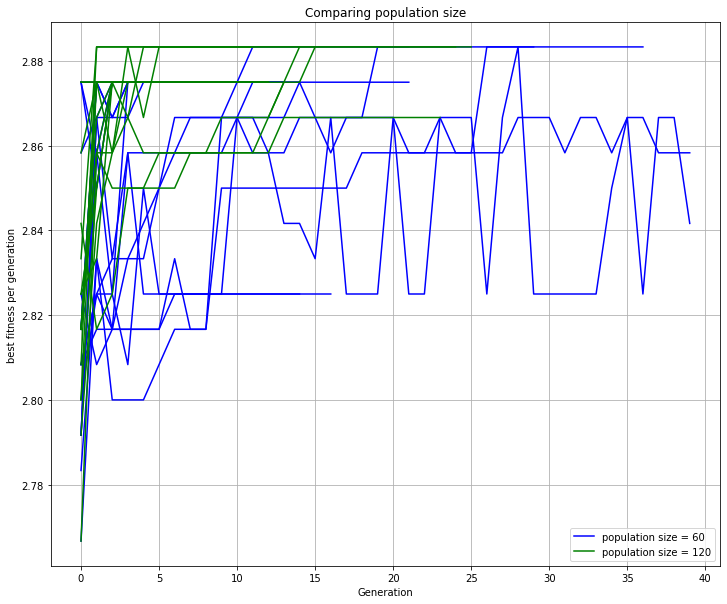

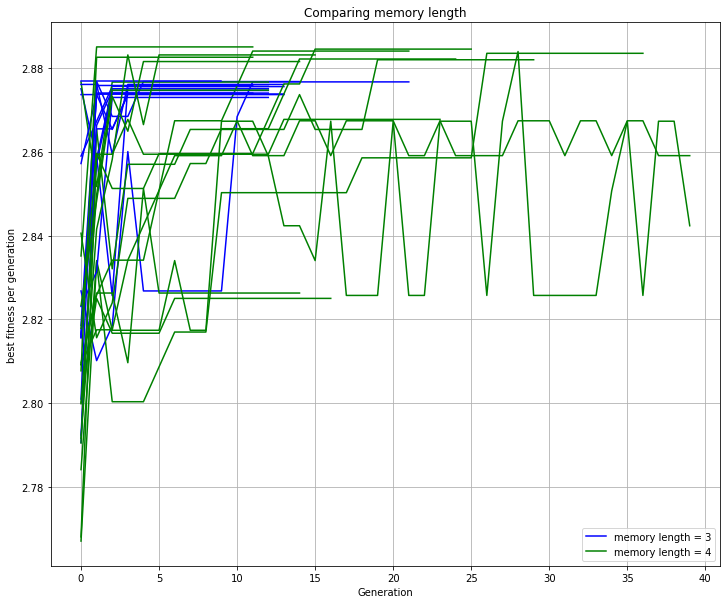

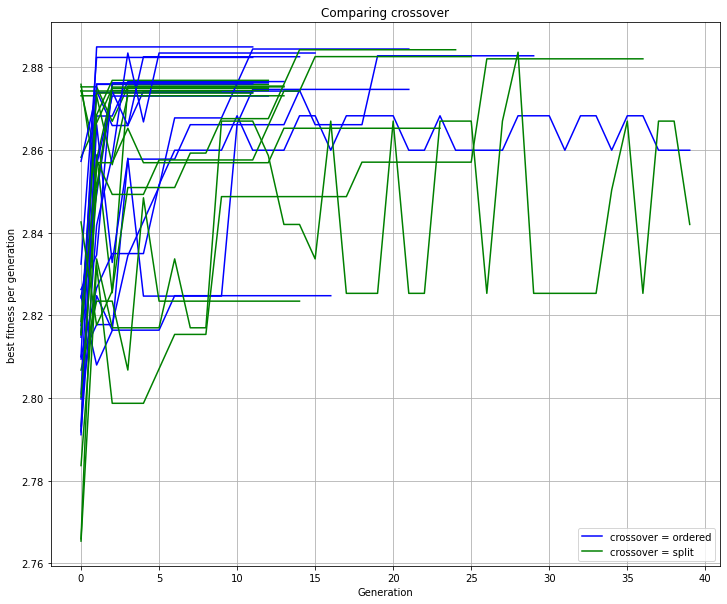

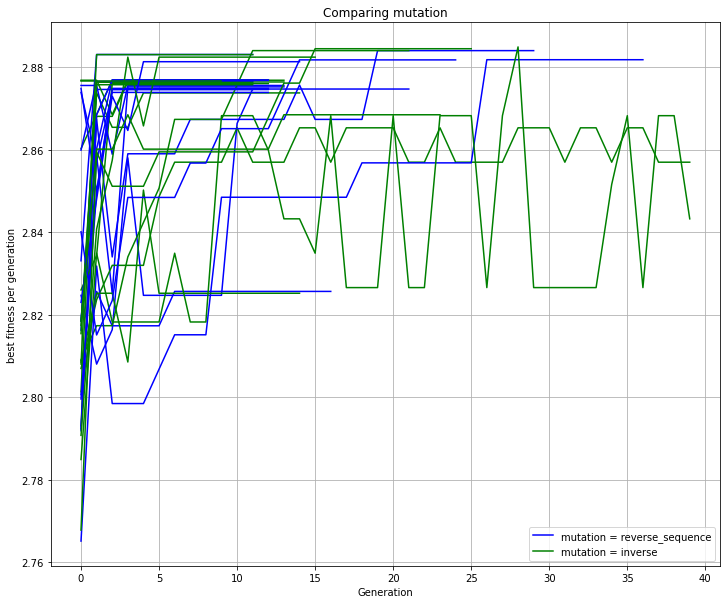

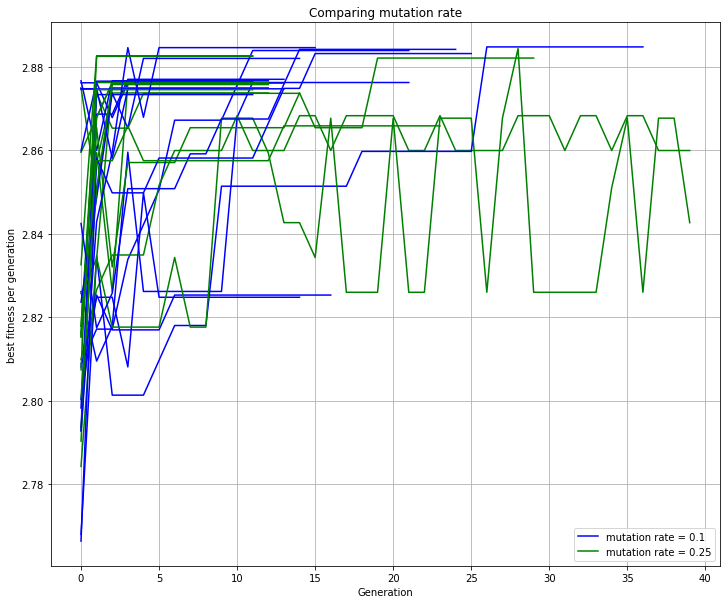

In [120]:
"""
Plotting best population fitness over generations
""" 

plot(results, 'population size', 'best fitness per generation', 0)
plot(results, 'memory length', 'best fitness per generation', 0.002)
plot(results, 'crossover', 'best fitness per generation', 0.002)
plot(results, 'mutation', 'best fitness per generation', 0.002)
plot(results, 'mutation rate', 'best fitness per generation', 0.002)

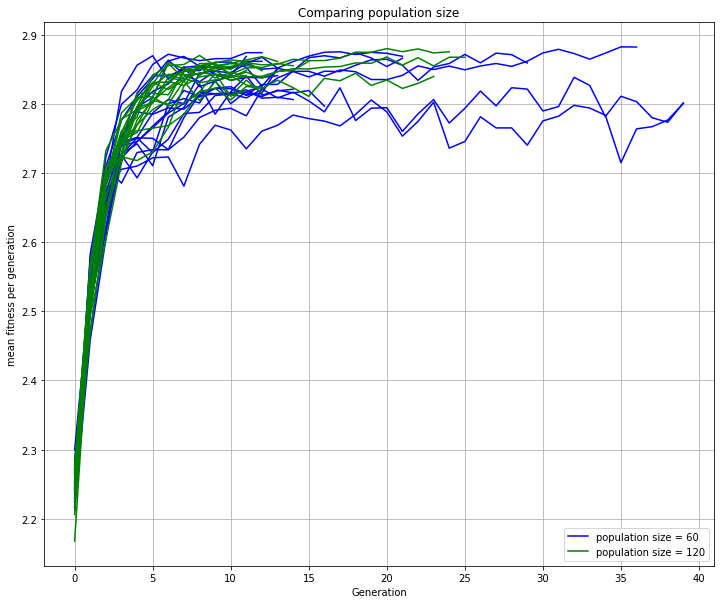

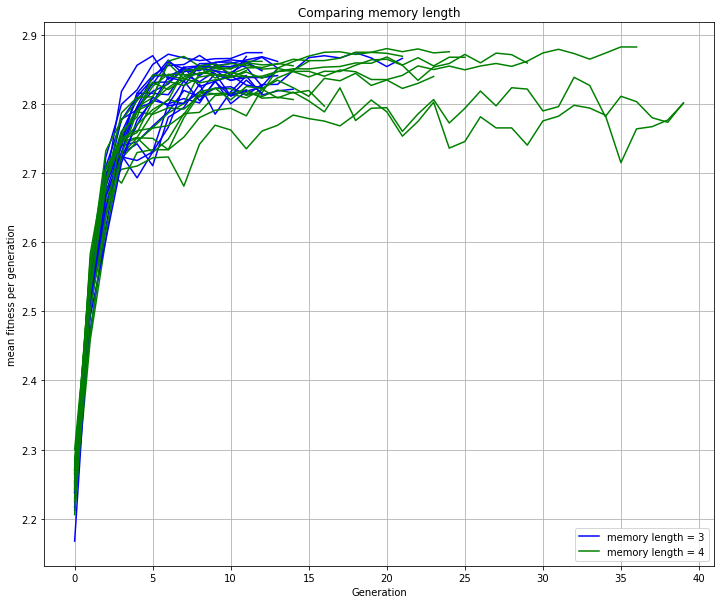

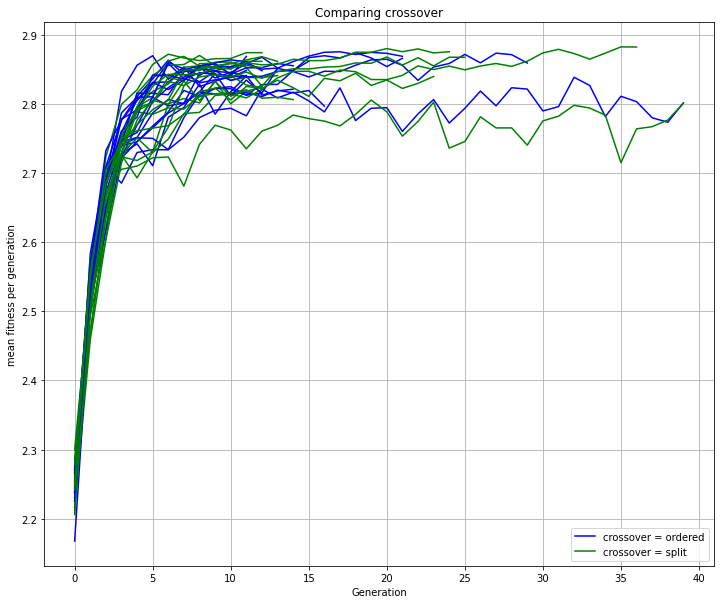

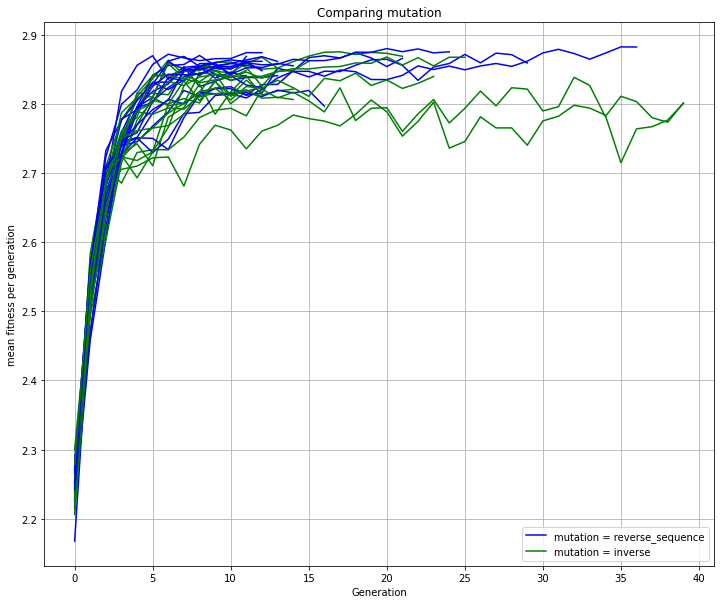

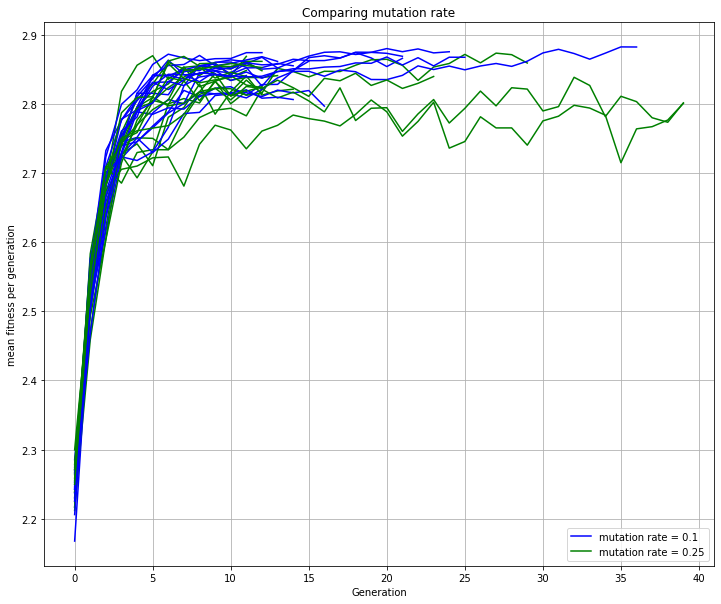

In [121]:
"""
Plotting mean population fitness over generations
""" 

plot(results, 'population size', 'mean fitness per generation', 0)
plot(results, 'memory length', 'mean fitness per generation', 0)
plot(results, 'crossover', 'mean fitness per generation', 0)
plot(results, 'mutation', 'mean fitness per generation', 0)
plot(results, 'mutation rate', 'mean fitness per generation', 0)

[0, 0, 0, 0, 1, 1, 0, 1, 0]


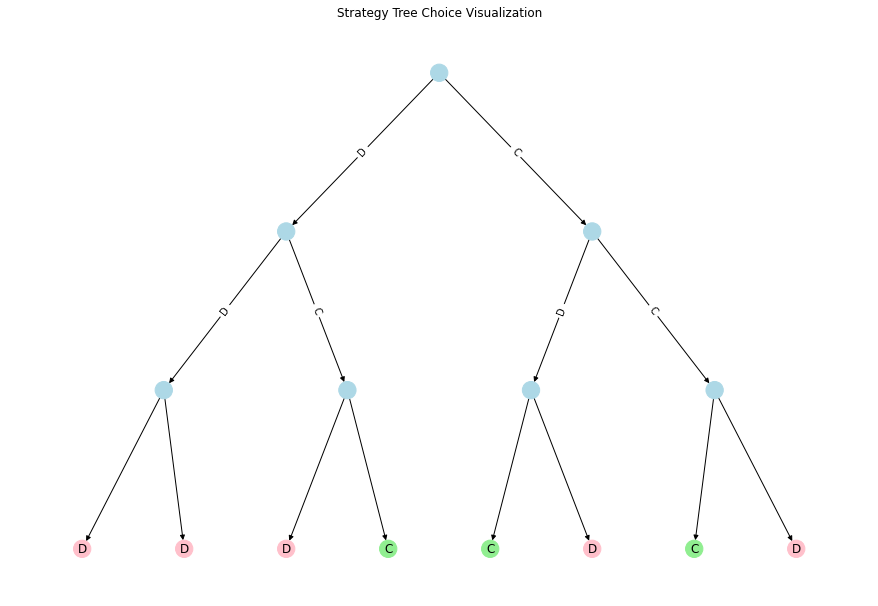

[0, 0, 0, 0, 1, 1, 0, 1, 0]


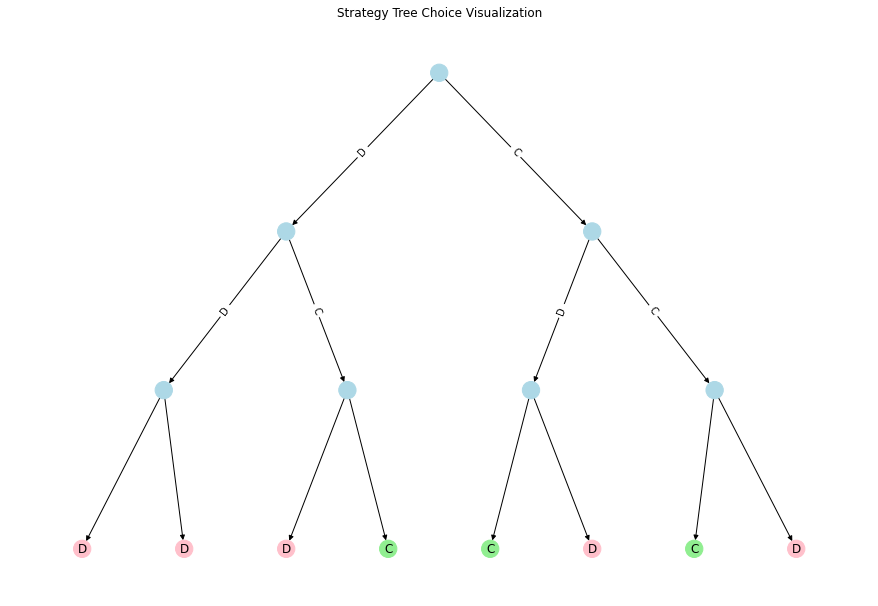

[0, 0, 0, 0, 1, 1, 0, 1, 0]


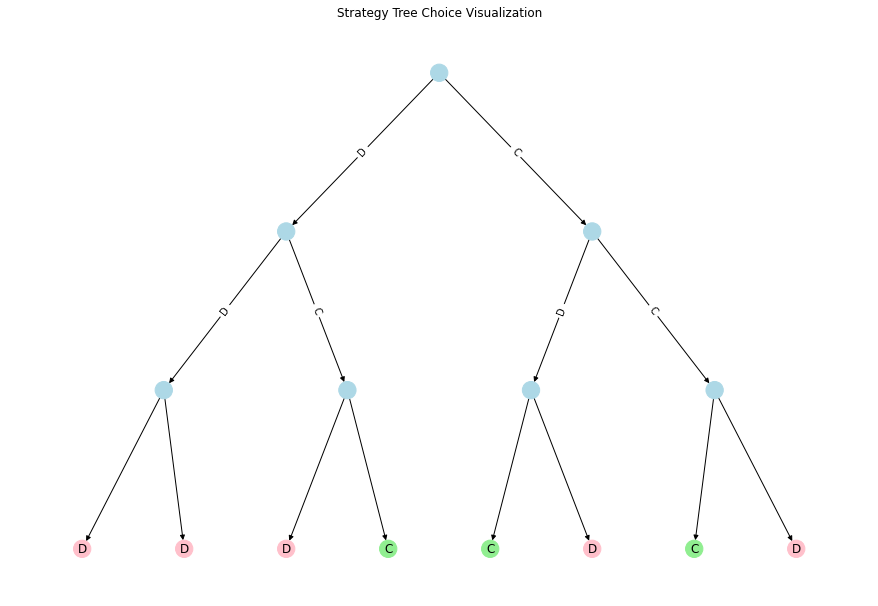

[0, 0, 0, 0, 1, 1, 0, 1, 0]


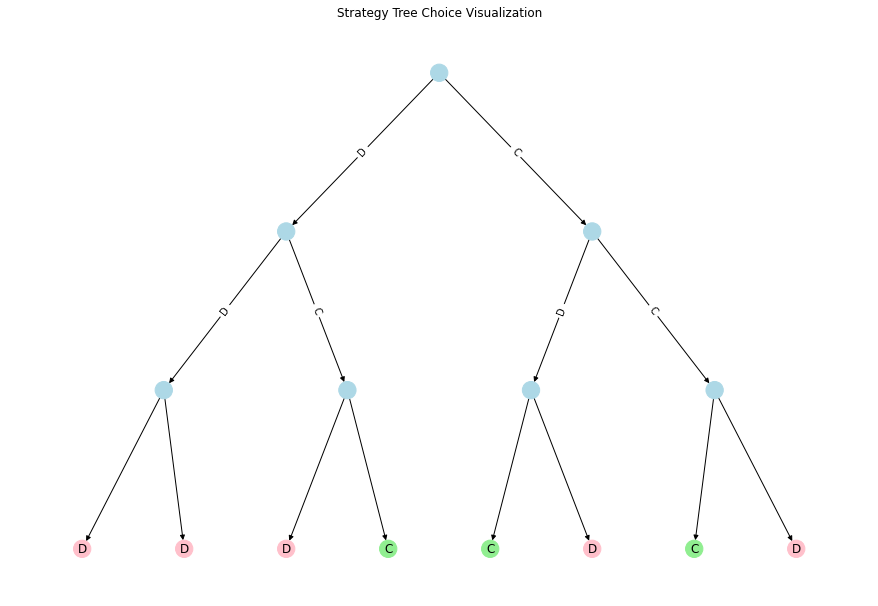

[0, 0, 1, 1, 1, 0, 0, 1, 0]


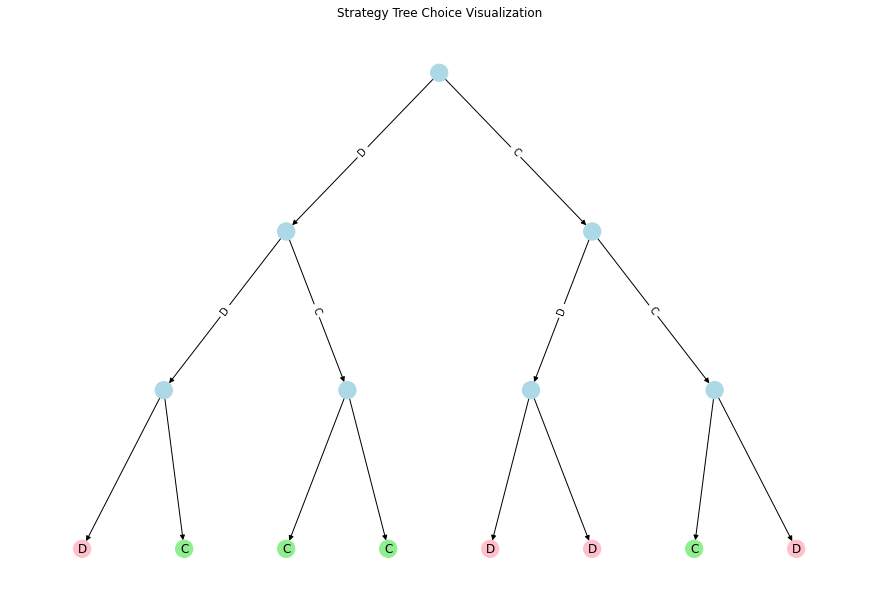

[0, 0, 0, 0, 1, 1, 0, 1, 0]


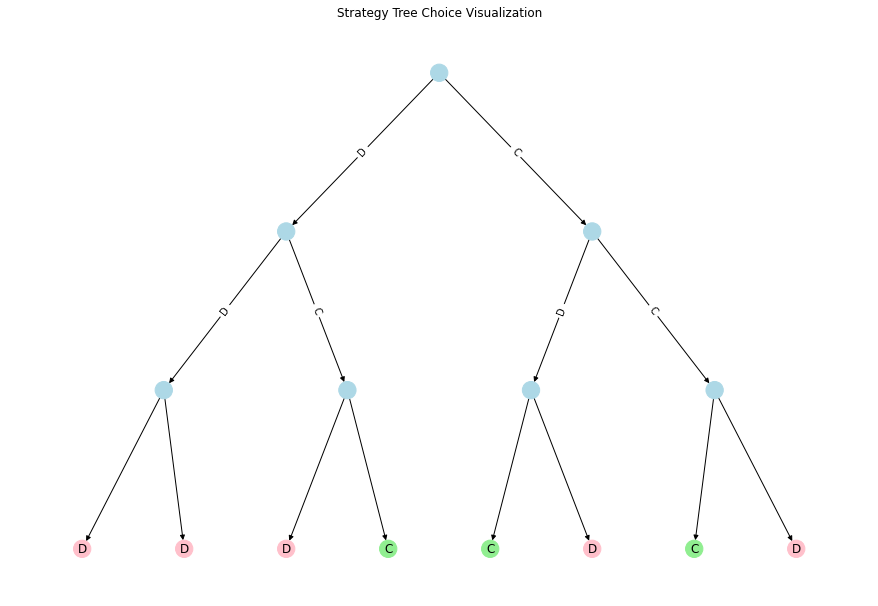

[0, 0, 0, 0, 1, 1, 0, 1, 0]


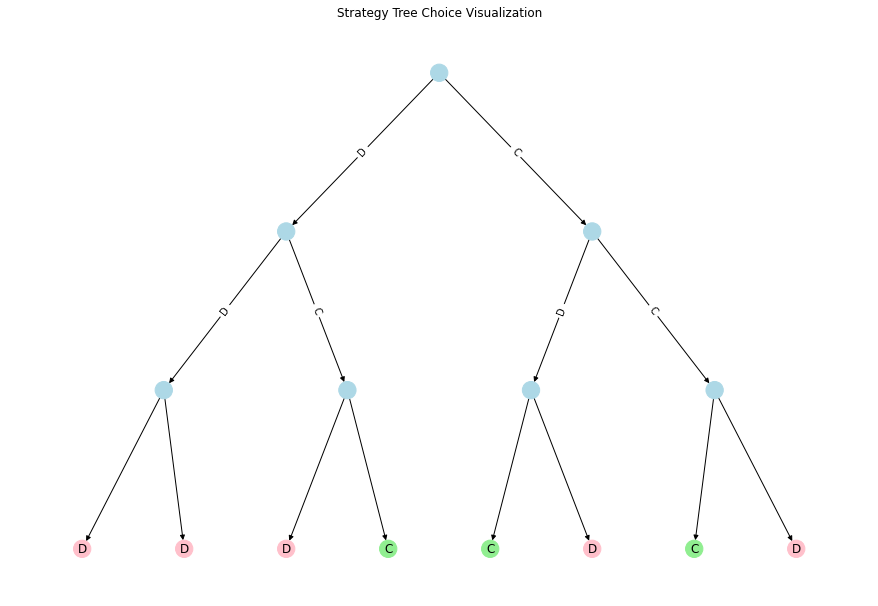

[0, 0, 0, 0, 1, 1, 0, 1, 0]


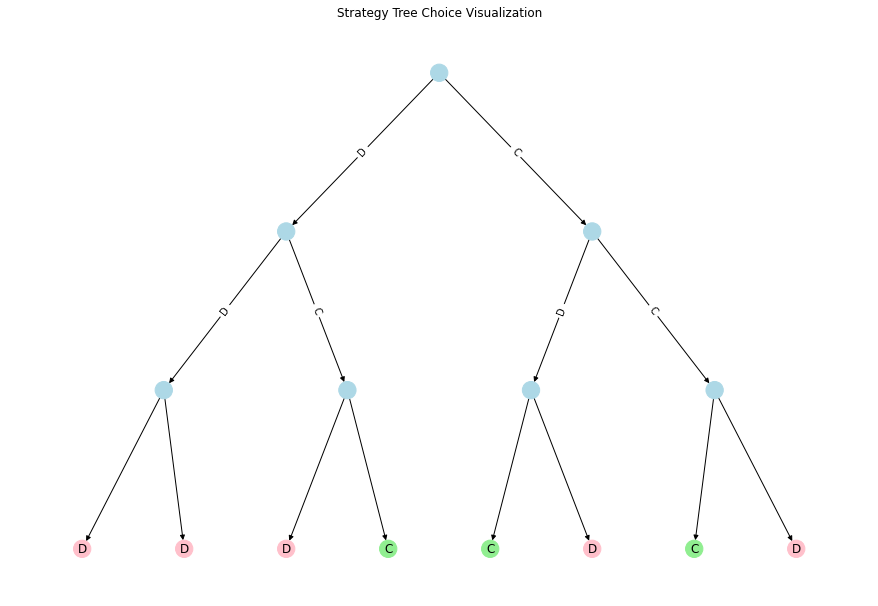

[0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0]


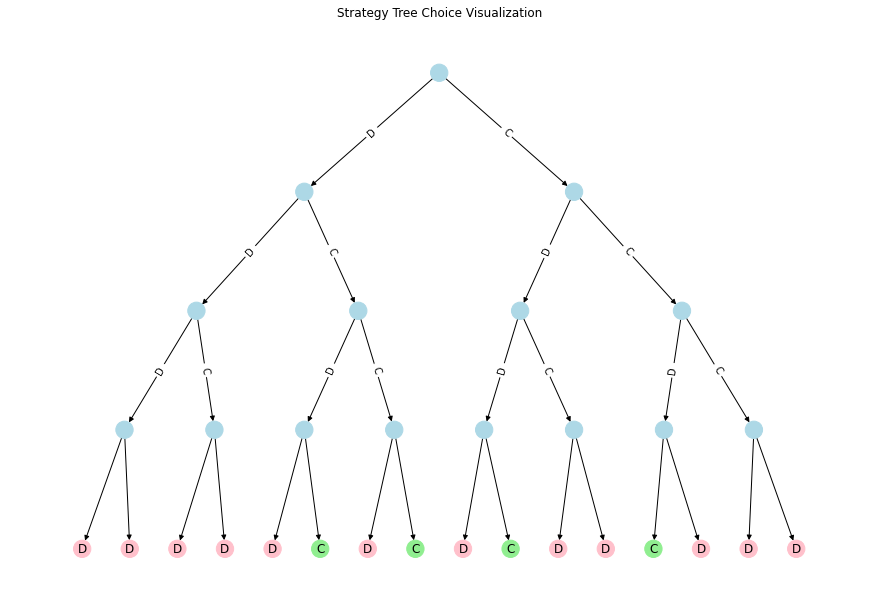

[0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]


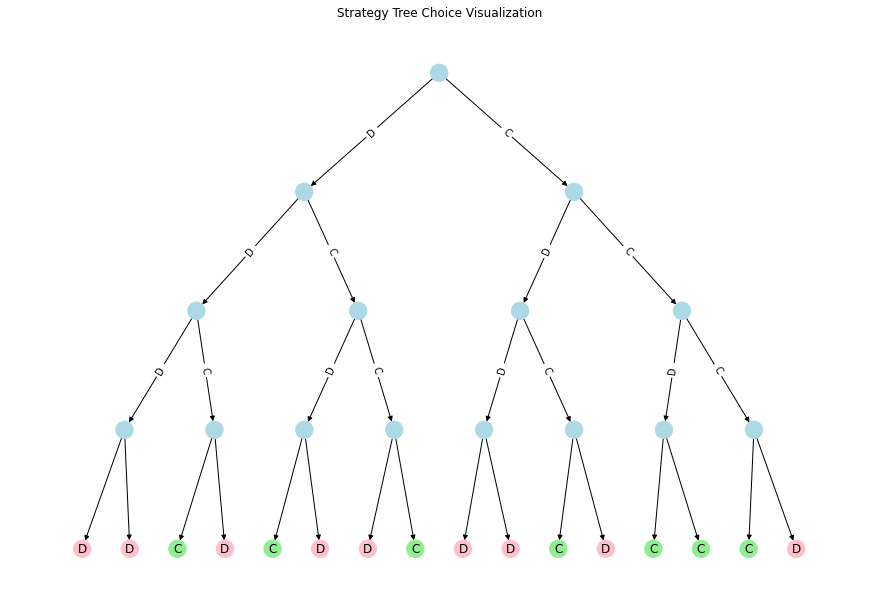

[0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0]


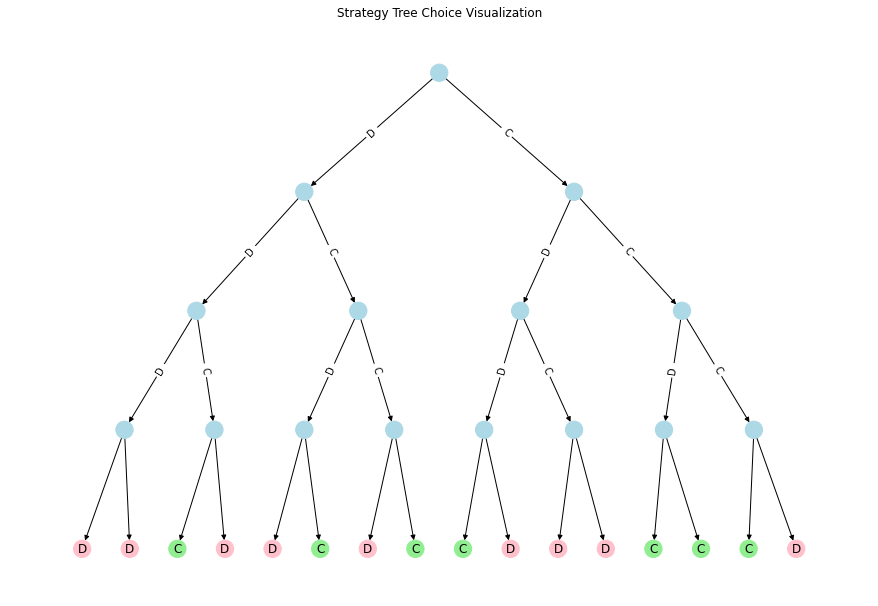

[0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0]


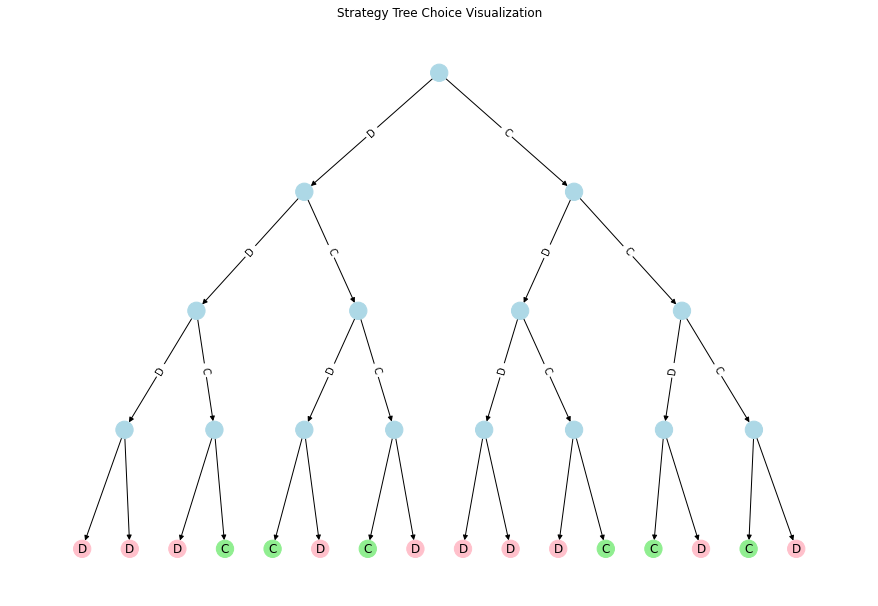

[0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]


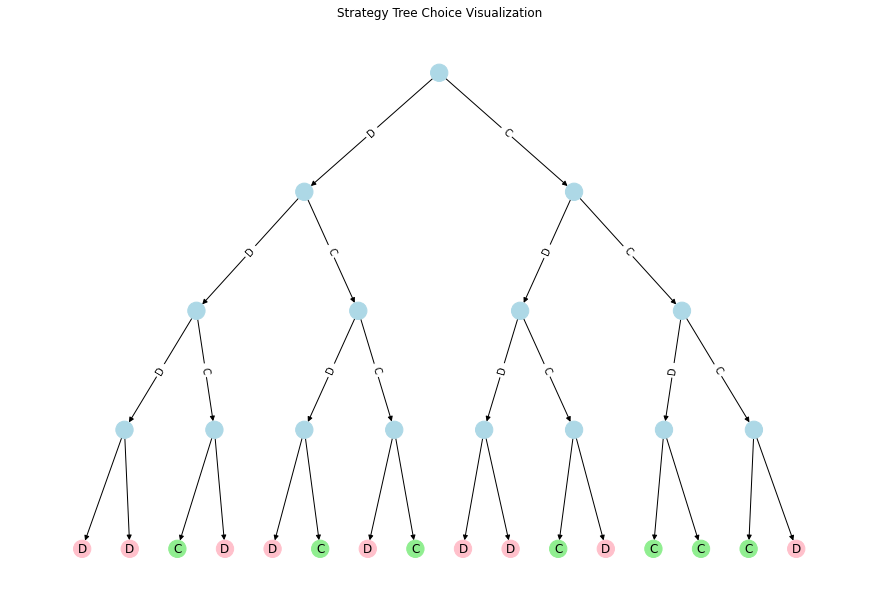

[0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0]


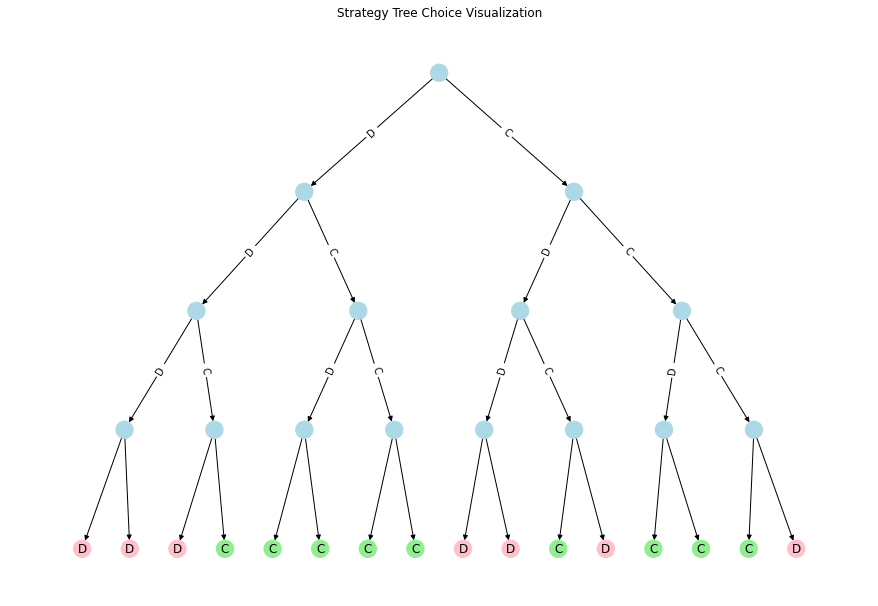

[1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0]


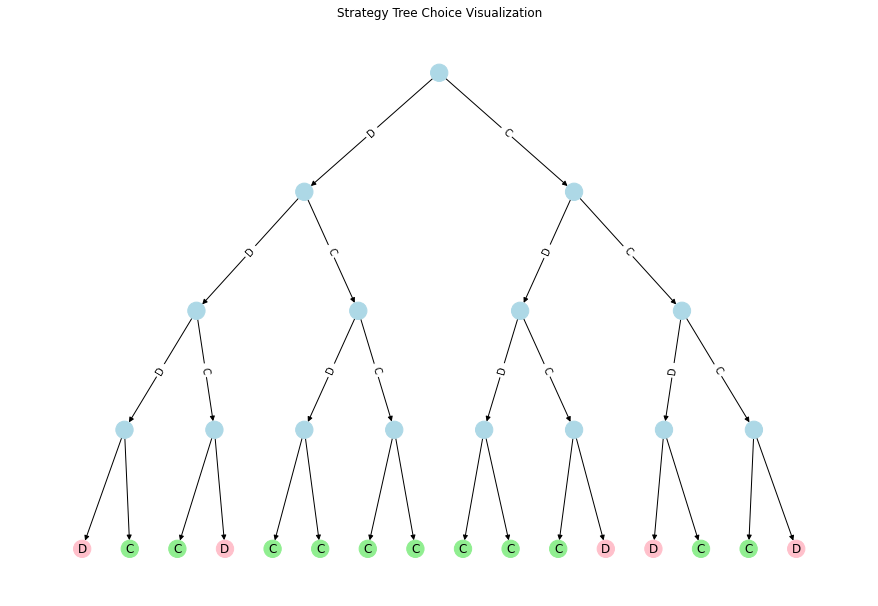

[0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0]


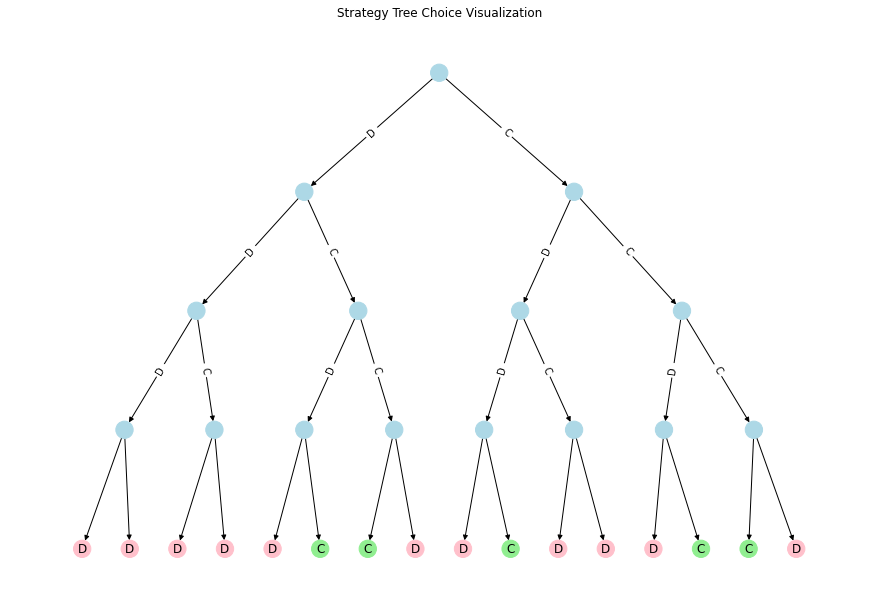

[0, 0, 0, 0, 1, 1, 0, 1, 0]


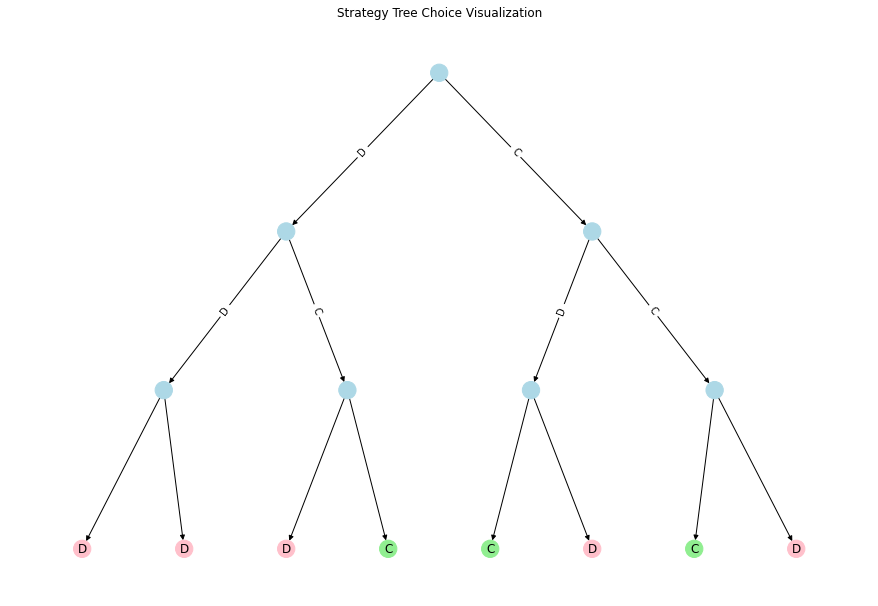

[0, 0, 0, 0, 1, 1, 0, 1, 0]


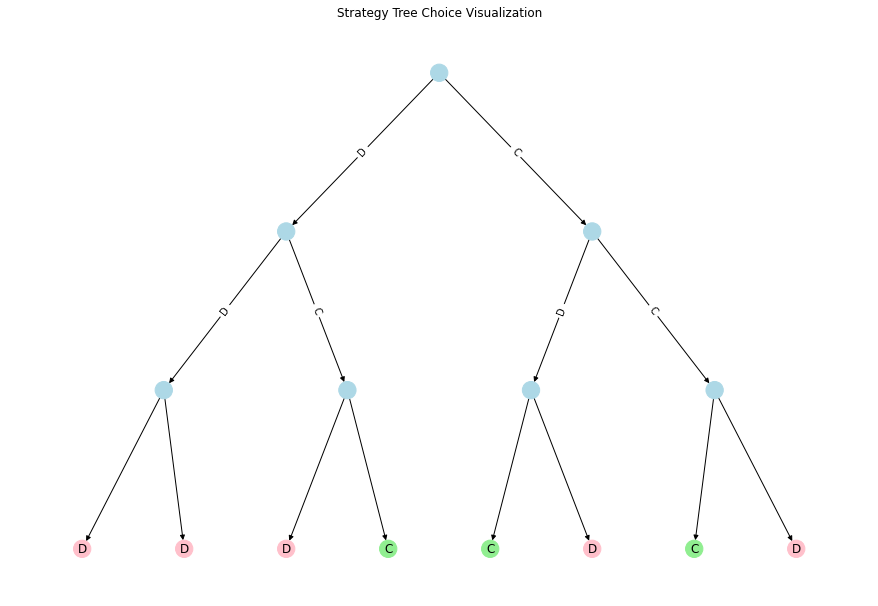

[0, 0, 1, 1, 1, 0, 0, 1, 0]


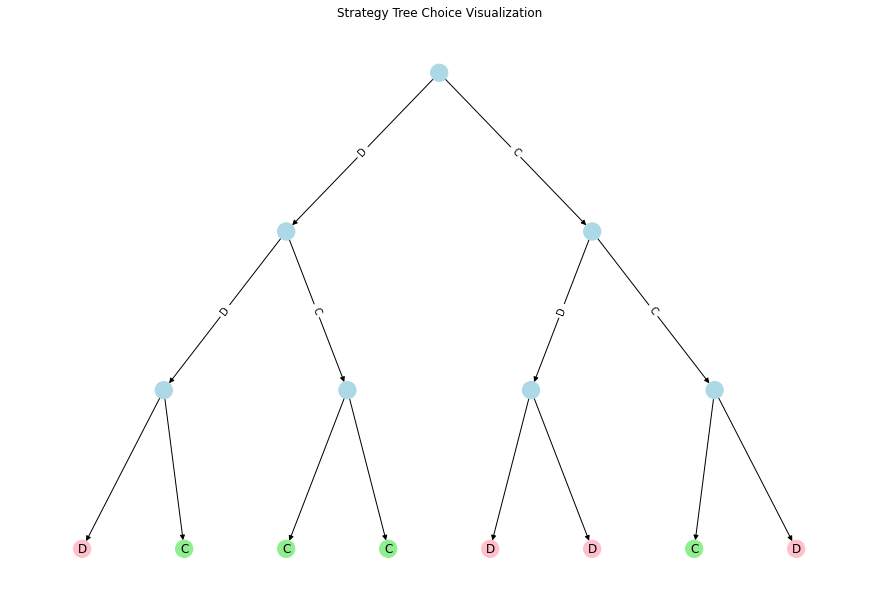

[0, 0, 0, 0, 1, 1, 0, 1, 0]


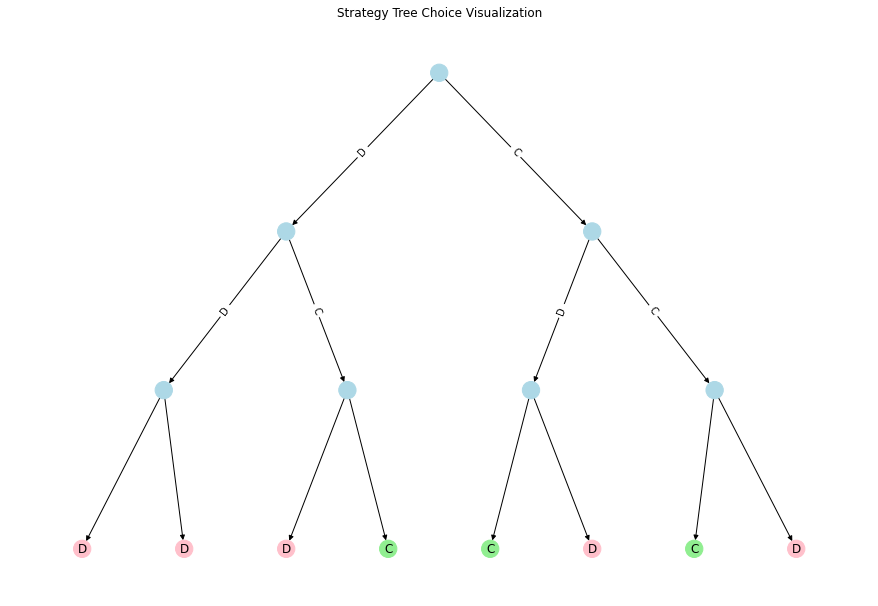

[0, 0, 0, 0, 1, 1, 0, 1, 0]


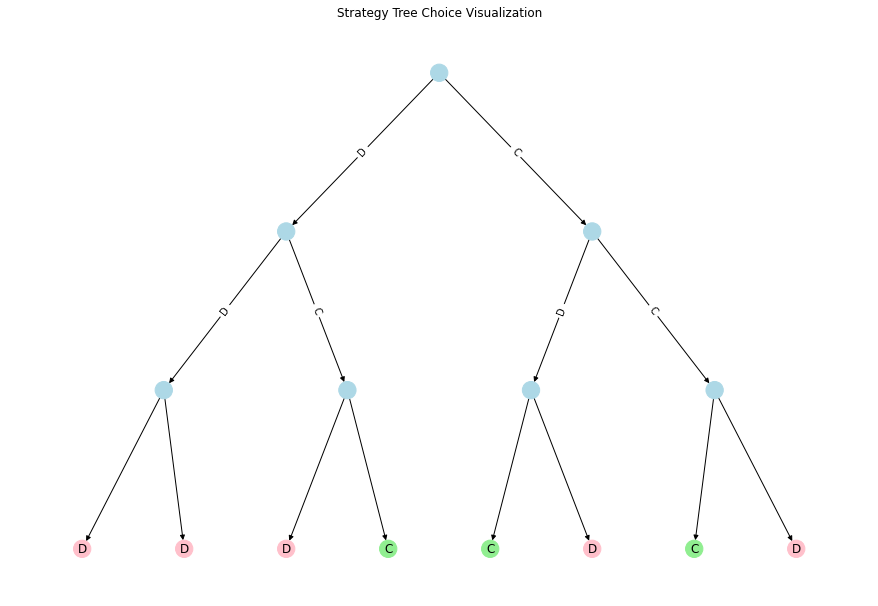

[0, 0, 0, 0, 1, 1, 0, 1, 0]


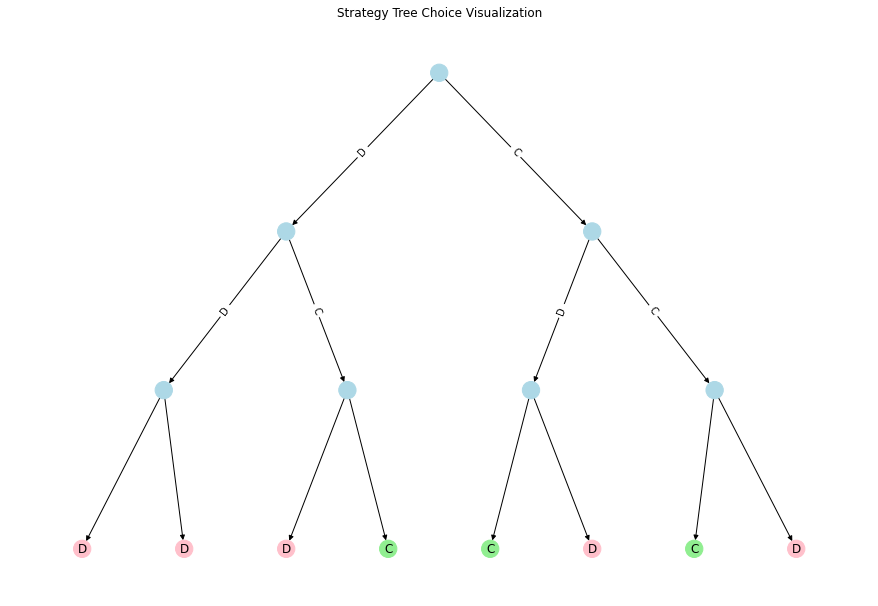

[0, 0, 0, 0, 1, 1, 0, 1, 0]


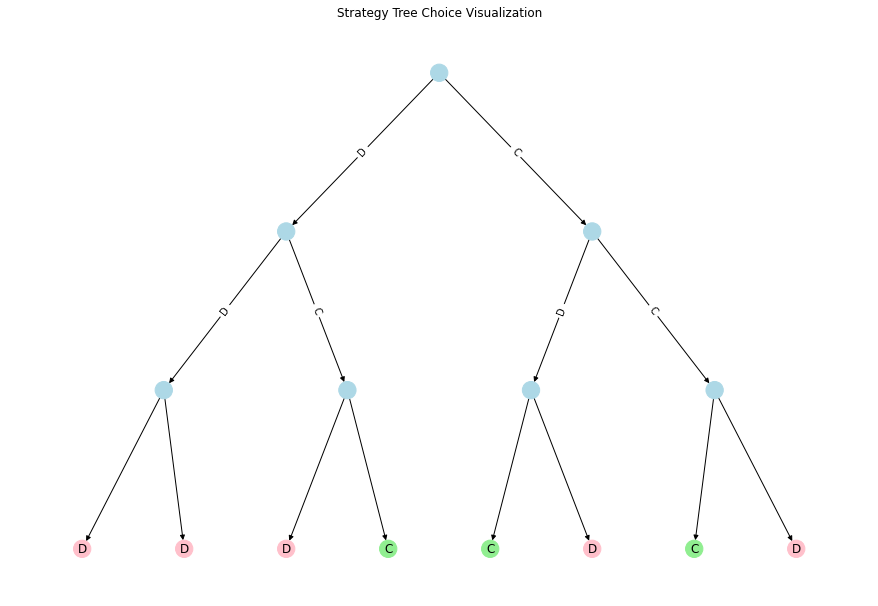

[0, 0, 1, 1, 1, 0, 0, 1, 0]


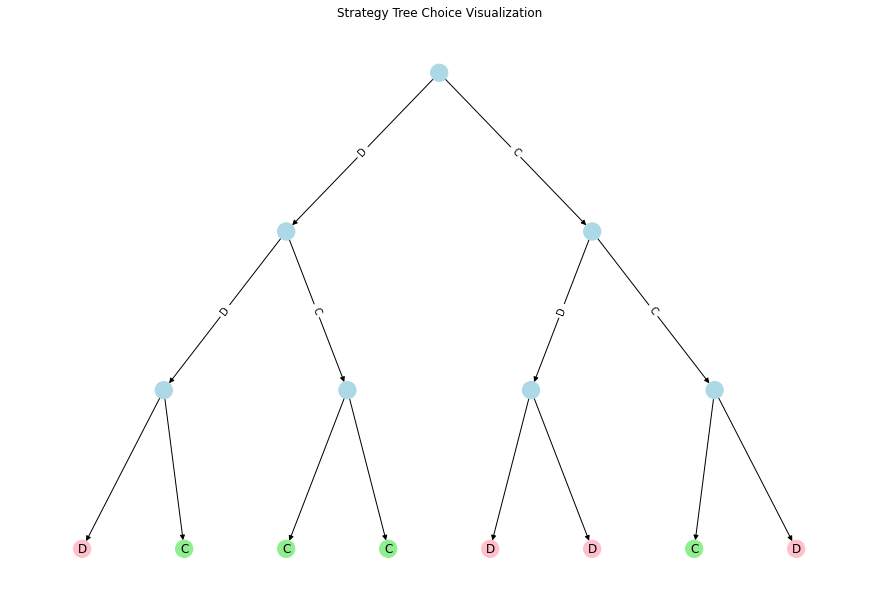

[0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0]


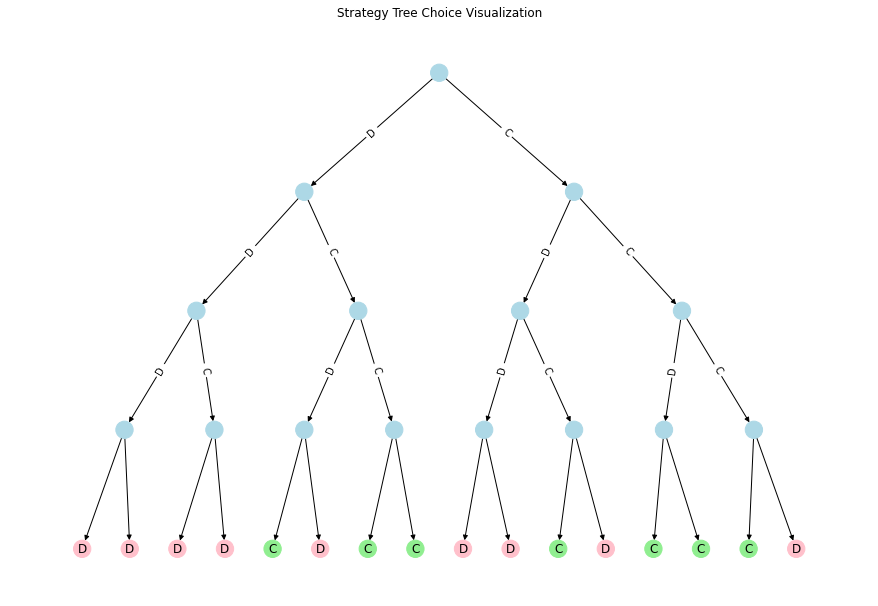

[0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0]


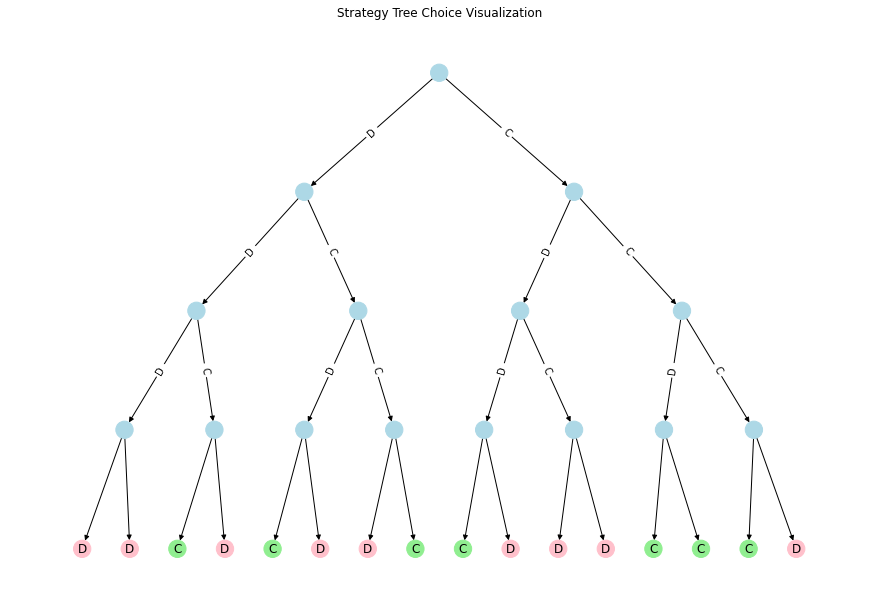

[0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0]


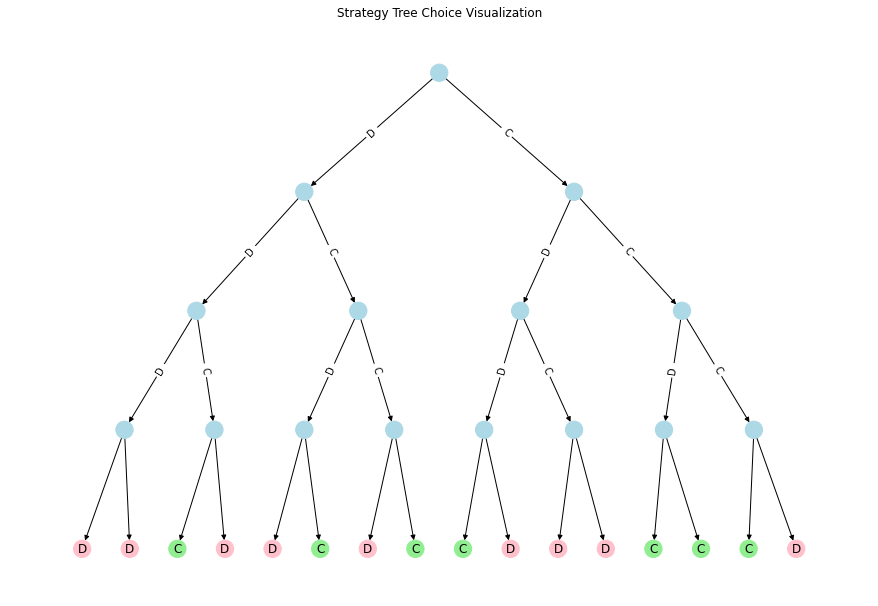

[0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0]


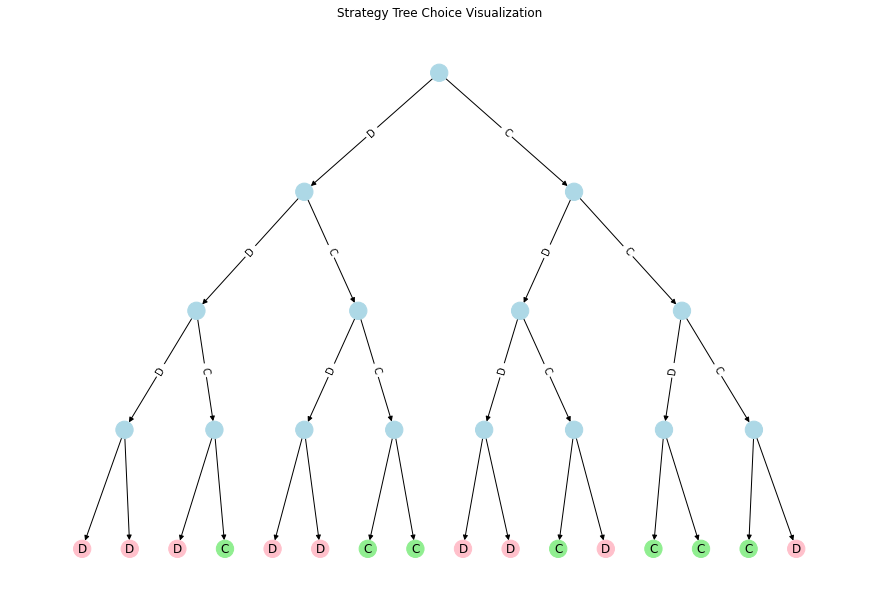

[0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0]


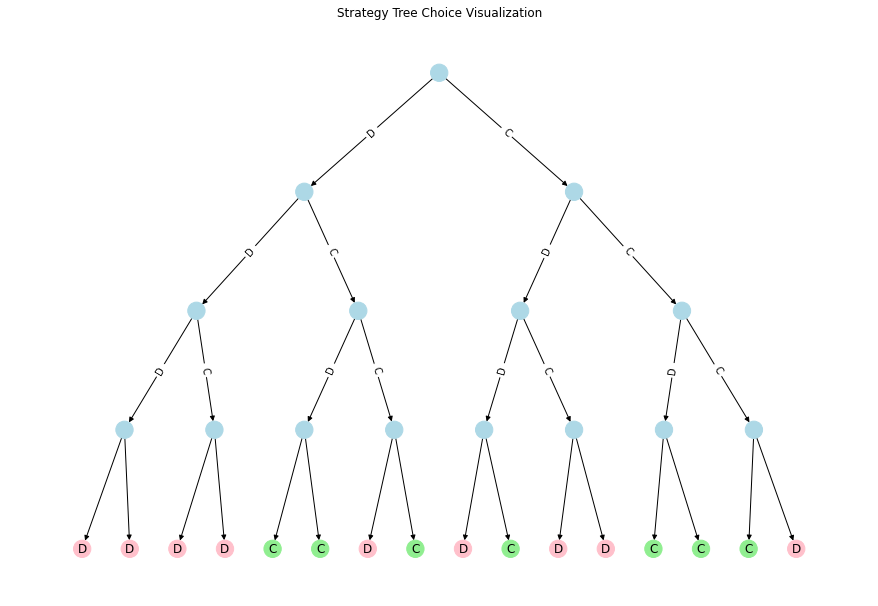

[0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0]


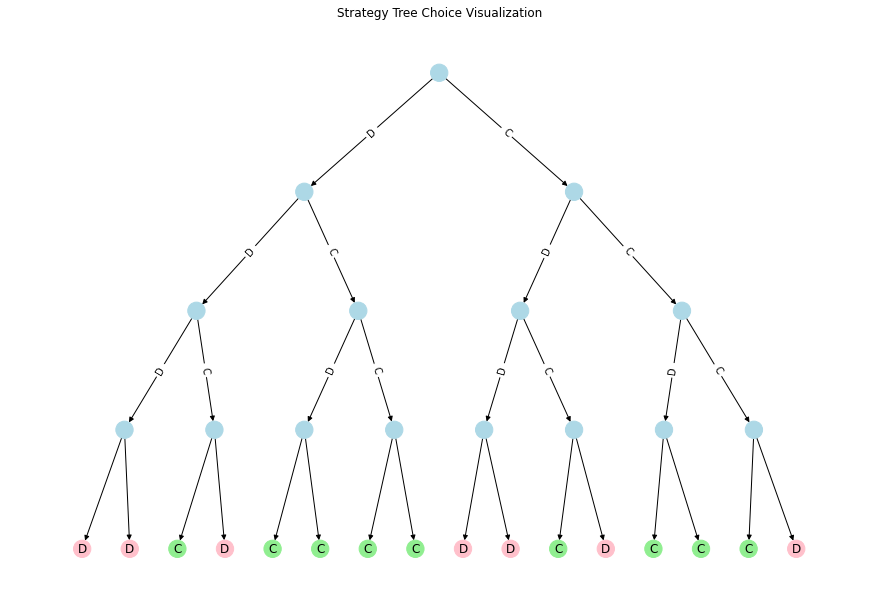

[0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]


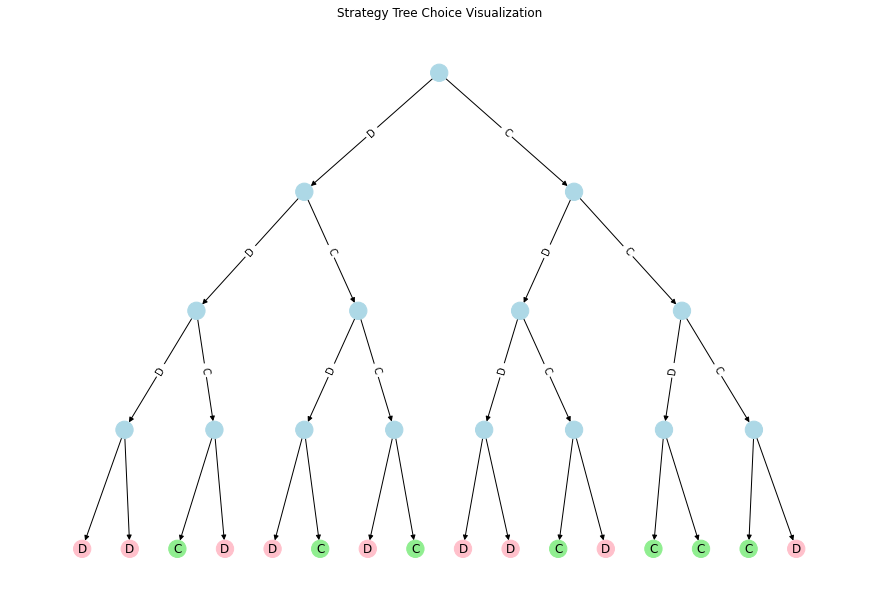

[0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0]


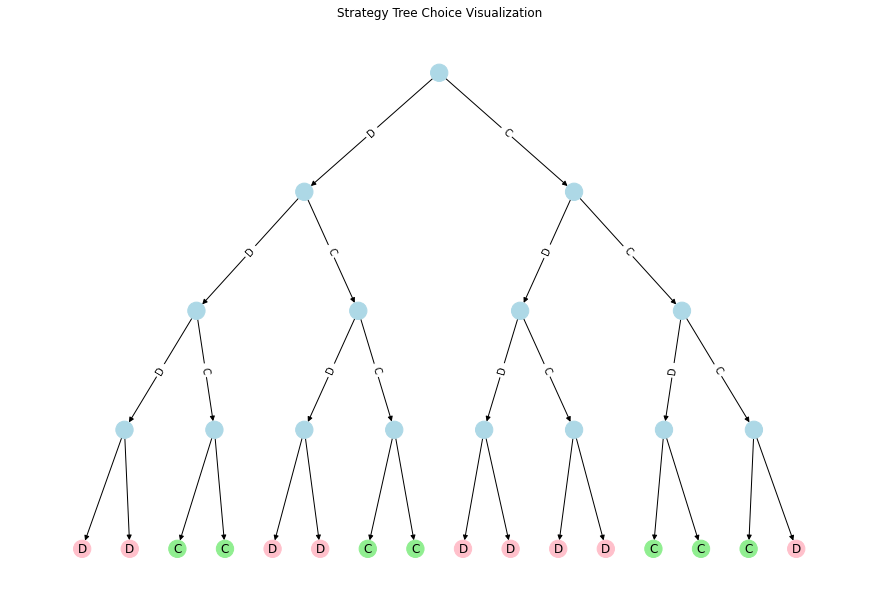

In [122]:
for best_result in results:
    best_strategy = best_result['strategy']
    print(best_strategy)
    binary_tree_plot(best_strategy)

In [123]:
"""
COOPERATIVE POPULATION

GRID SEARCH ALL HYPERPARAMETER COMBINATIONS 
""" 

results_c = []

for population_size in population_sizes:
    for memory_length in memory_lengths:
        for crossover_operator in crossover_operators:
            for mutation_operator in mutation_operators:
                for mutation_rate in mutation_rates:
                    
                    print("Population =", population_size, "\nMemory =", memory_length, "\nCrossover Operator =", crossover_operator, "\nMutation Operator =", mutation_operator, "\nMutation Rate =", mutation_rate)
                    
                    start_time = time.time()
                    result, best_strategy = run_genetic_algorithm(population_size, 40, memory_length, 40,
                                                                  crossover_operator, mutation_operator, mutation_rate,
                                                                 fitness_c)
                    print("Best Strategy =", best_strategy, "\nFitness =", fitness(best_strategy, 40), "\nTime Taken = ", round(time.time()-start_time), "seconds\n")
                    
                    results_c.append({
                        'strategy': best_strategy,
                        'best fitness per generation': result['gen_best_fitnesses'],
                        'mean fitness per generation': result['gen_mean_fitnesses'],
                        'population size': population_size,
                        'memory length': memory_length,
                        'crossover': crossover_operator,
                        'mutation': mutation_operator,
                        'mutation rate': mutation_rate
                    })

Population = 60 
Memory = 3 
Crossover Operator = ordered 
Mutation Operator = reverse_sequence 
Mutation Rate = 0.1
Best Strategy = [0, 0, 0, 0, 1, 1, 0, 1, 0] 
Fitness = 2.875 
Time Taken =  2 seconds

Population = 60 
Memory = 3 
Crossover Operator = ordered 
Mutation Operator = reverse_sequence 
Mutation Rate = 0.25
Best Strategy = [0, 0, 0, 0, 1, 1, 0, 1, 0] 
Fitness = 2.875 
Time Taken =  2 seconds

Population = 60 
Memory = 3 
Crossover Operator = ordered 
Mutation Operator = inverse 
Mutation Rate = 0.1
Best Strategy = [0, 0, 0, 0, 1, 1, 0, 1, 0] 
Fitness = 2.875 
Time Taken =  2 seconds

Population = 60 
Memory = 3 
Crossover Operator = ordered 
Mutation Operator = inverse 
Mutation Rate = 0.25
Best Strategy = [0, 0, 0, 0, 1, 1, 0, 1, 0] 
Fitness = 2.875 
Time Taken =  3 seconds

Population = 60 
Memory = 3 
Crossover Operator = split 
Mutation Operator = reverse_sequence 
Mutation Rate = 0.1
Best Strategy = [0, 0, 0, 0, 1, 1, 0, 1, 0] 
Fitness = 2.875 
Time Taken =  2 seconds

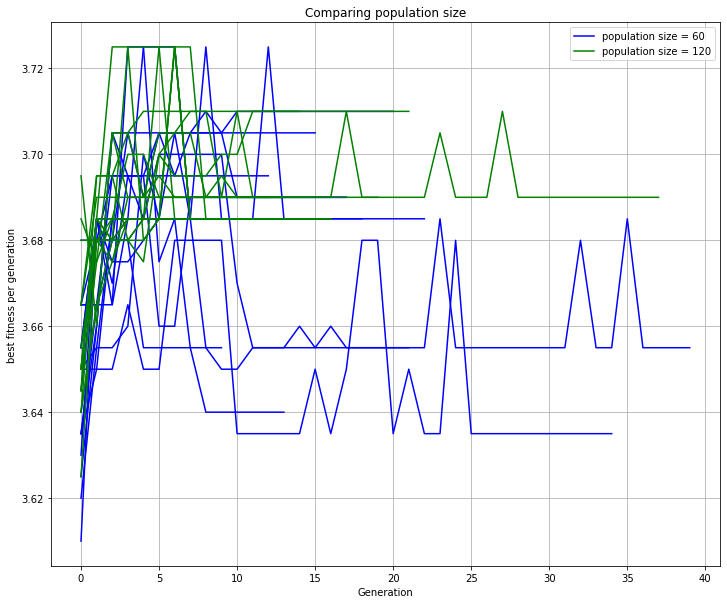

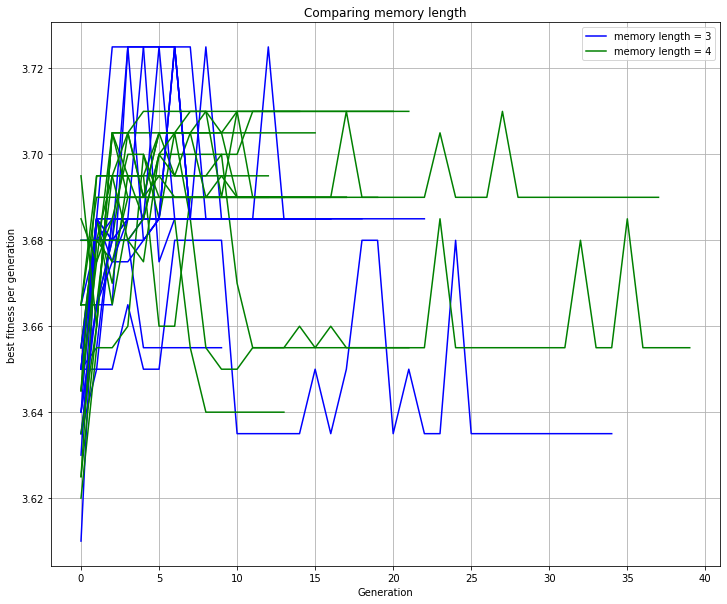

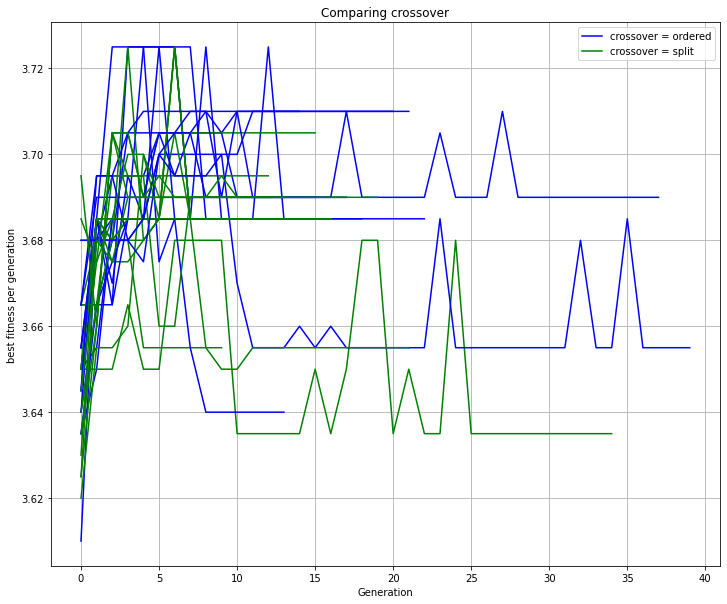

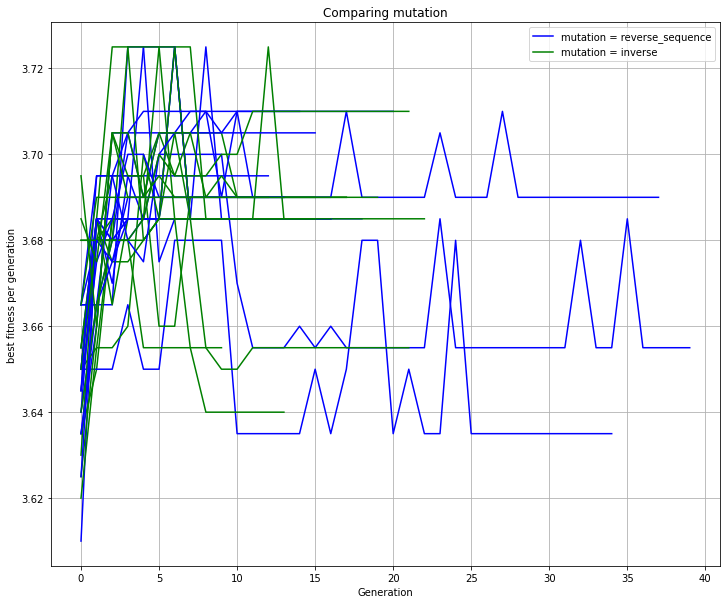

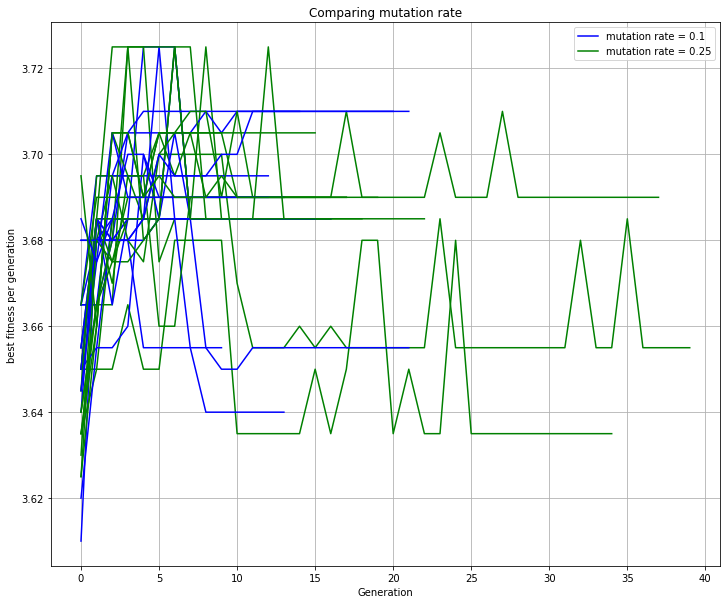

In [124]:
"""
Plotting best population fitness over generations for cooperative population
""" 

plot(results_c, 'population size', 'best fitness per generation', 0)
plot(results_c, 'memory length', 'best fitness per generation', 0)
plot(results_c, 'crossover', 'best fitness per generation', 0)
plot(results_c, 'mutation', 'best fitness per generation', 0)
plot(results_c, 'mutation rate', 'best fitness per generation', 0)

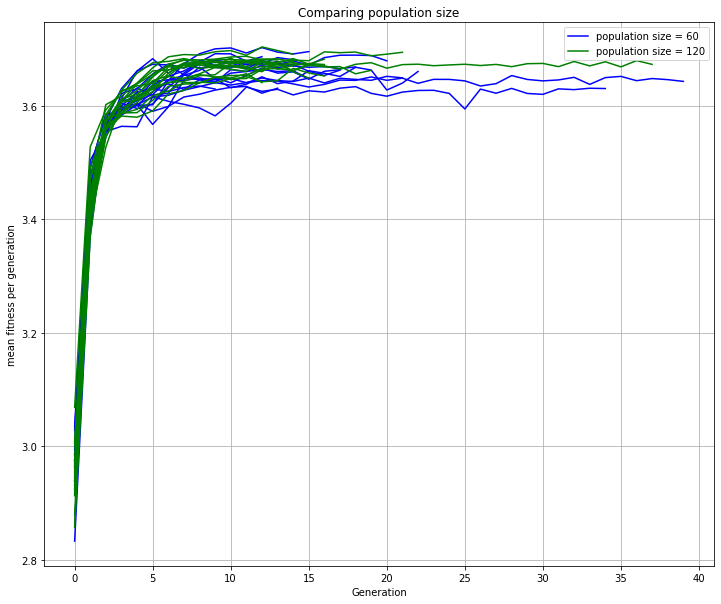

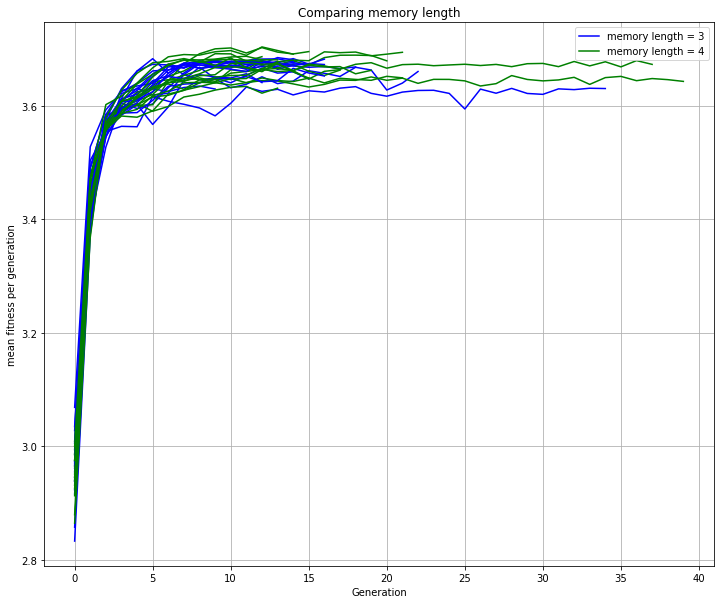

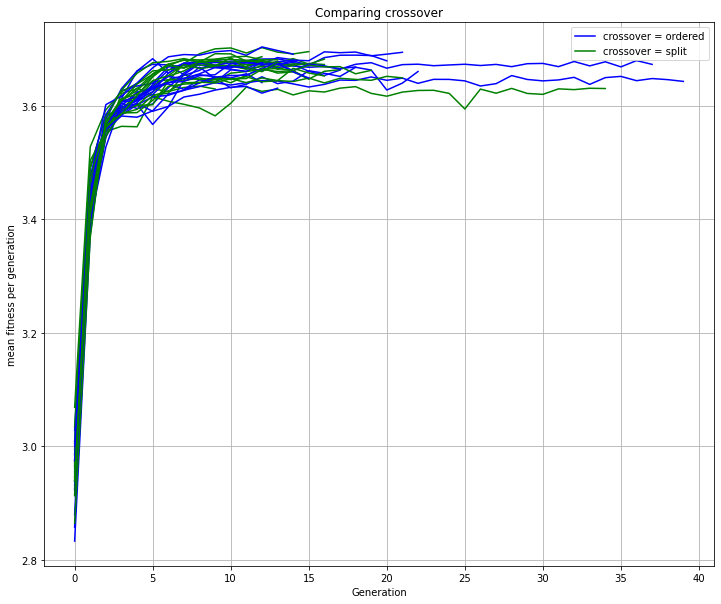

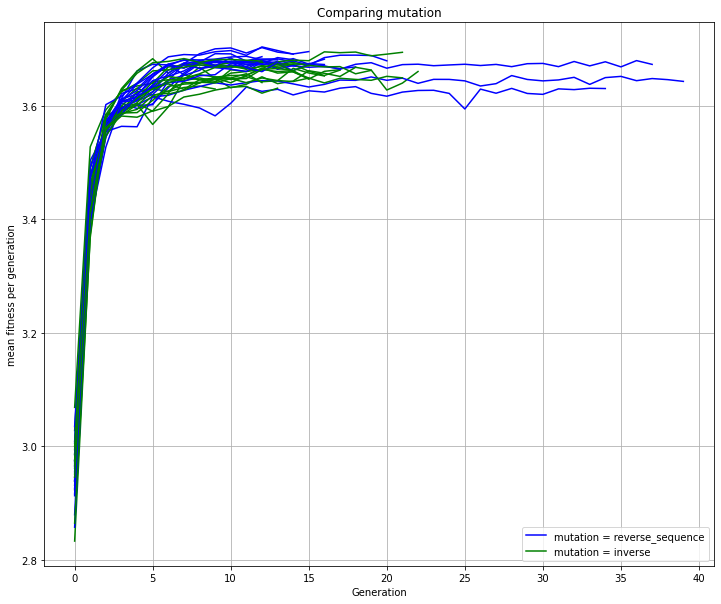

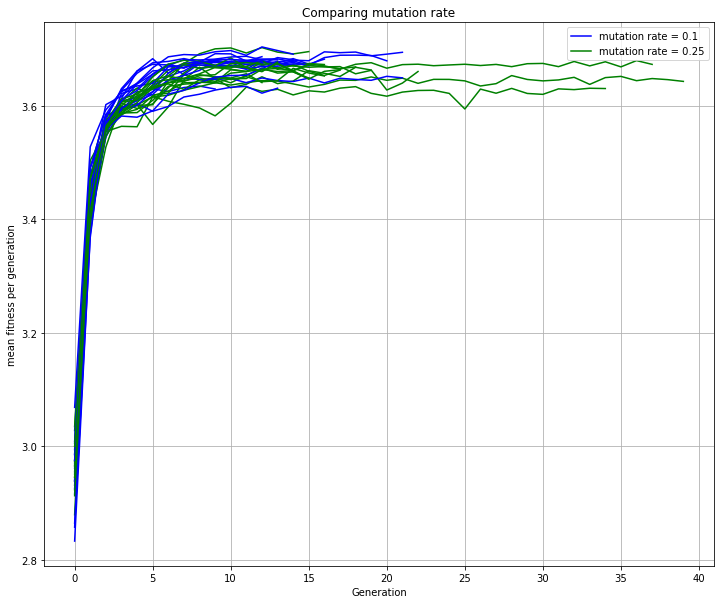

In [125]:
"""
Plotting mean population fitness over generations for cooperative population
""" 

plot(results_c, 'population size', 'mean fitness per generation', 0)
plot(results_c, 'memory length', 'mean fitness per generation', 0)
plot(results_c, 'crossover', 'mean fitness per generation', 0)
plot(results_c, 'mutation', 'mean fitness per generation', 0)
plot(results_c, 'mutation rate', 'mean fitness per generation', 0)

[0, 0, 0, 0, 1, 1, 0, 1, 0]


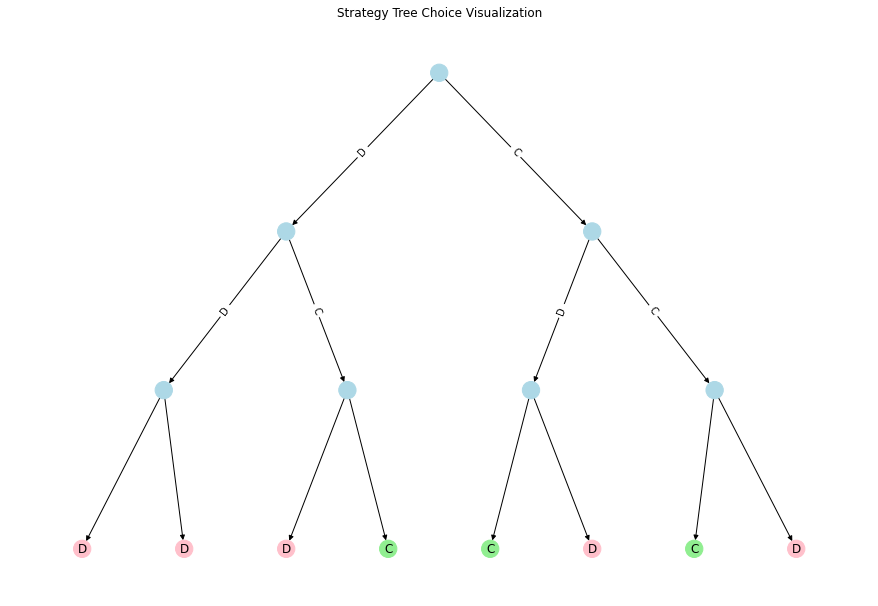

[0, 0, 0, 0, 1, 1, 0, 1, 0]


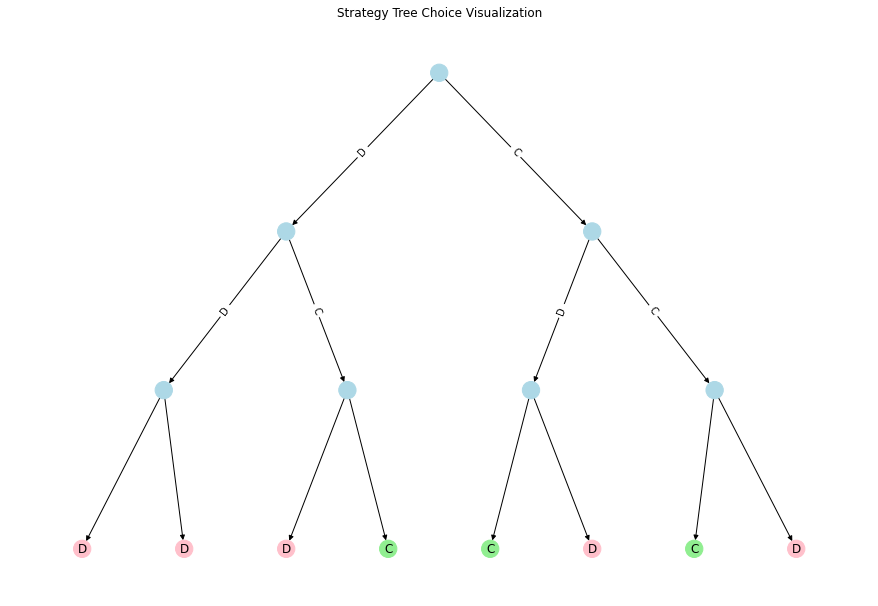

[0, 0, 0, 0, 1, 1, 0, 1, 0]


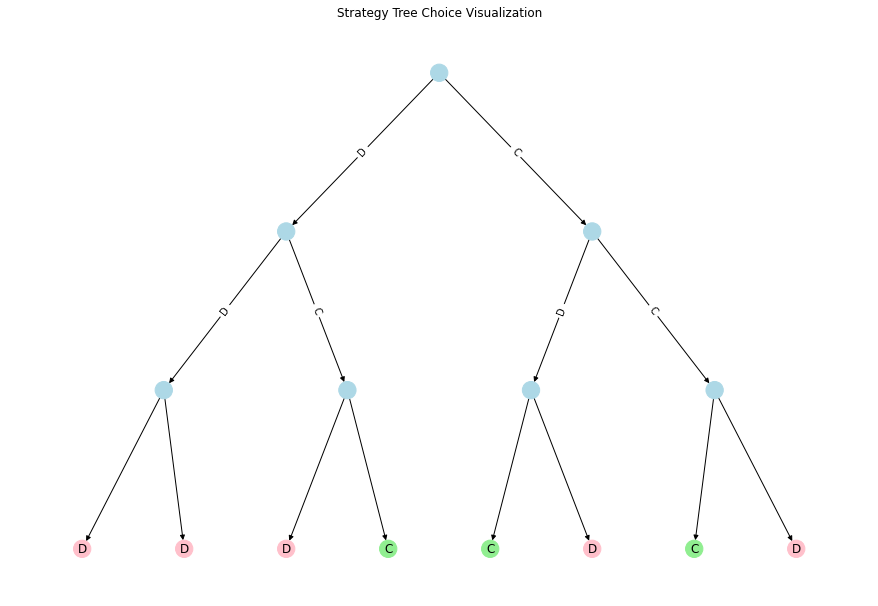

[0, 0, 0, 0, 1, 1, 0, 1, 0]


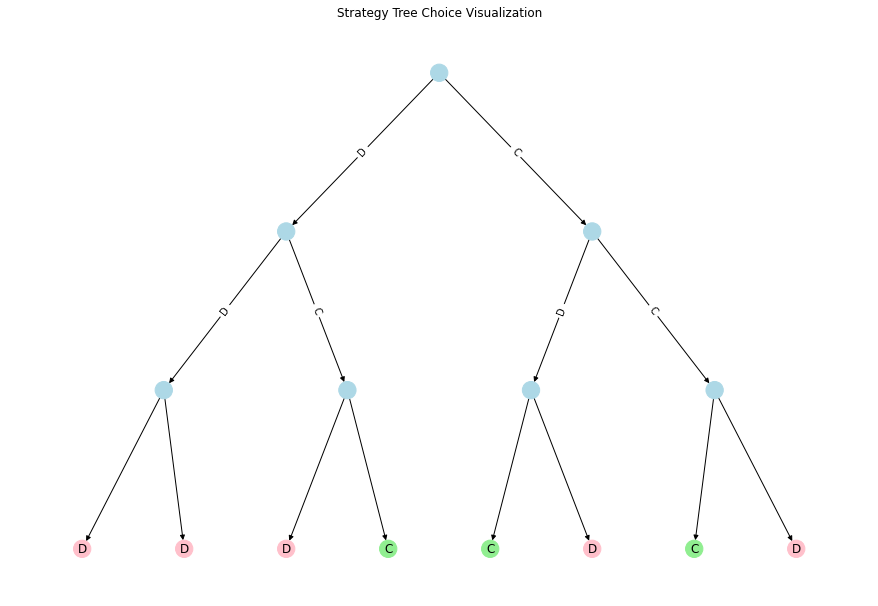

[0, 0, 0, 0, 1, 1, 0, 1, 0]


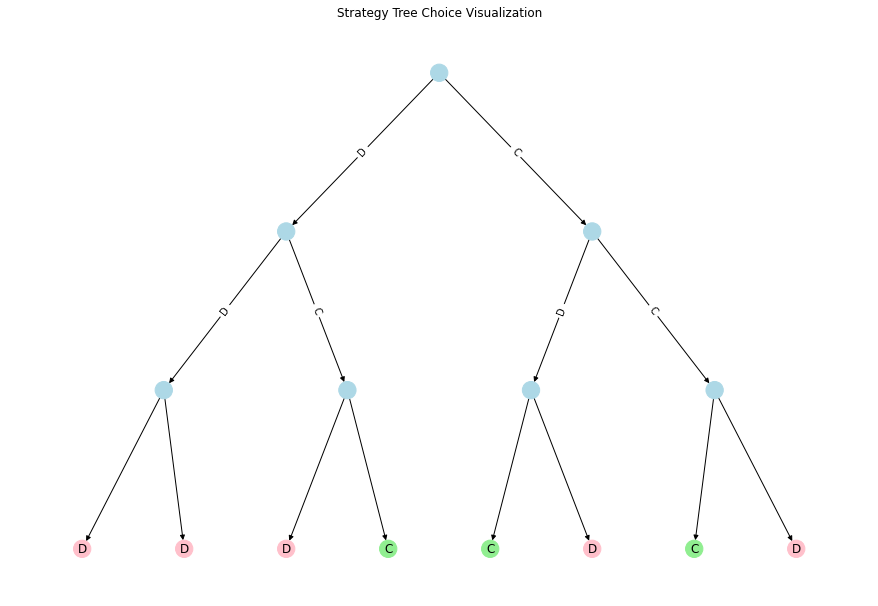

[1, 0, 0, 0, 1, 1, 1, 1, 0]


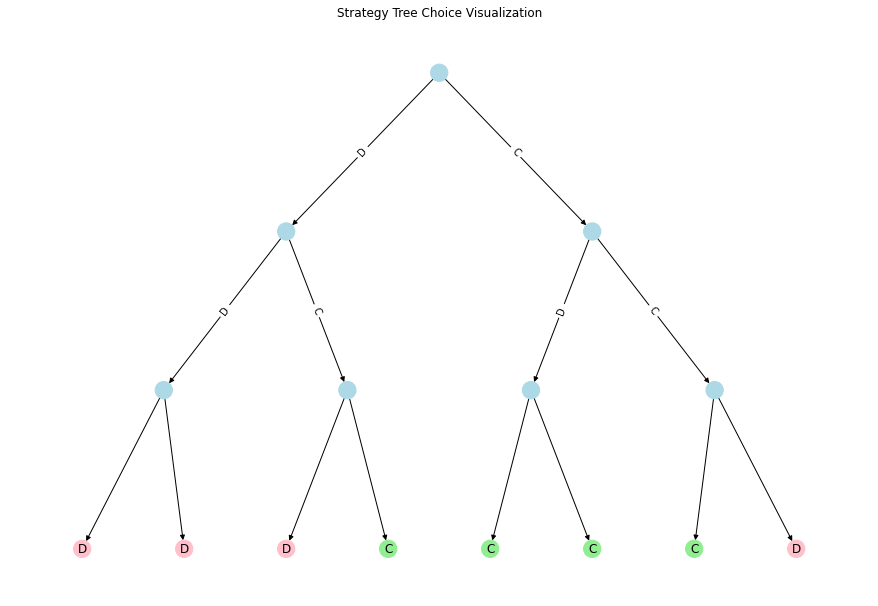

[0, 0, 0, 0, 1, 1, 1, 1, 0]


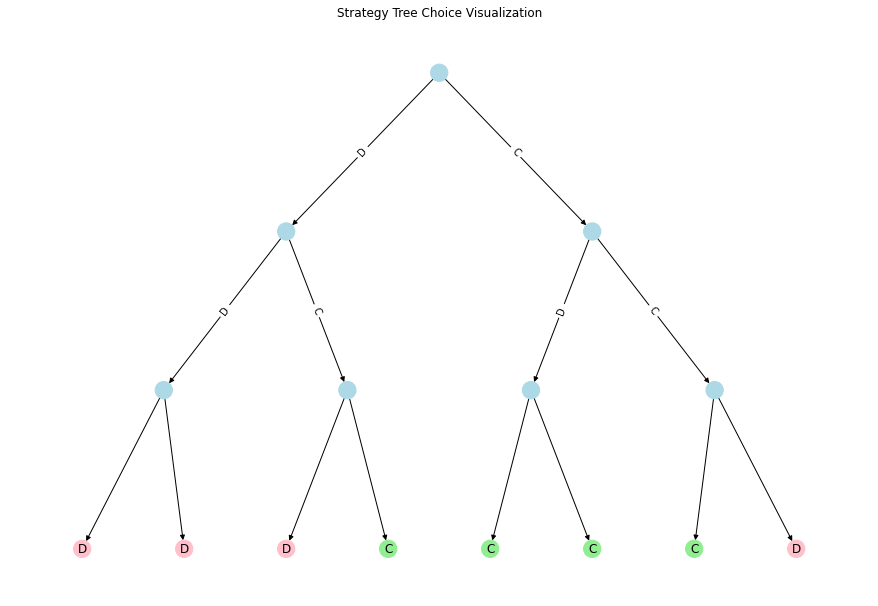

[0, 0, 0, 0, 1, 1, 0, 1, 0]


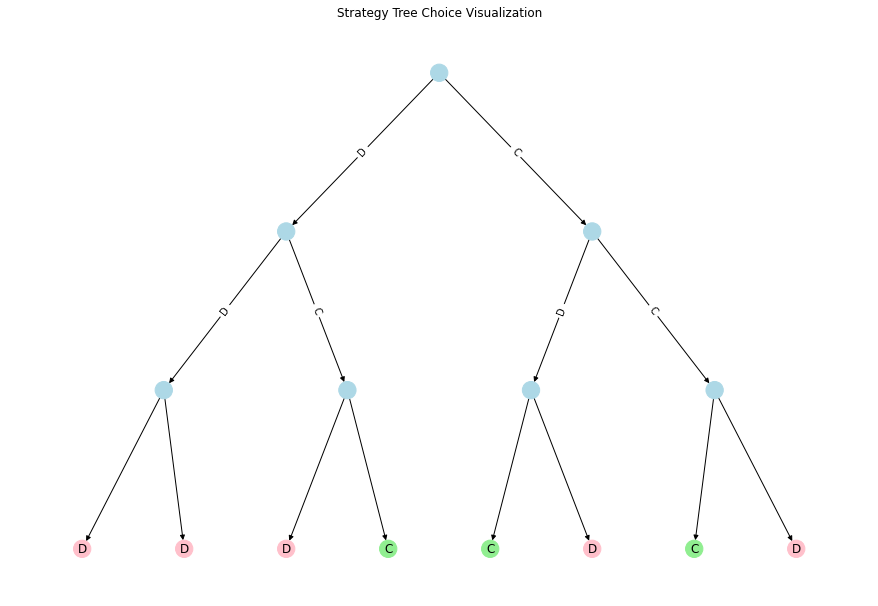

[0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0]


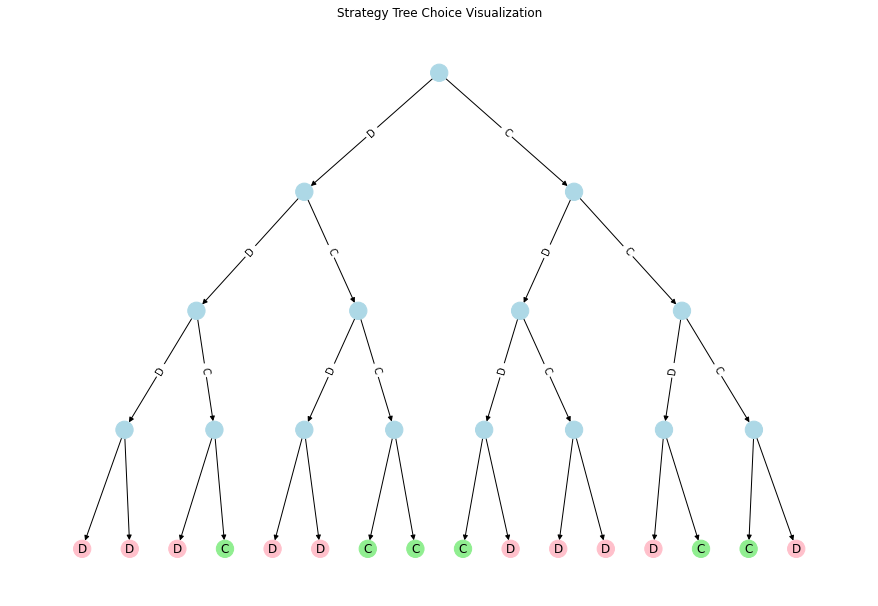

[0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0]


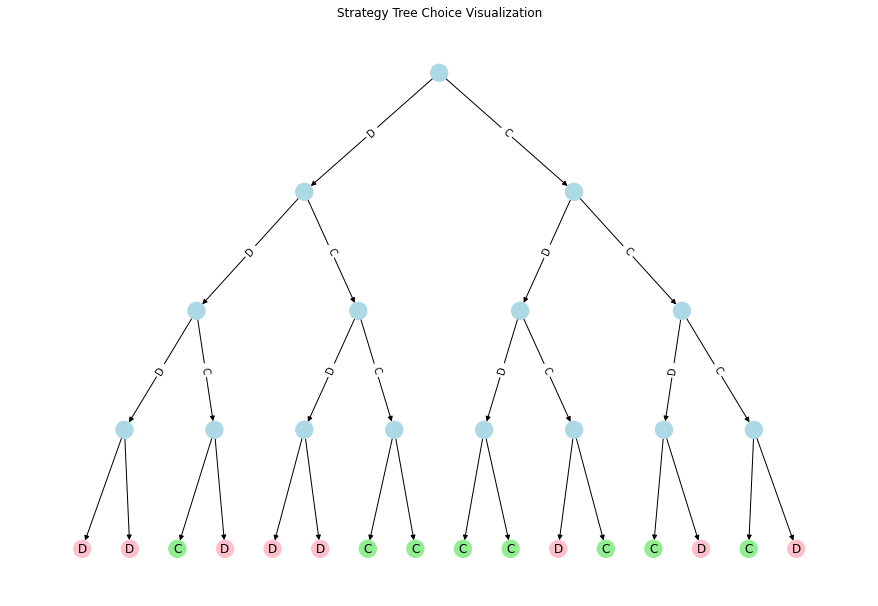

[0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0]


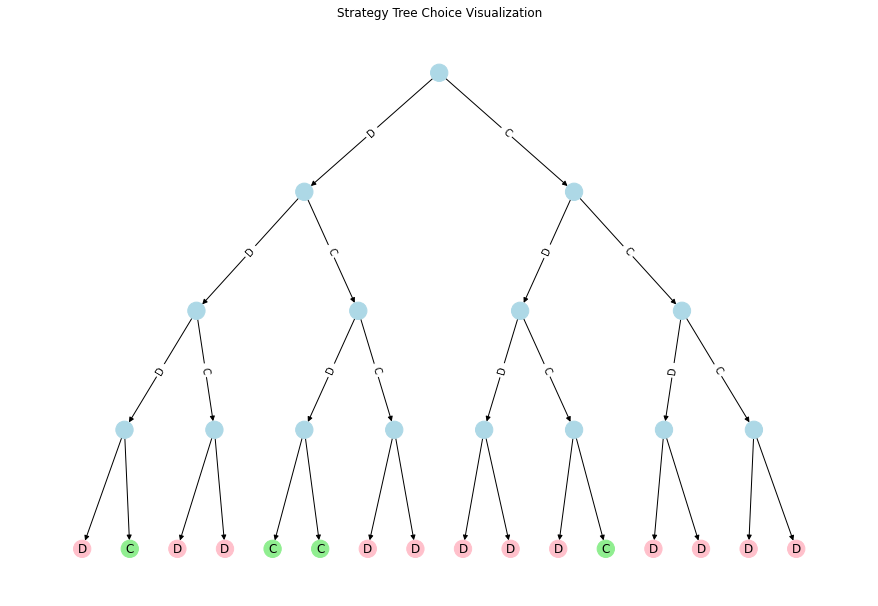

[0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0]


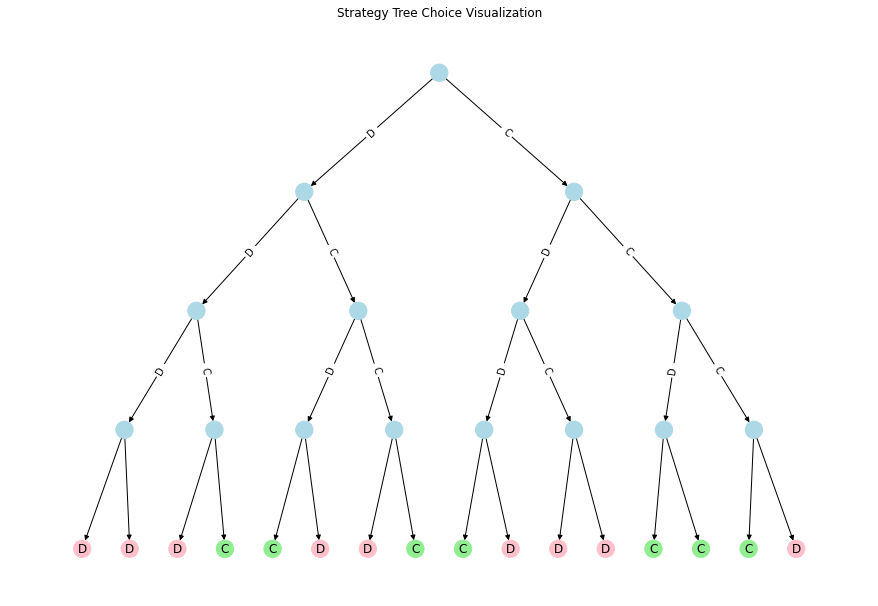

[0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0]


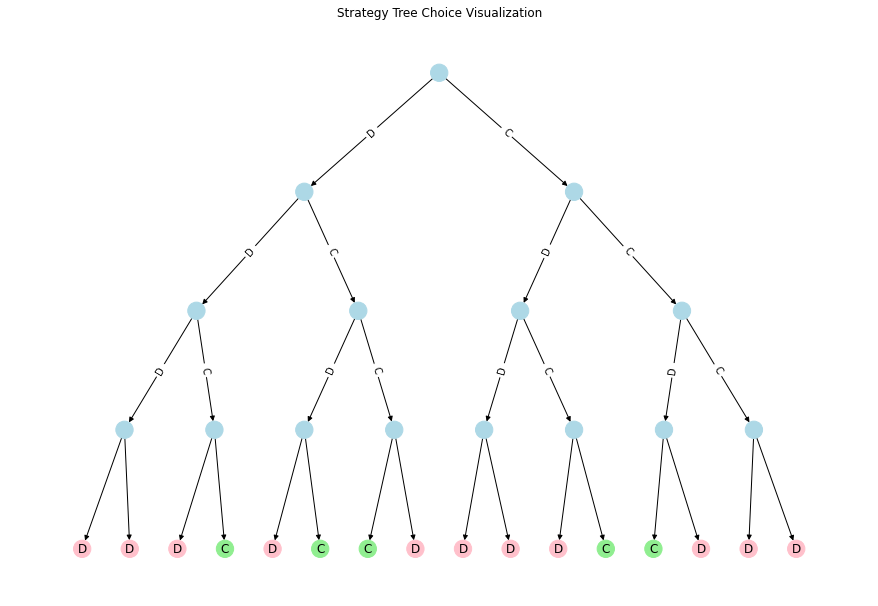

[0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0]


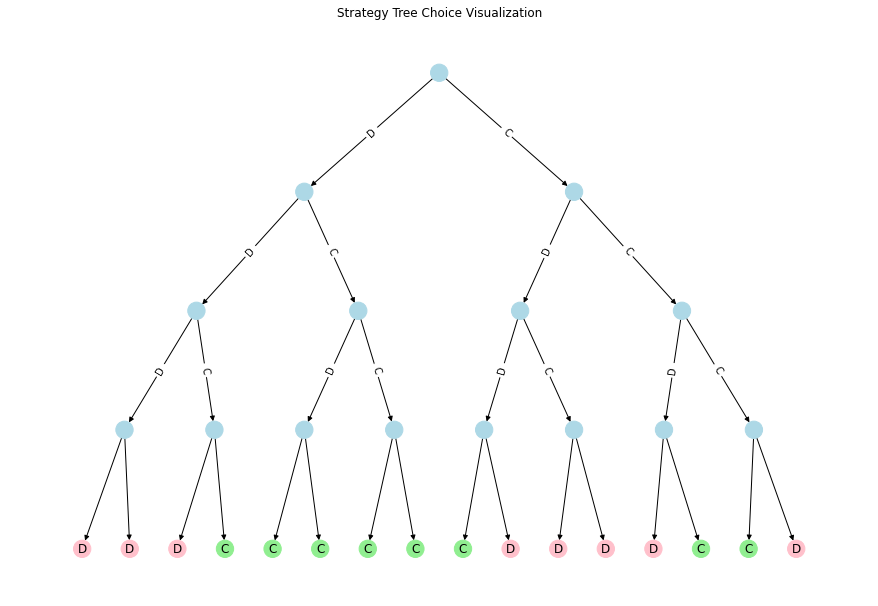

[0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0]


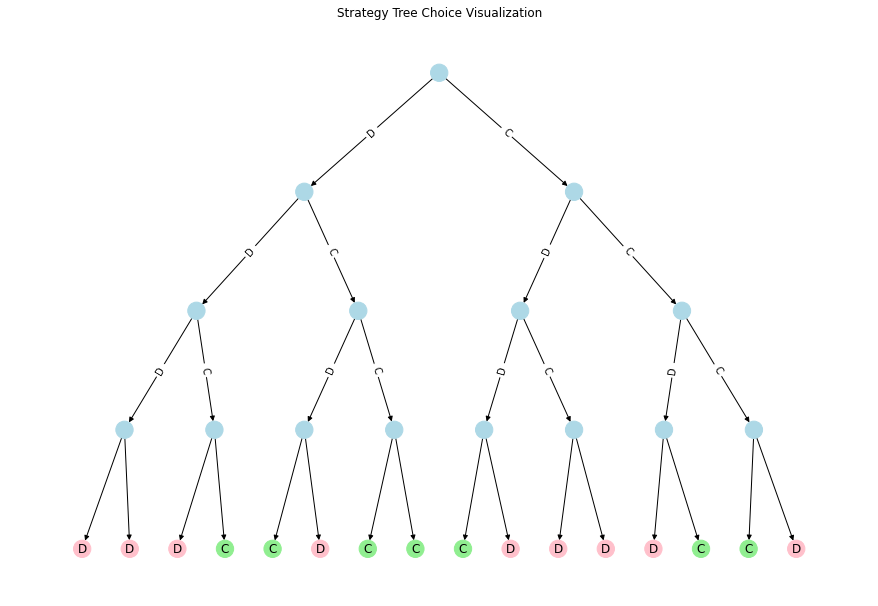

[0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0]


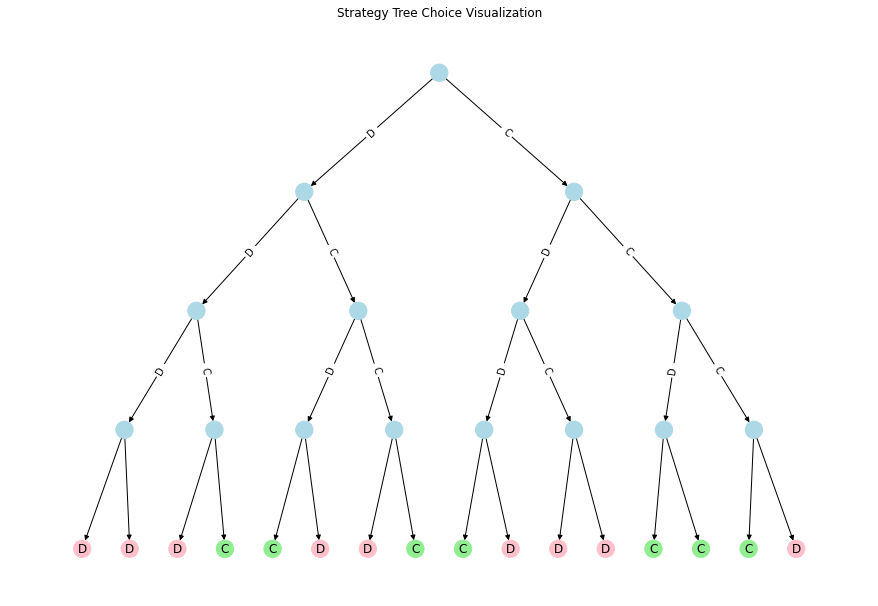

[0, 0, 0, 0, 1, 1, 0, 1, 0]


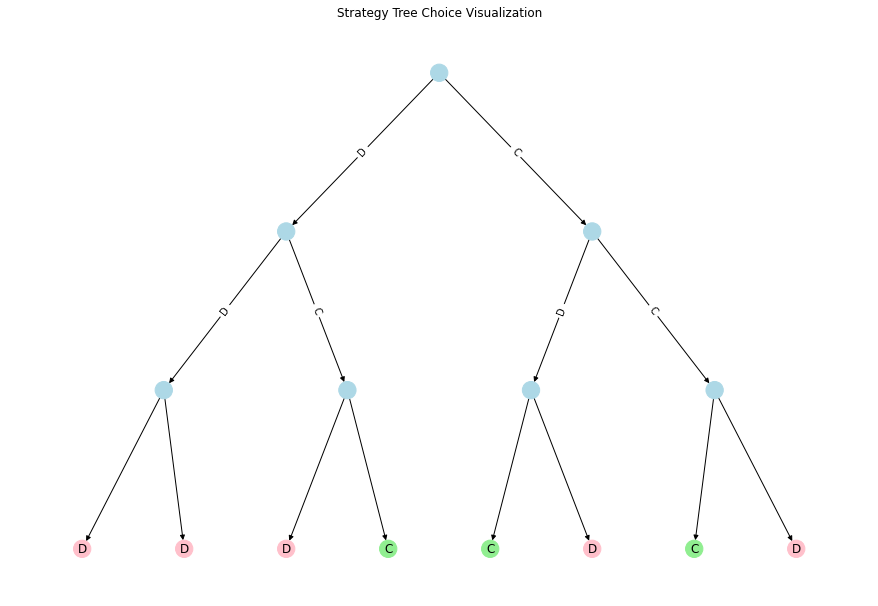

[0, 0, 0, 0, 1, 1, 0, 1, 0]


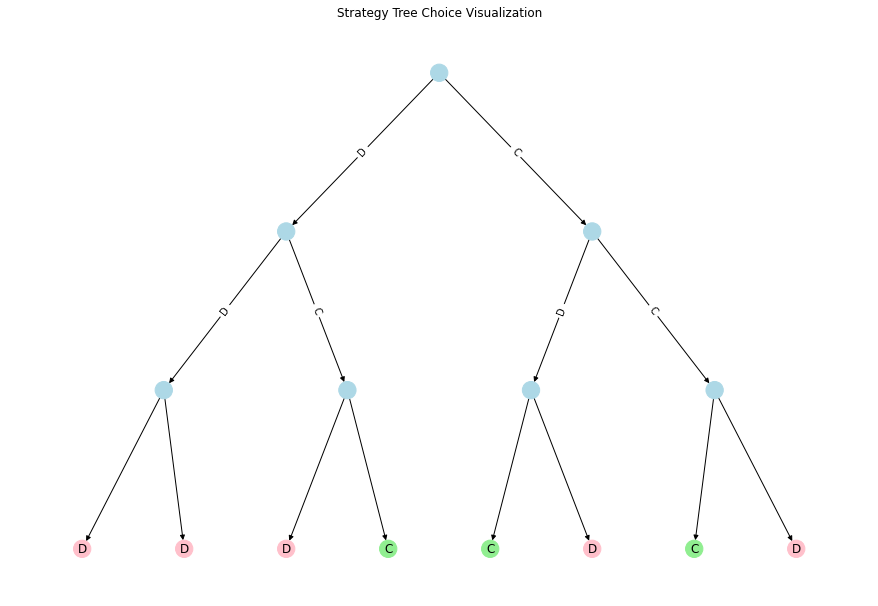

[0, 0, 0, 0, 1, 1, 0, 1, 0]


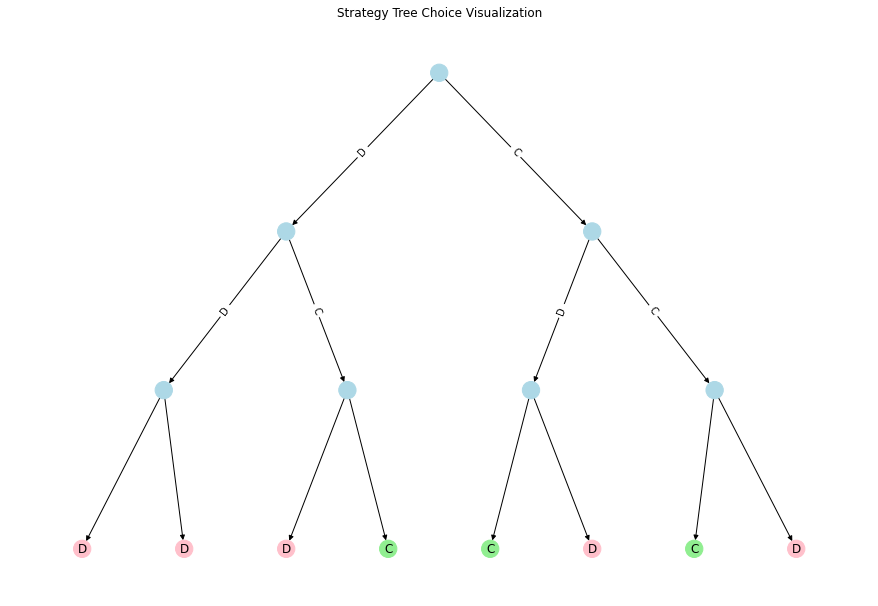

[0, 0, 0, 0, 1, 1, 0, 1, 0]


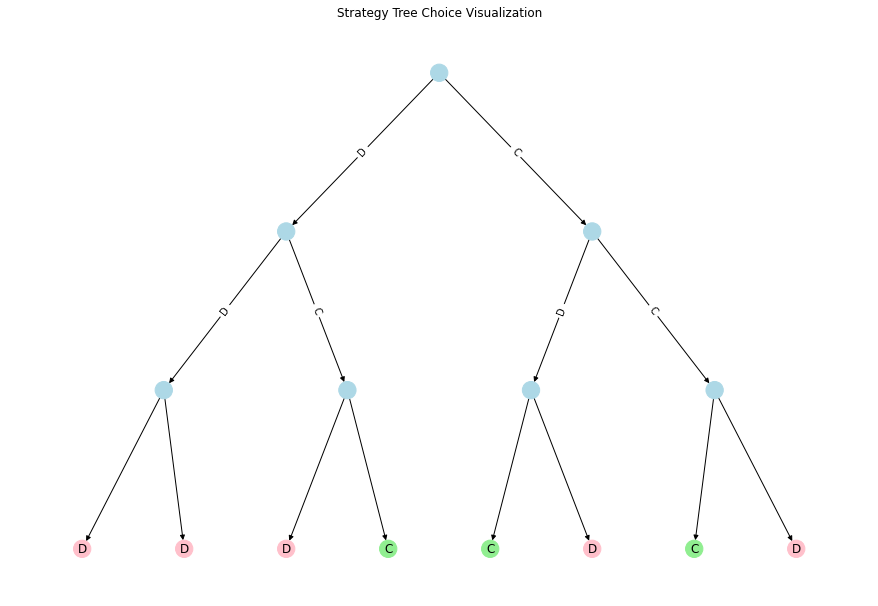

[0, 0, 0, 0, 1, 1, 0, 1, 0]


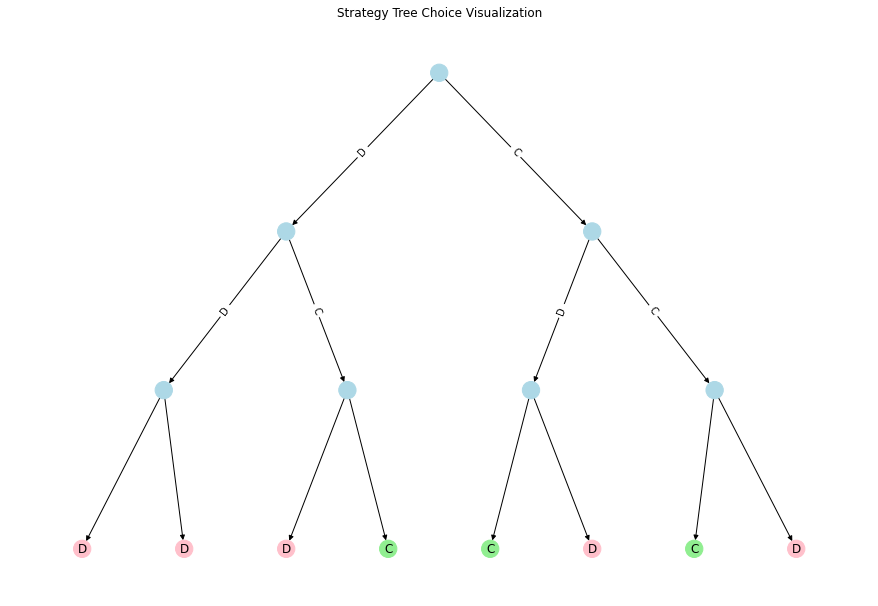

[0, 0, 0, 0, 1, 1, 0, 1, 0]


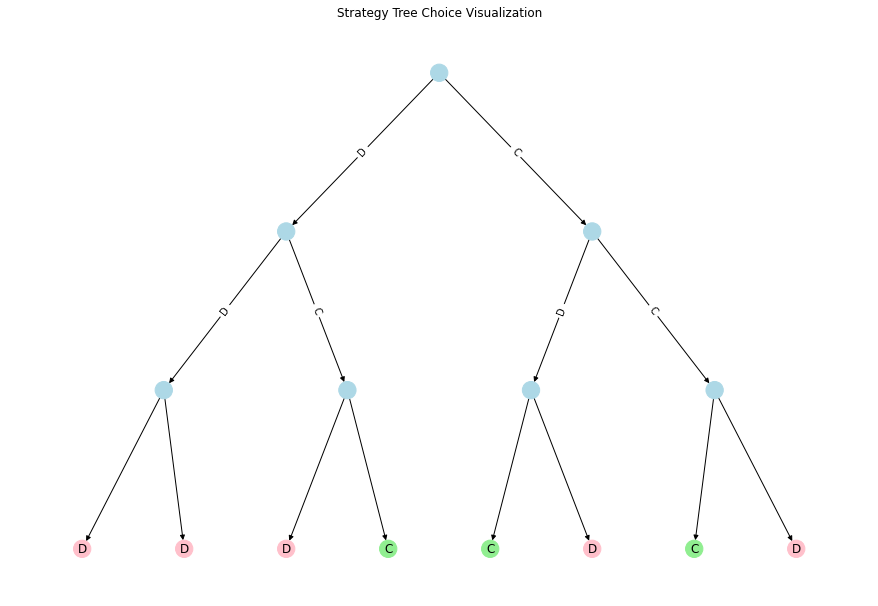

[0, 0, 0, 0, 1, 1, 0, 1, 0]


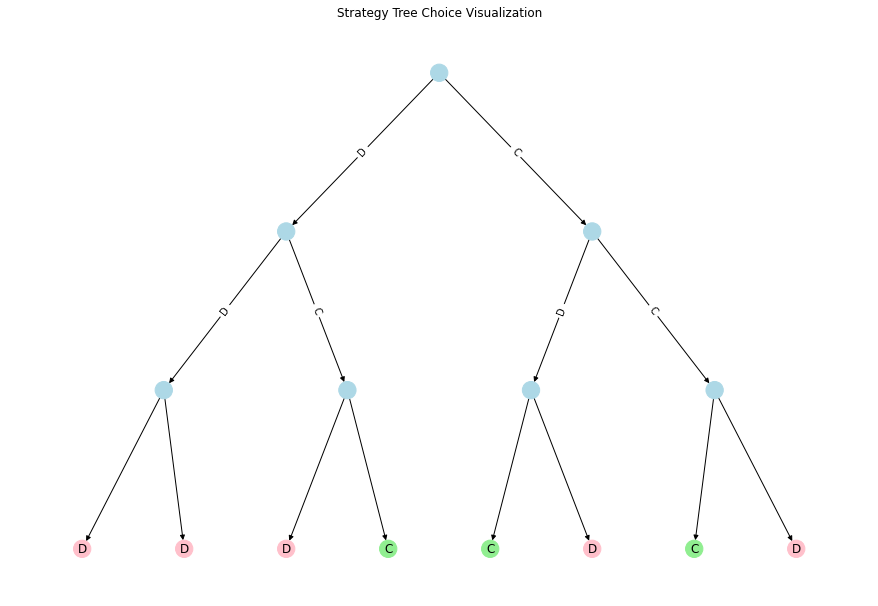

[0, 0, 0, 0, 1, 1, 0, 1, 0]


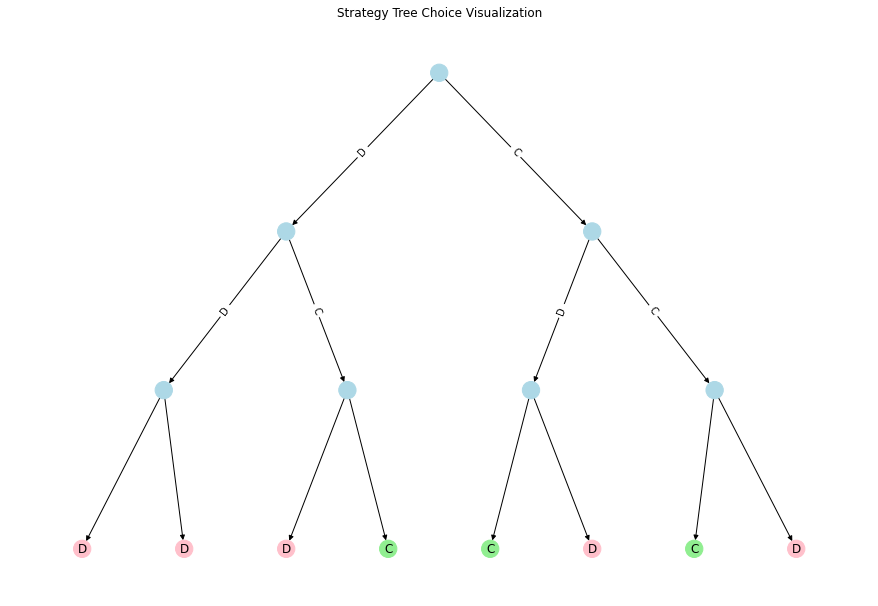

[0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0]


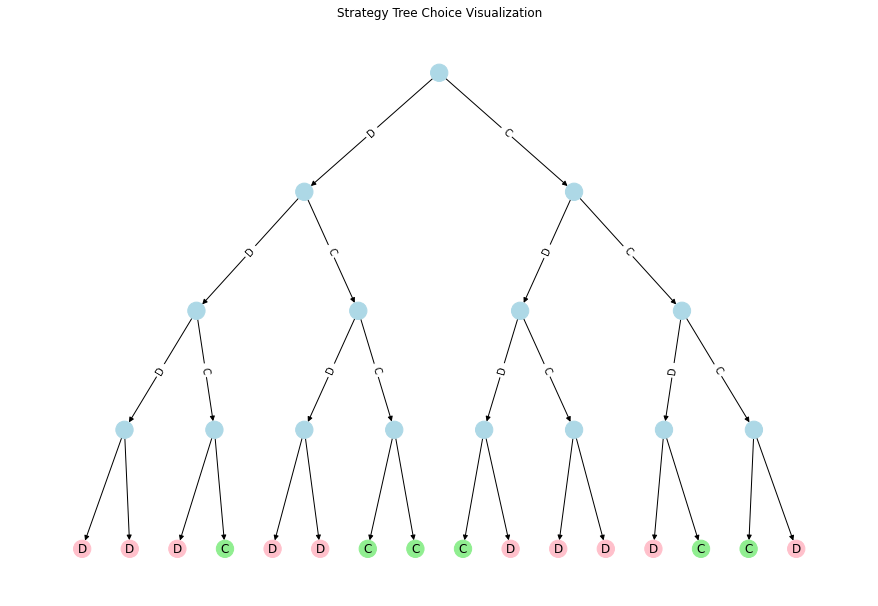

[0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0]


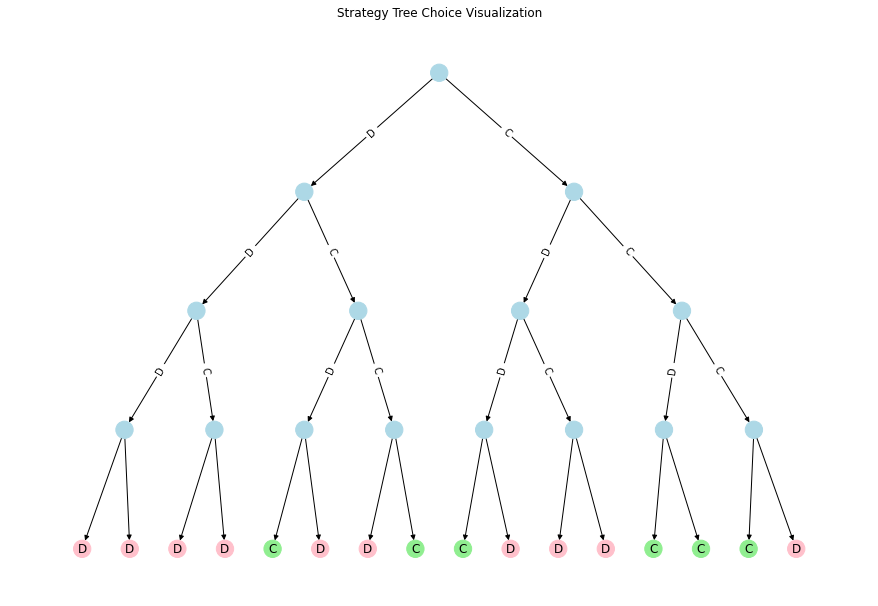

[0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0]


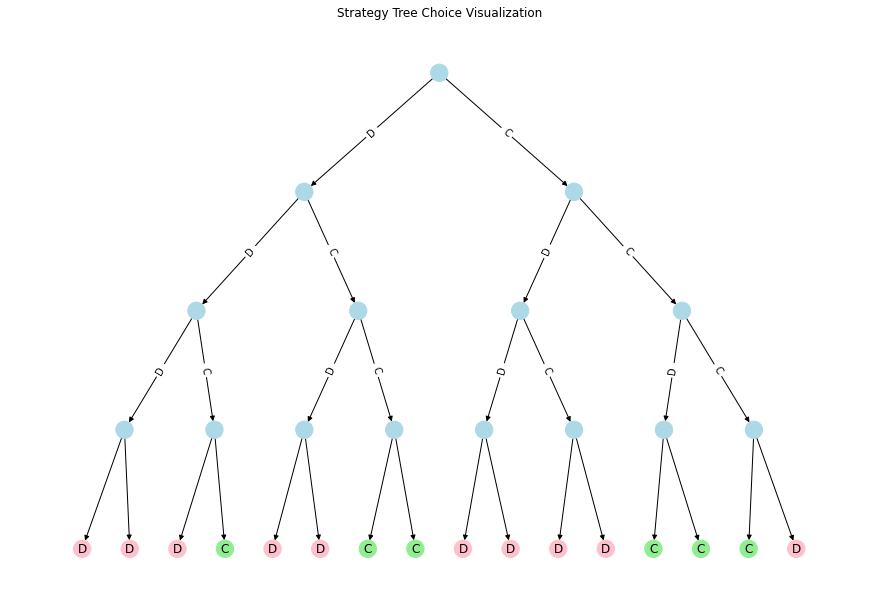

[0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0]


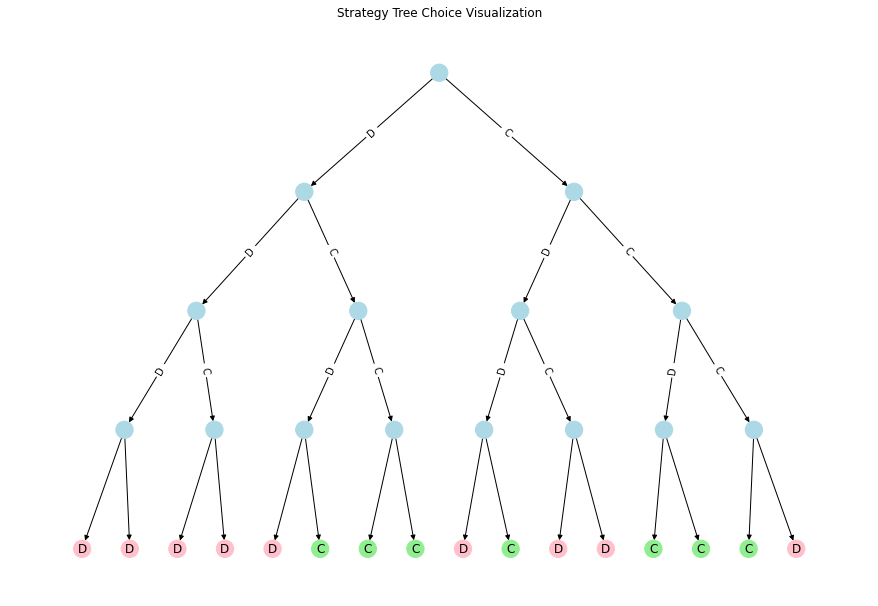

[0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0]


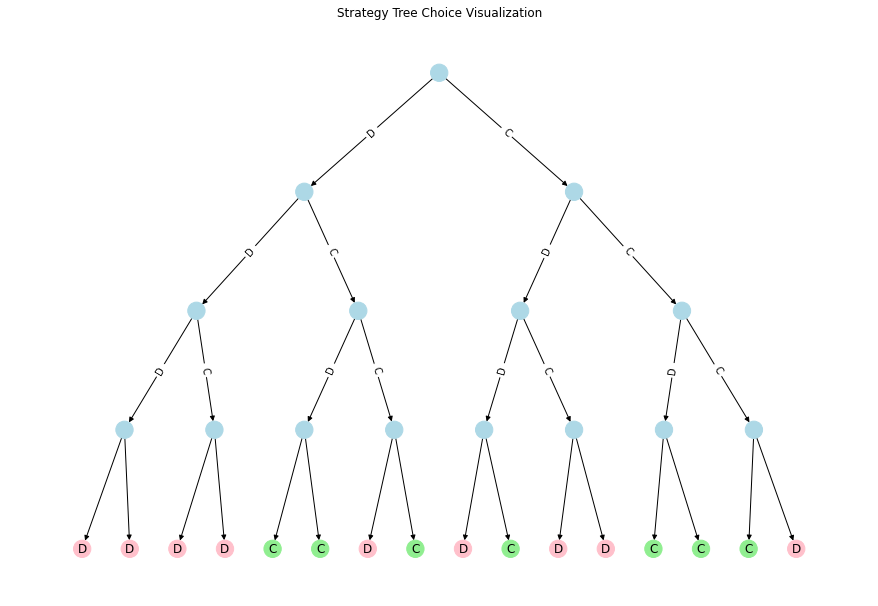

[0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0]


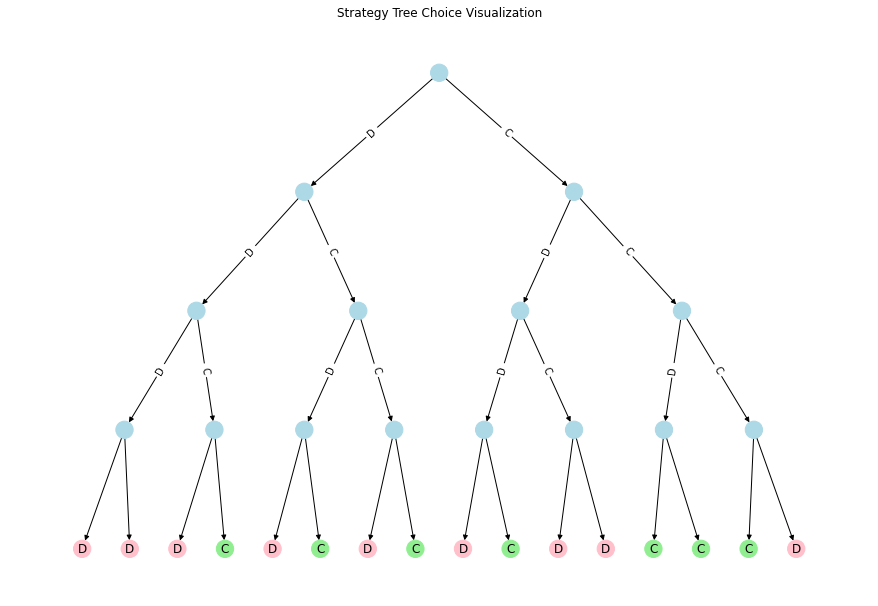

[0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0]


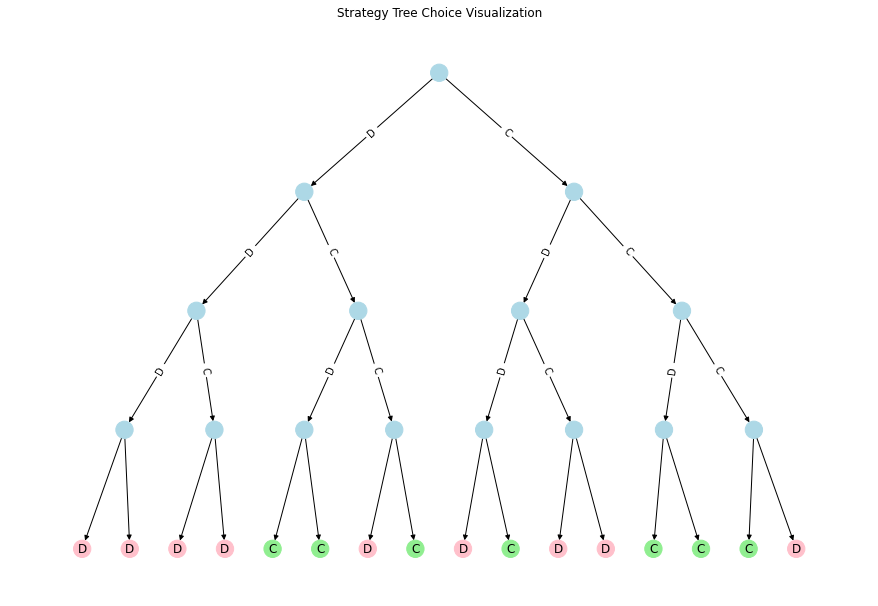

[0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0]


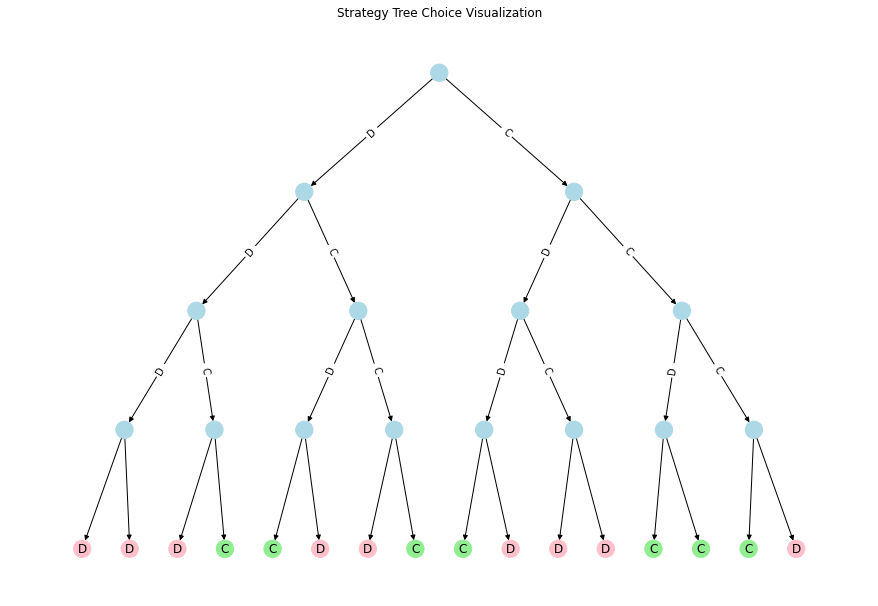

In [126]:
for best_result in results_c:
    best_strategy = best_result['strategy']
    print(best_strategy)
    binary_tree_plot(best_strategy)

In [127]:
"""
DEFECTIVE POPULATION

GRID SEARCH ALL HYPERPARAMETER COMBINATIONS 
""" 

results_d = []

for population_size in population_sizes:
    for memory_length in memory_lengths:
        for crossover_operator in crossover_operators:
            for mutation_operator in mutation_operators:
                for mutation_rate in mutation_rates:
                    
                    print("Population =", population_size, "\nMemory =", memory_length, "\nCrossover Operator =", crossover_operator, "\nMutation Operator =", mutation_operator, "\nMutation Rate =", mutation_rate)
                    
                    start_time = time.time()
                    result, best_strategy = run_genetic_algorithm(population_size, 40, memory_length, 40,
                                                                  crossover_operator, mutation_operator, mutation_rate,
                                                                 fitness_d)
                    print("Best Strategy =", best_strategy, "\nFitness =", fitness(best_strategy, 40), "\nTime Taken = ", round(time.time()-start_time), "seconds\n")
                    
                    results_d.append({
                        'strategy': best_strategy,
                        'best fitness per generation': result['gen_best_fitnesses'],
                        'mean fitness per generation': result['gen_mean_fitnesses'],
                        'population size': population_size,
                        'memory length': memory_length,
                        'crossover': crossover_operator,
                        'mutation': mutation_operator,
                        'mutation rate': mutation_rate
                    })

Population = 60 
Memory = 3 
Crossover Operator = ordered 
Mutation Operator = reverse_sequence 
Mutation Rate = 0.1
Best Strategy = [0, 0, 1, 1, 1, 0, 0, 1, 0] 
Fitness = 2.875 
Time Taken =  5 seconds

Population = 60 
Memory = 3 
Crossover Operator = ordered 
Mutation Operator = reverse_sequence 
Mutation Rate = 0.25
Best Strategy = [0, 0, 0, 0, 1, 1, 0, 1, 0] 
Fitness = 2.875 
Time Taken =  2 seconds

Population = 60 
Memory = 3 
Crossover Operator = ordered 
Mutation Operator = inverse 
Mutation Rate = 0.1
Best Strategy = [0, 0, 1, 1, 1, 0, 0, 1, 0] 
Fitness = 2.875 
Time Taken =  2 seconds

Population = 60 
Memory = 3 
Crossover Operator = ordered 
Mutation Operator = inverse 
Mutation Rate = 0.25
Best Strategy = [0, 0, 0, 0, 1, 1, 0, 1, 0] 
Fitness = 2.875 
Time Taken =  2 seconds

Population = 60 
Memory = 3 
Crossover Operator = split 
Mutation Operator = reverse_sequence 
Mutation Rate = 0.1
Best Strategy = [0, 0, 0, 0, 1, 1, 0, 1, 0] 
Fitness = 2.875 
Time Taken =  2 seconds

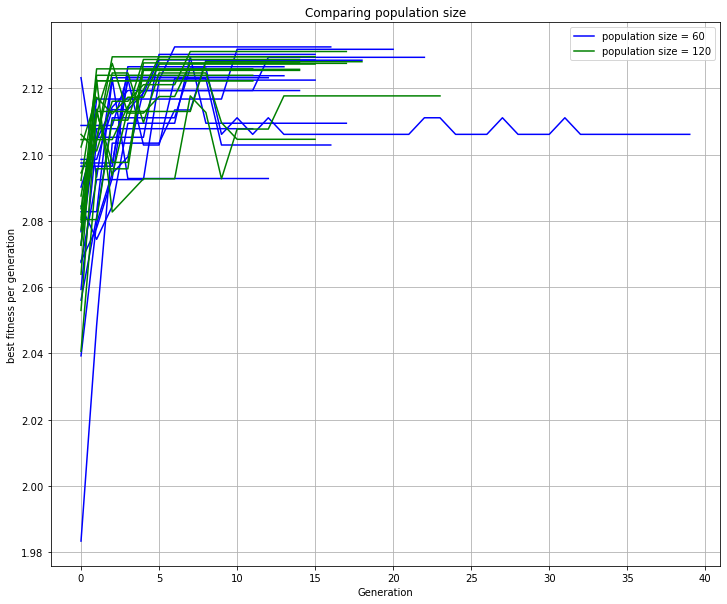

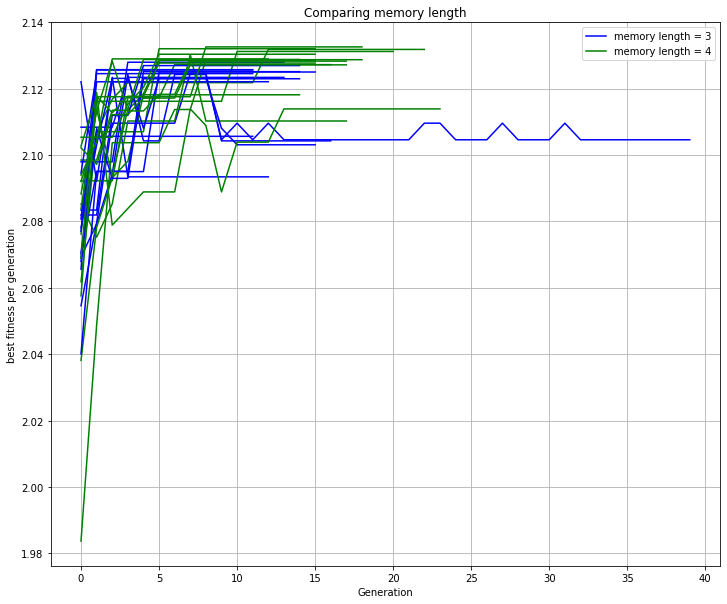

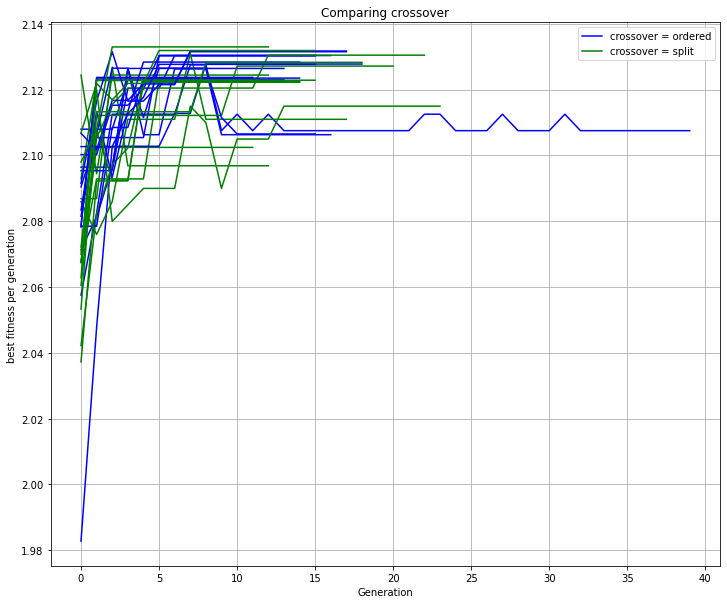

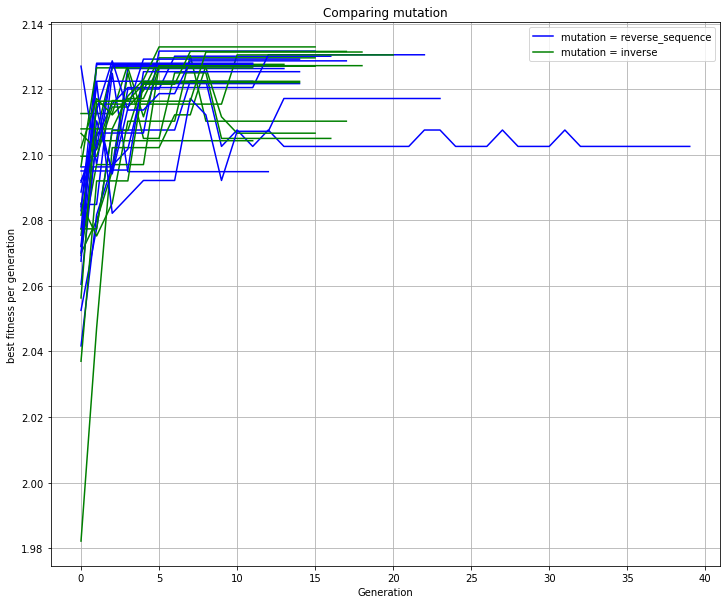

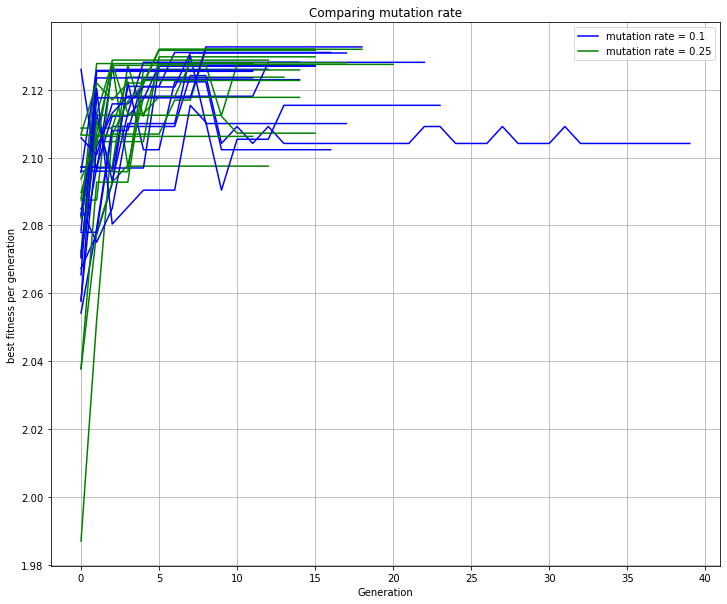

In [128]:
"""
Plotting best population fitness over generations for defective population
""" 

plot(results_d, 'population size', 'best fitness per generation', 0.003)
plot(results_d, 'memory length', 'best fitness per generation', 0.003)
plot(results_d, 'crossover', 'best fitness per generation', 0.003)
plot(results_d, 'mutation', 'best fitness per generation', 0.003)
plot(results_d, 'mutation rate', 'best fitness per generation', 0.003)

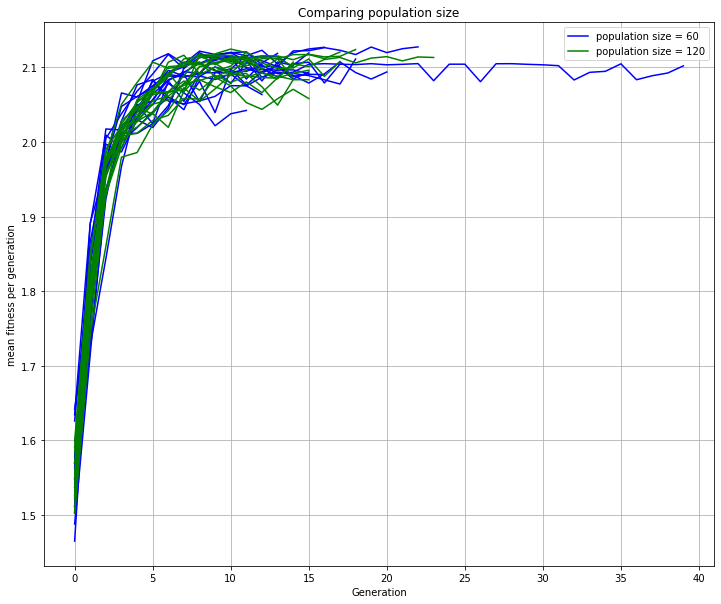

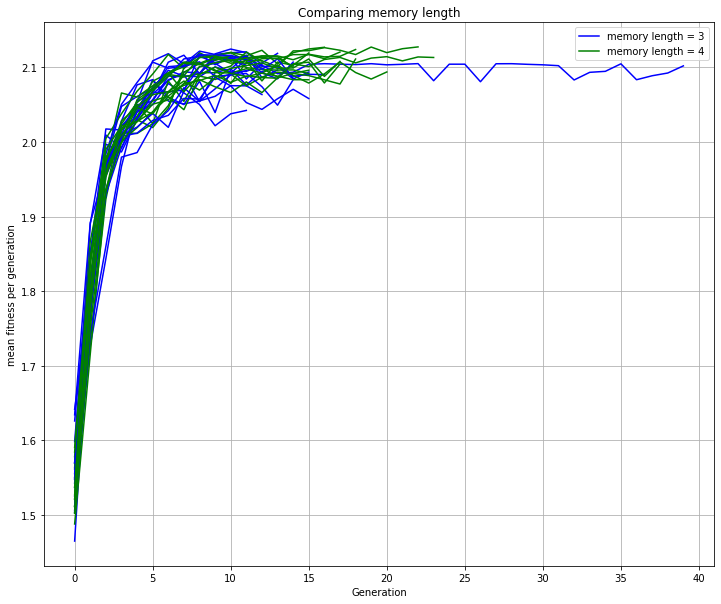

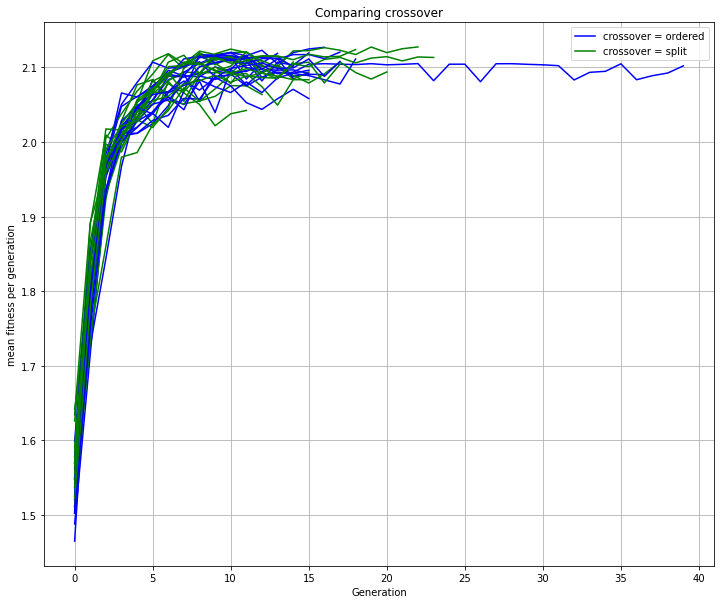

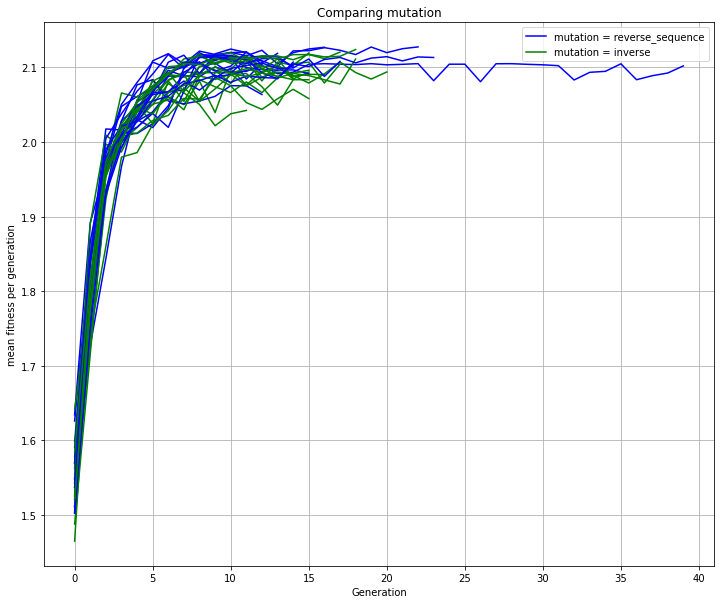

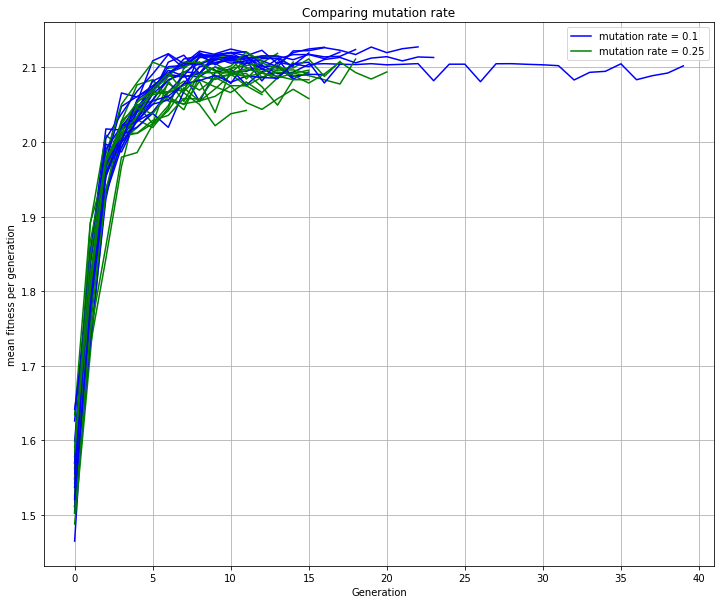

In [129]:
"""
Plotting mean population fitness over generations for defective population
""" 

plot(results_d, 'population size', 'mean fitness per generation', 0)
plot(results_d, 'memory length', 'mean fitness per generation', 0)
plot(results_d, 'crossover', 'mean fitness per generation', 0)
plot(results_d, 'mutation', 'mean fitness per generation', 0)
plot(results_d, 'mutation rate', 'mean fitness per generation', 0)

[0, 0, 1, 1, 1, 0, 0, 1, 0]


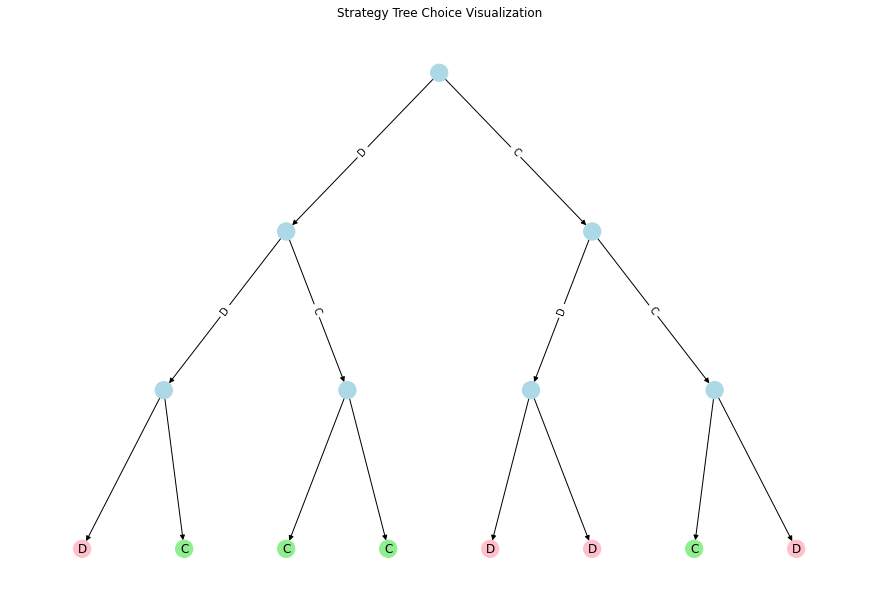

[0, 0, 0, 0, 1, 1, 0, 1, 0]


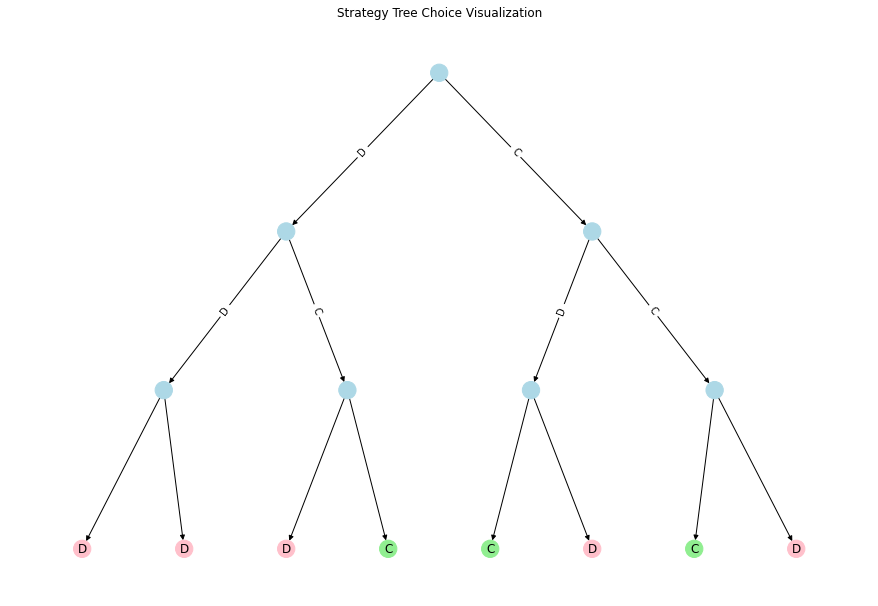

[0, 0, 1, 1, 1, 0, 0, 1, 0]


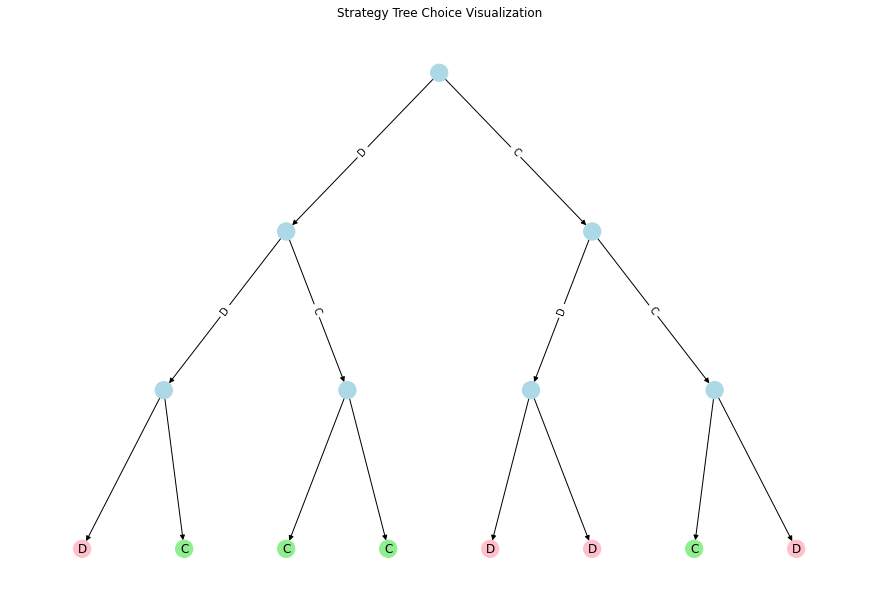

[0, 0, 0, 0, 1, 1, 0, 1, 0]


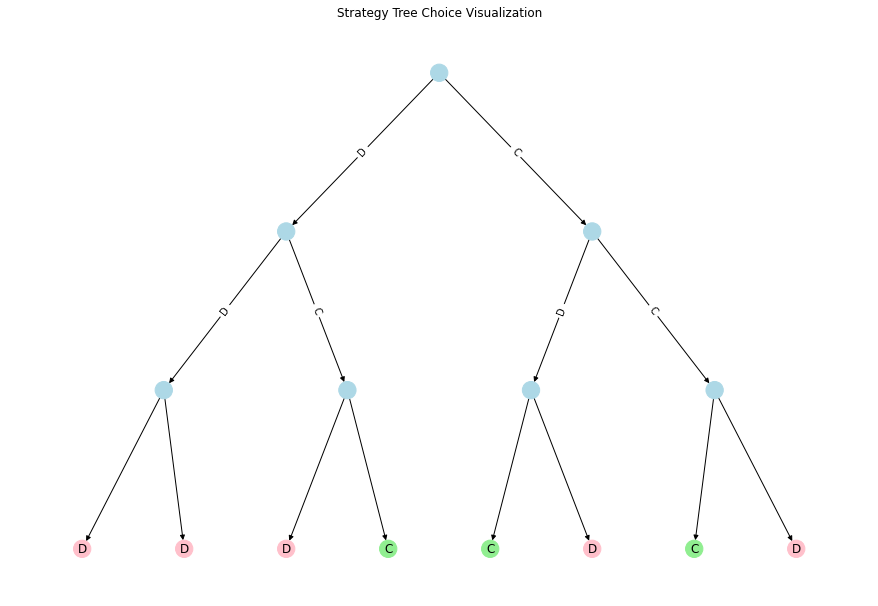

[0, 0, 0, 0, 1, 1, 0, 1, 0]


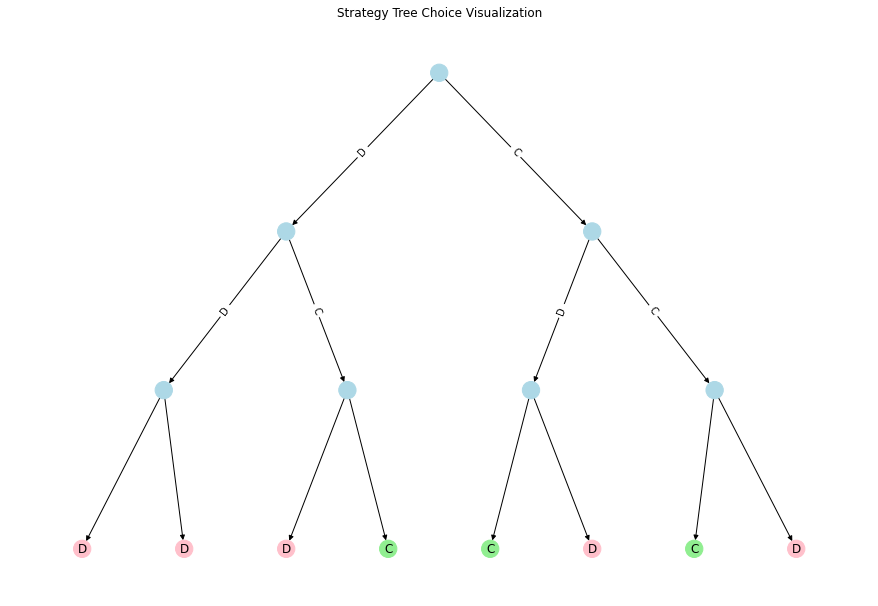

[0, 0, 0, 0, 1, 1, 1, 1, 0]


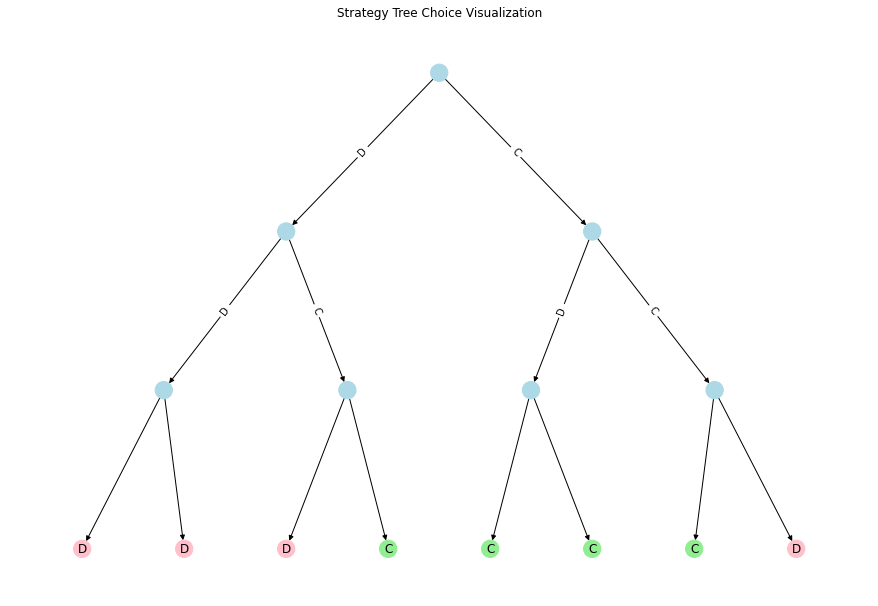

[0, 0, 0, 0, 1, 1, 0, 1, 0]


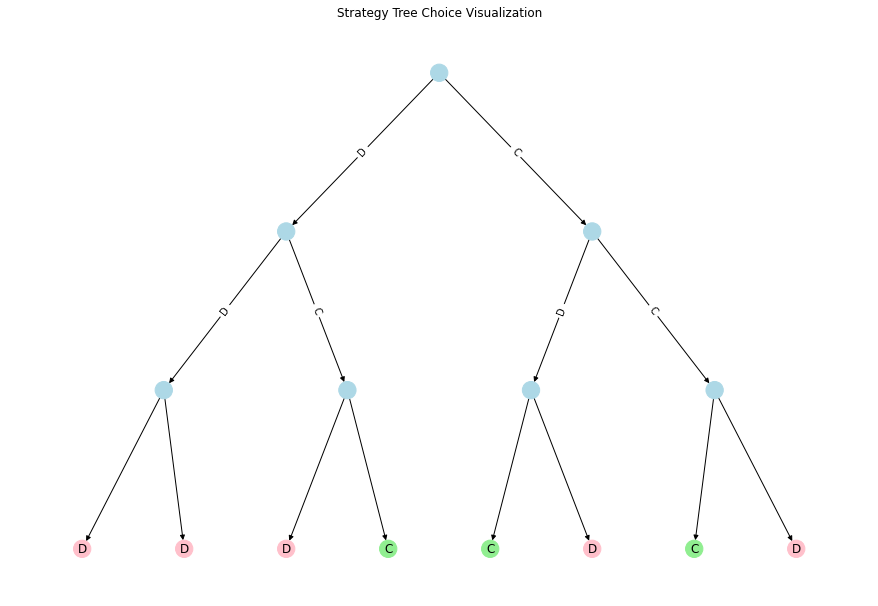

[0, 0, 1, 1, 1, 0, 0, 1, 0]


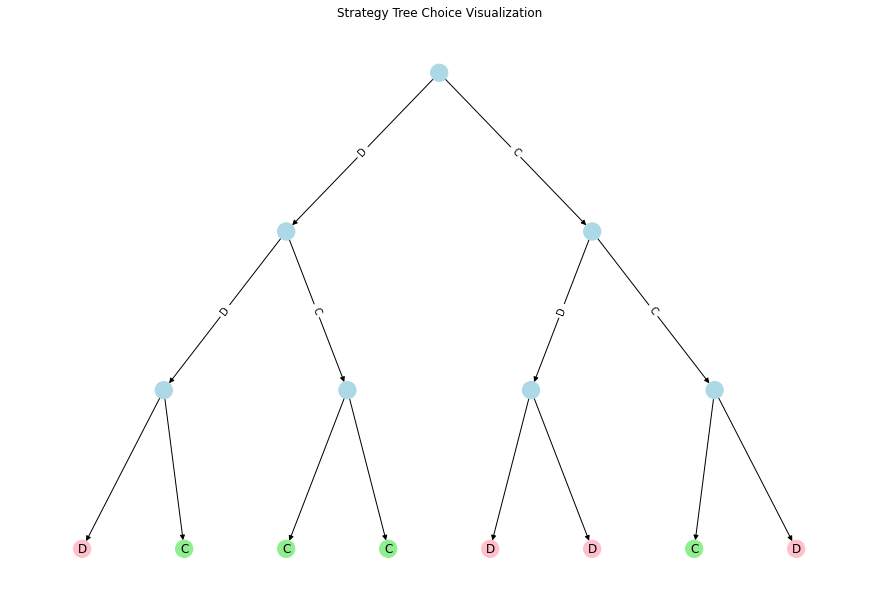

[0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0]


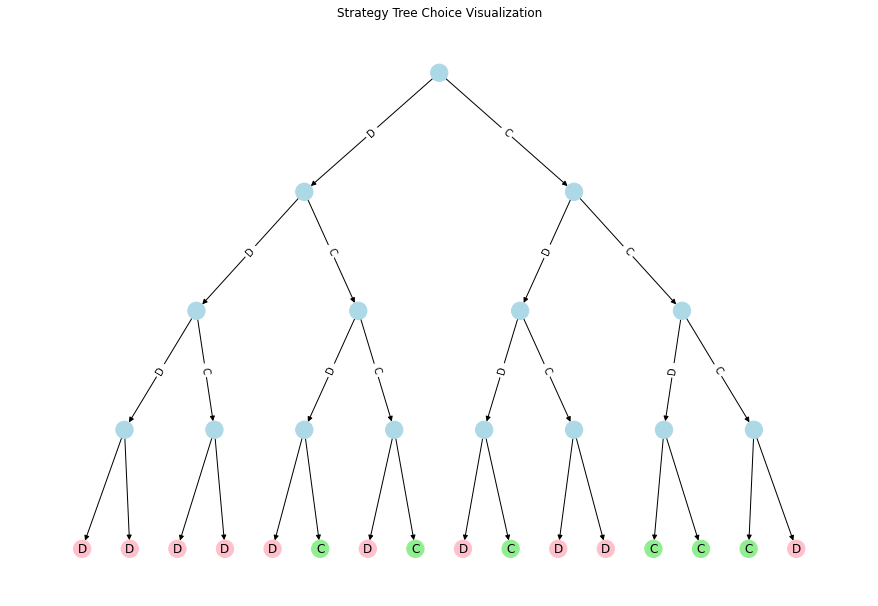

[0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0]


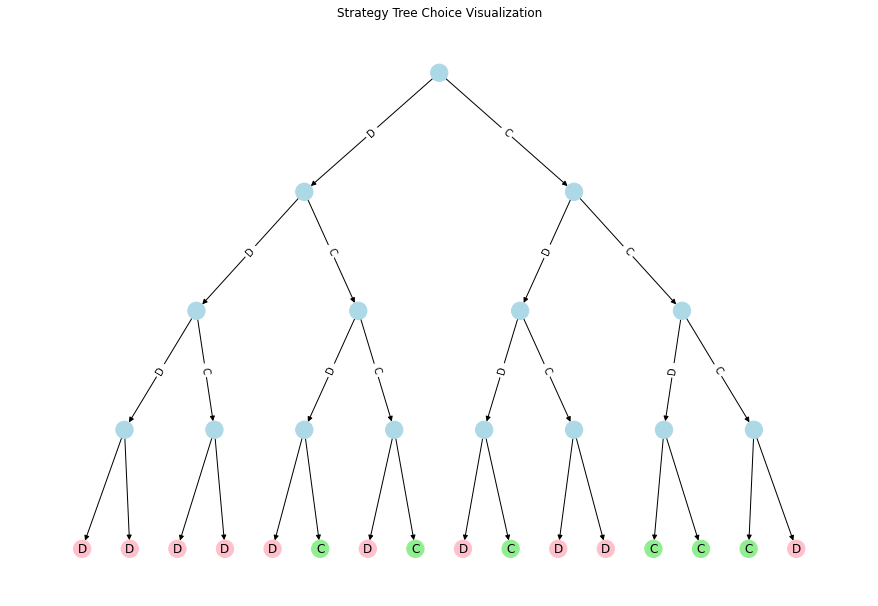

[0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]


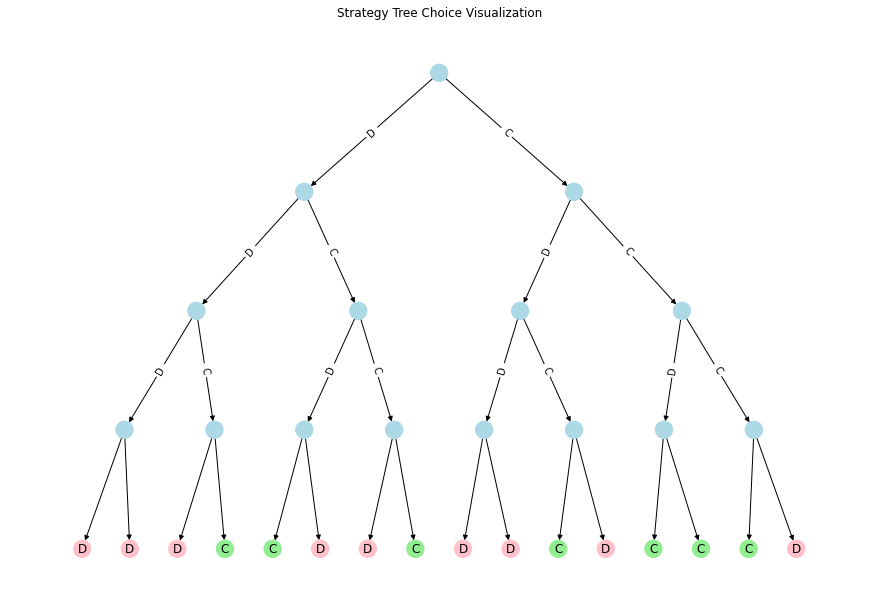

[0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0]


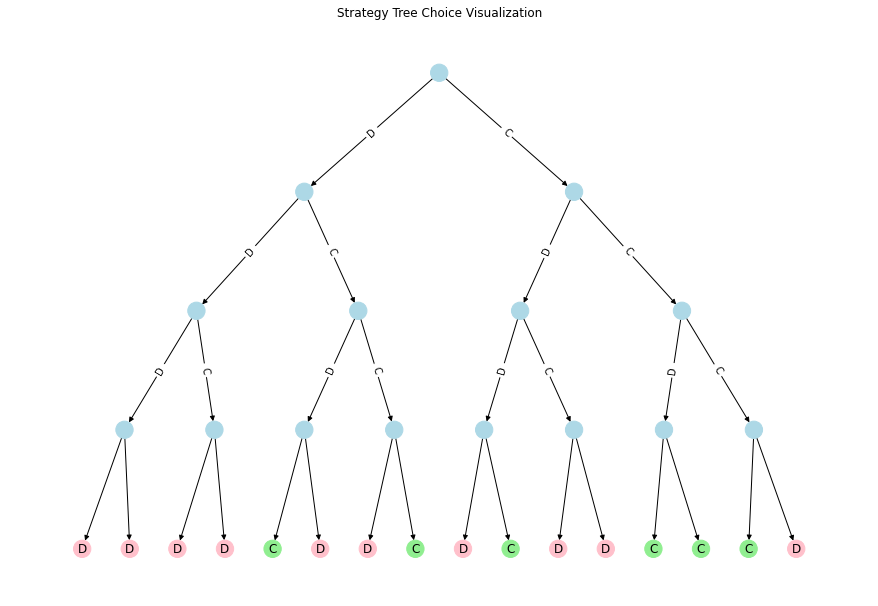

[0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0]


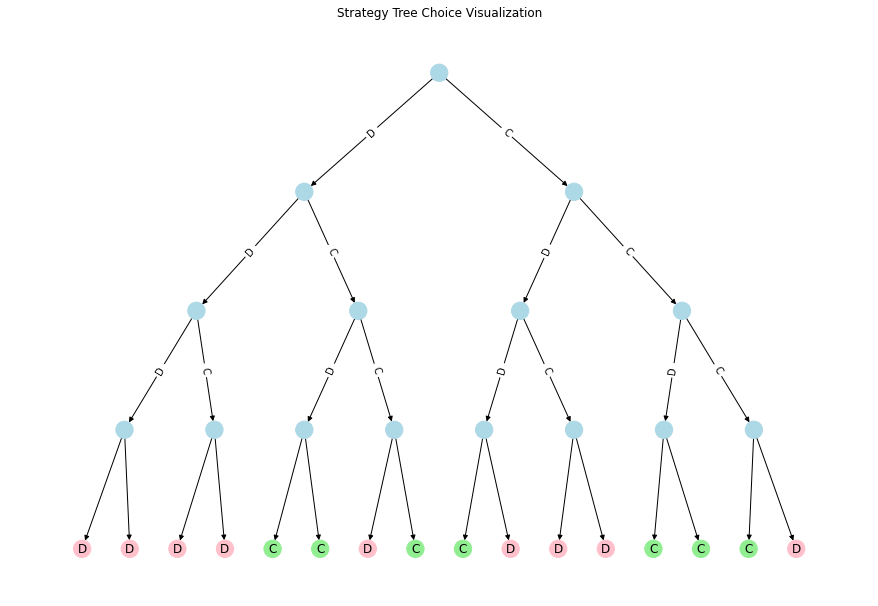

[0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0]


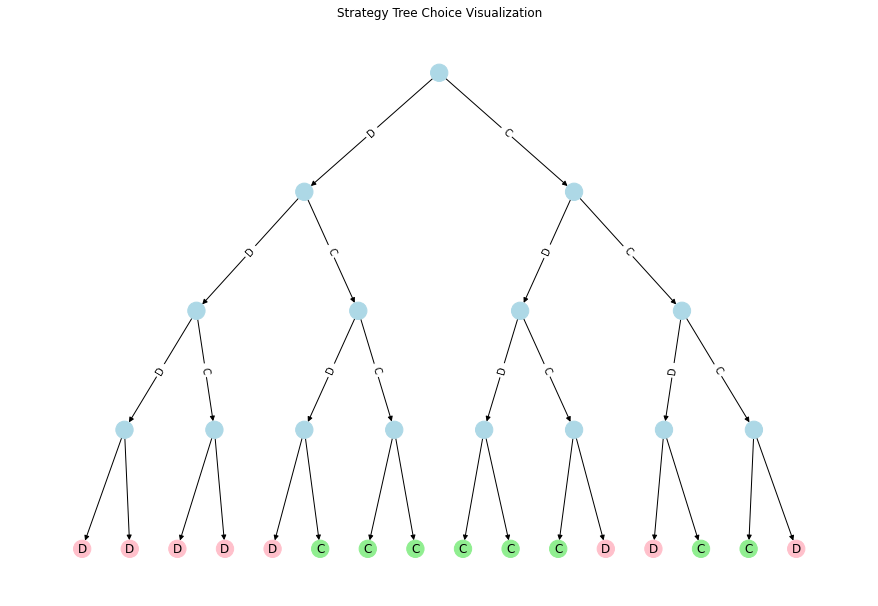

[0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0]


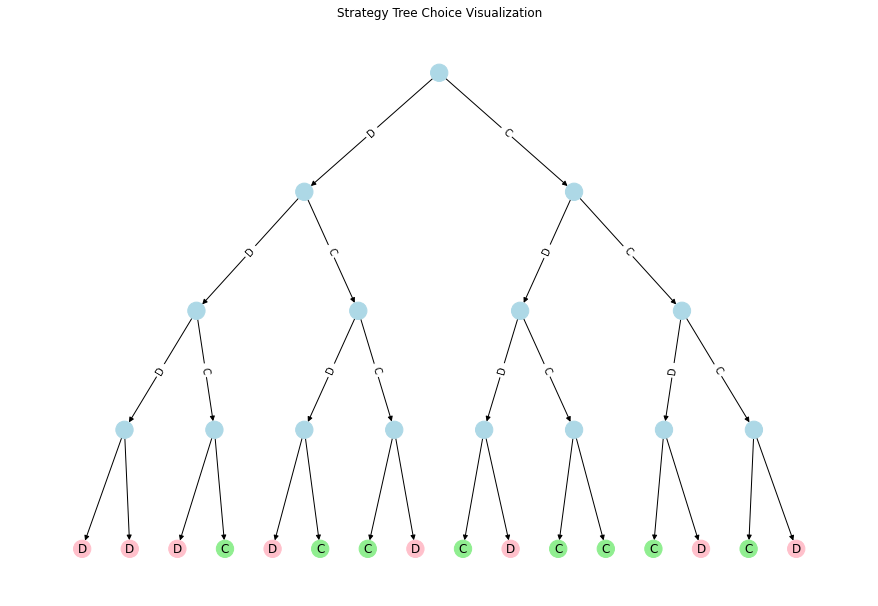

[0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0]


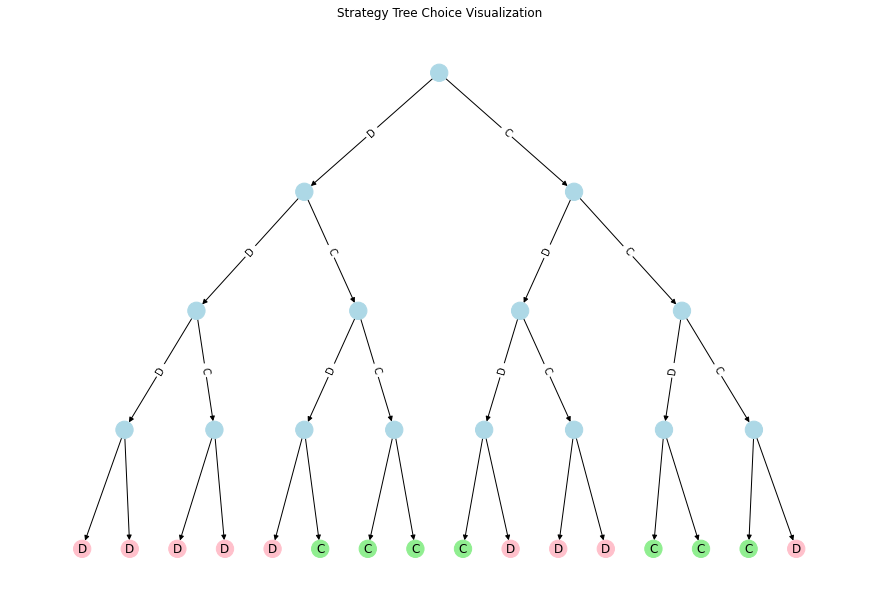

[0, 0, 0, 0, 1, 1, 0, 1, 0]


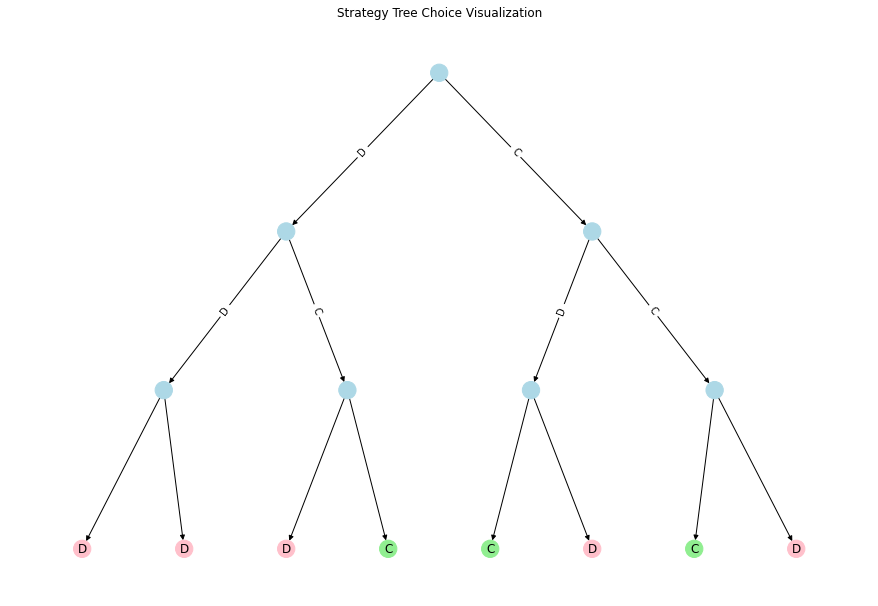

[0, 0, 0, 0, 1, 1, 0, 1, 0]


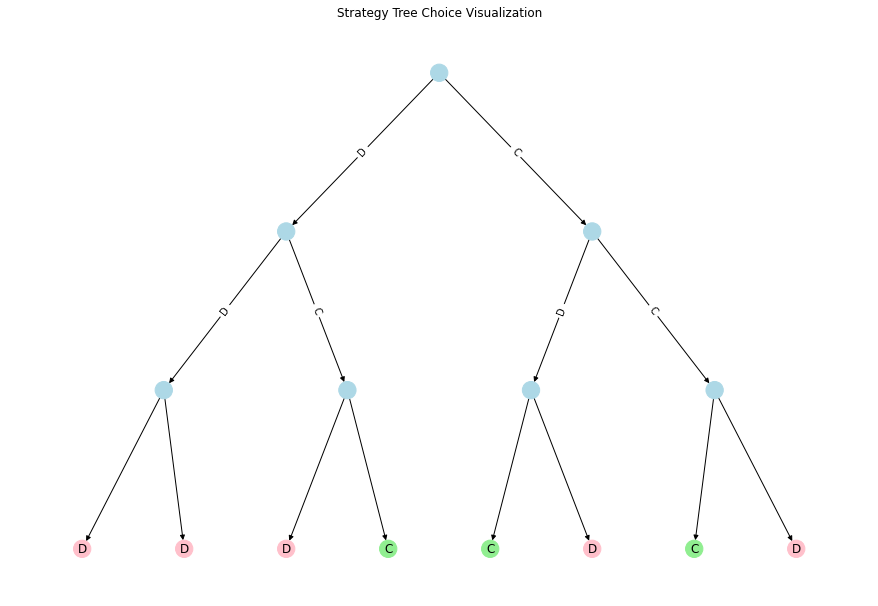

[0, 0, 0, 0, 1, 1, 0, 1, 0]


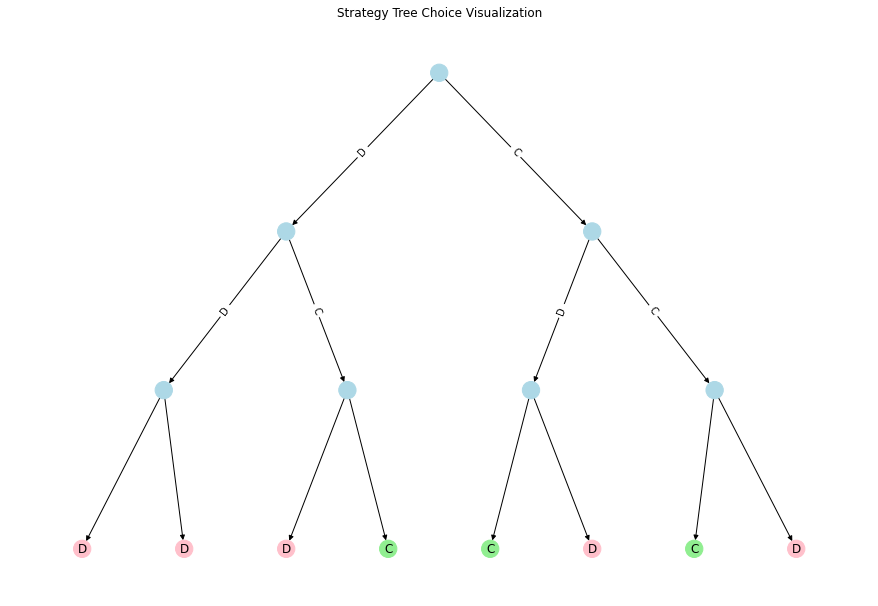

[0, 0, 1, 1, 1, 0, 0, 1, 0]


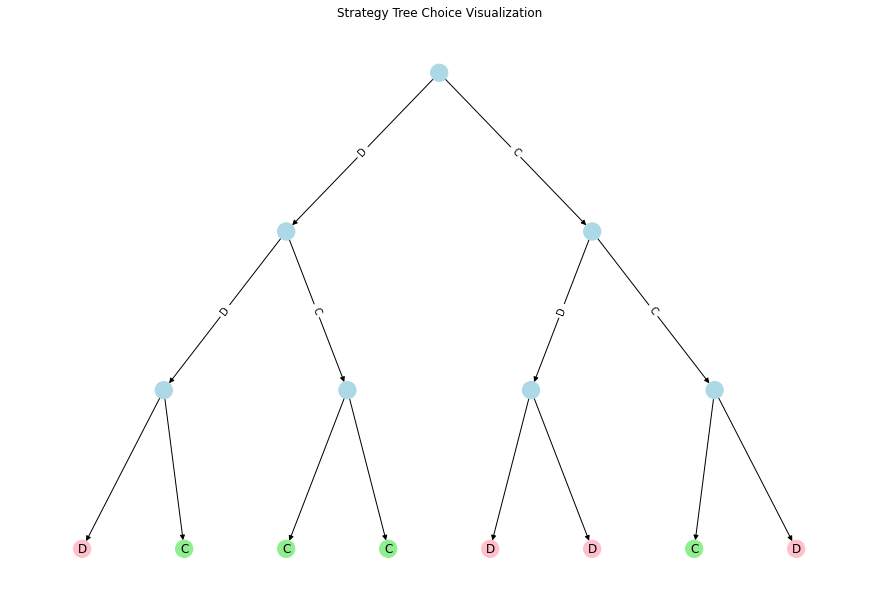

[0, 0, 0, 0, 1, 1, 0, 1, 0]


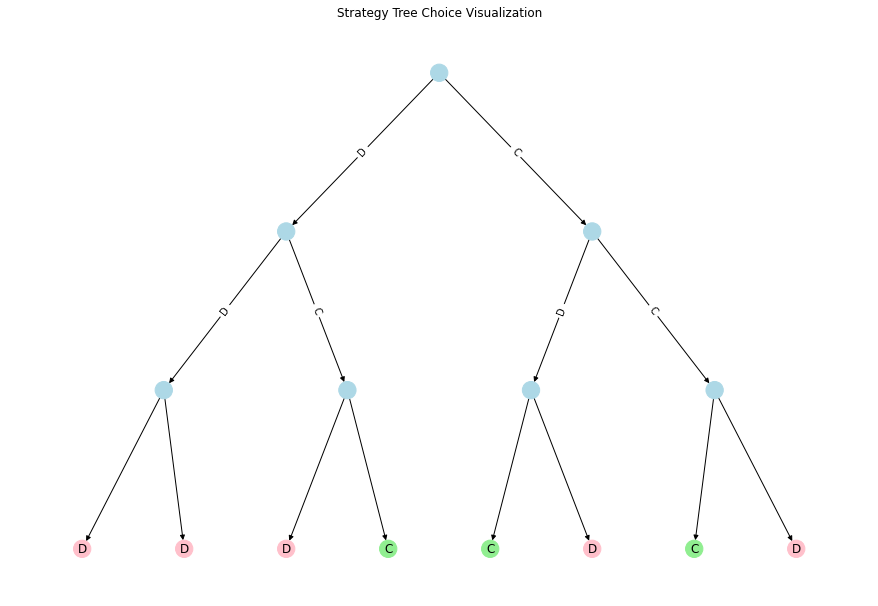

[0, 0, 0, 0, 1, 1, 0, 1, 0]


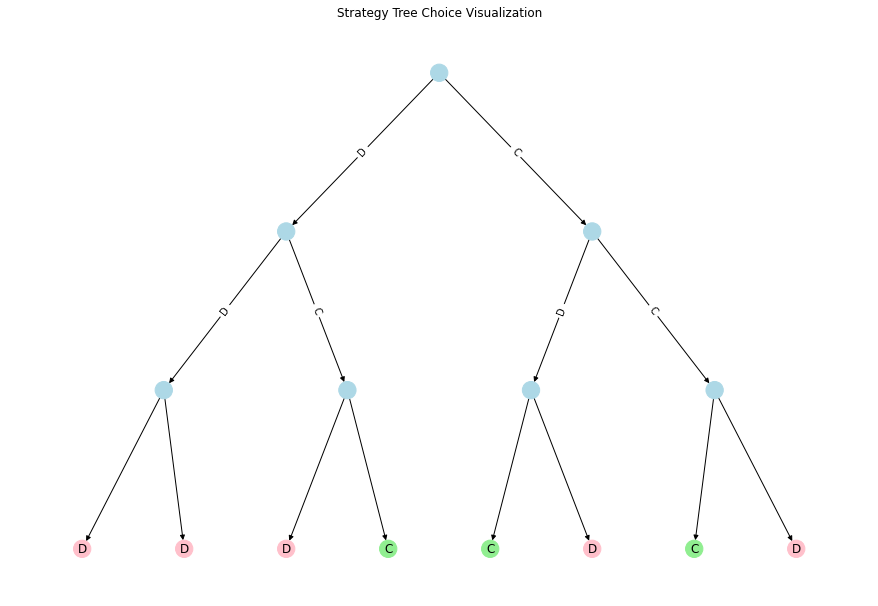

[0, 0, 0, 0, 1, 1, 0, 1, 0]


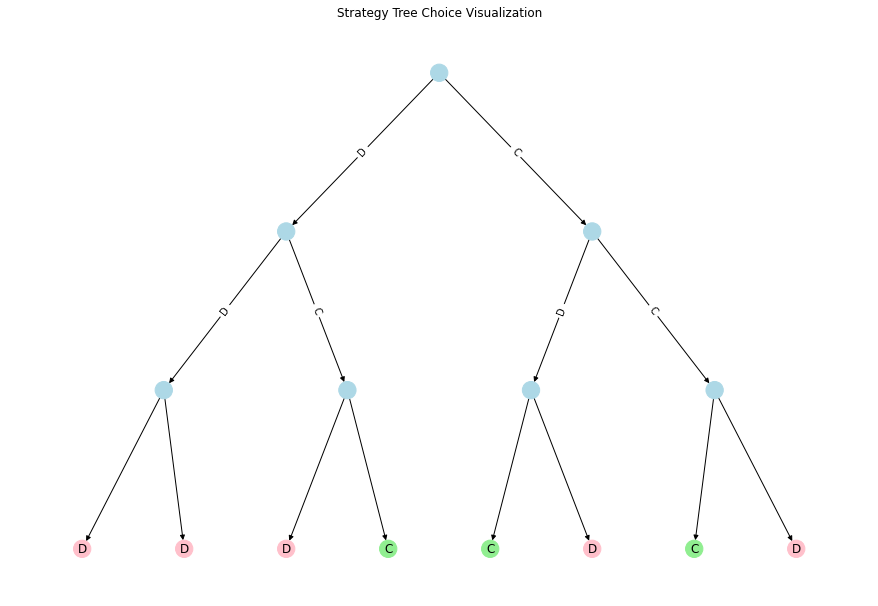

[0, 0, 0, 0, 1, 1, 0, 1, 0]


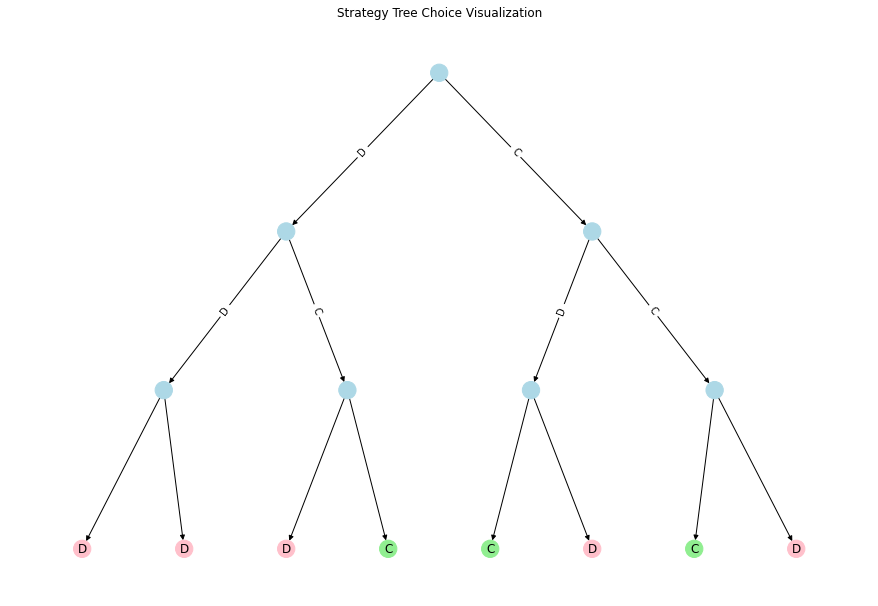

[0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0]


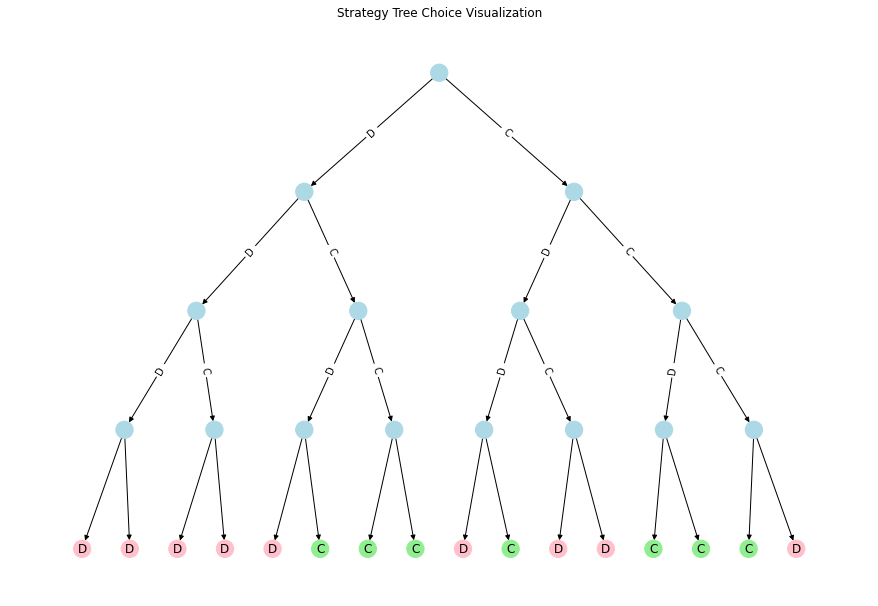

[0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0]


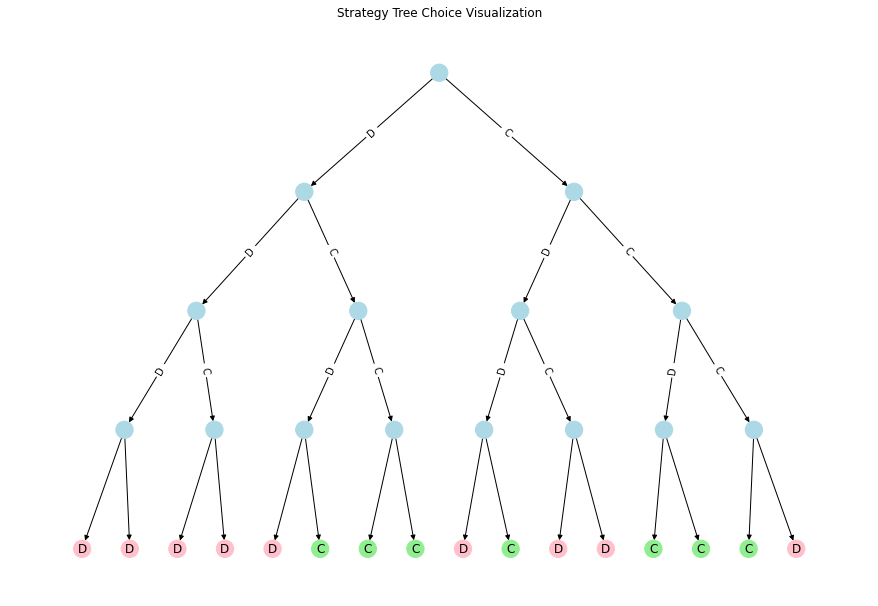

[0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0]


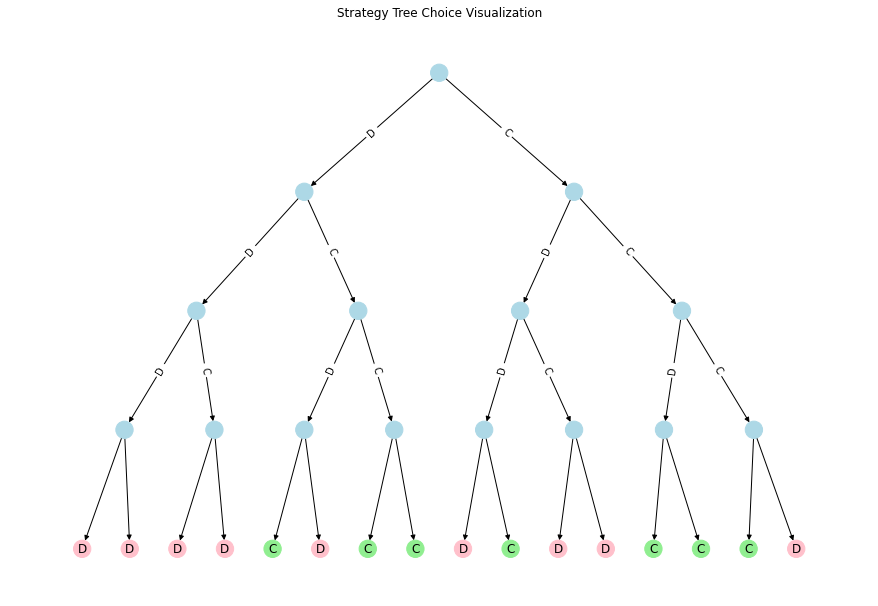

[0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0]


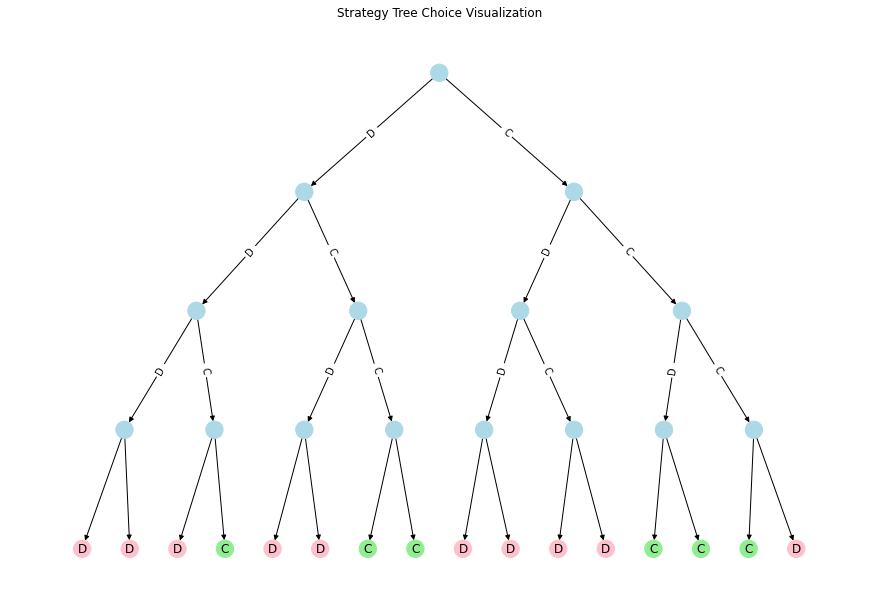

[0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0]


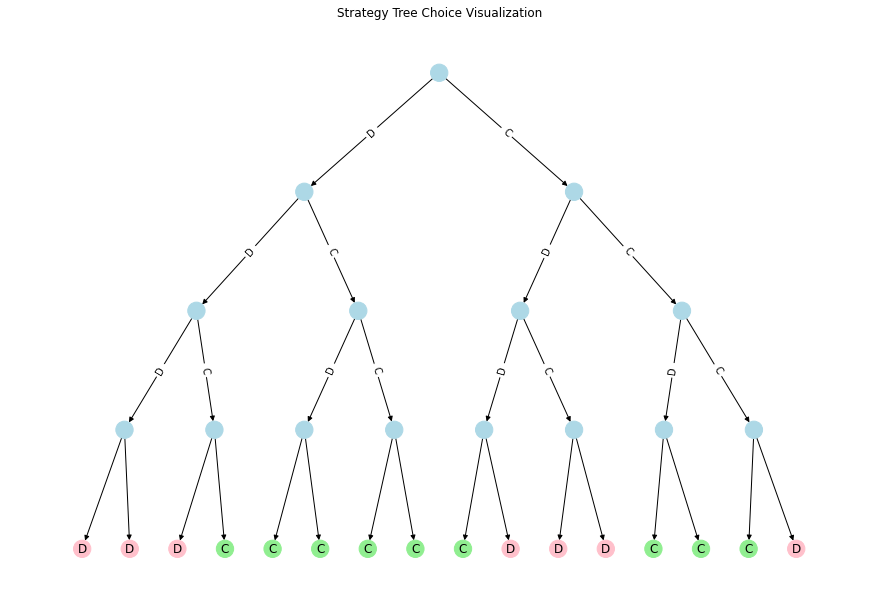

[0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]


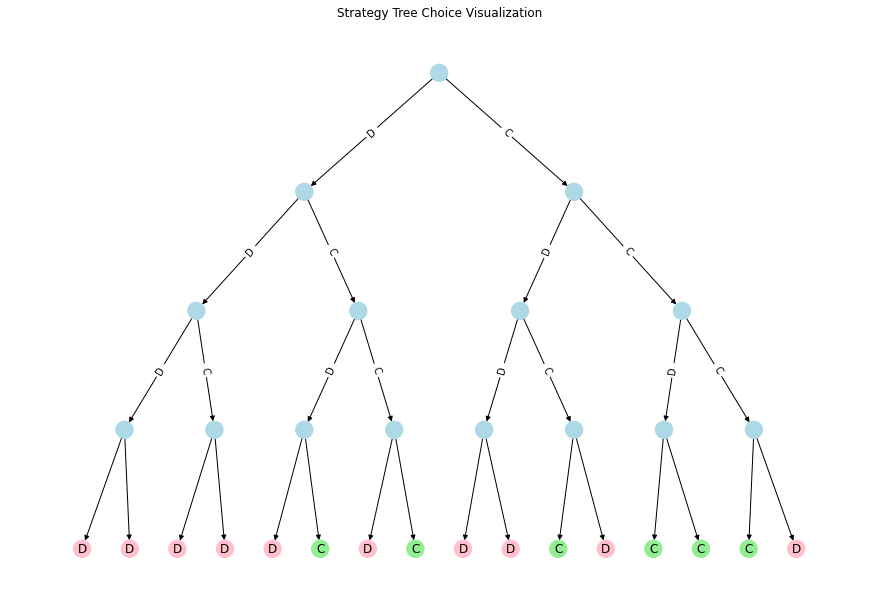

[0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0]


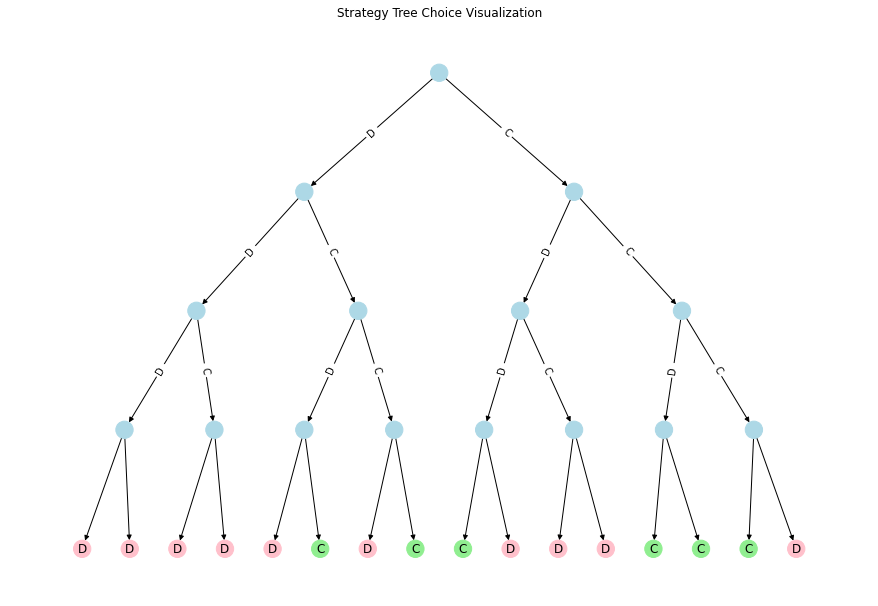

[0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]


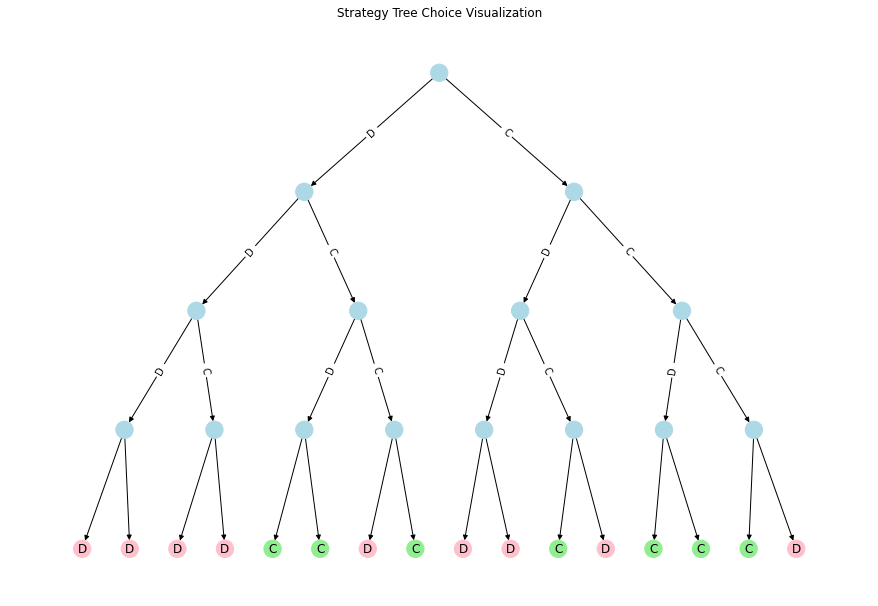

In [130]:
for best_result in results_d:
    best_strategy = best_result['strategy']
    print(best_strategy)
    binary_tree_plot(best_strategy)

In [131]:
"""
TIT FOR TAT POPULATION

GRID SEARCH ALL HYPERPARAMETER COMBINATIONS 
""" 

results_t = []

for population_size in population_sizes:
    for memory_length in memory_lengths:
        for crossover_operator in crossover_operators:
            for mutation_operator in mutation_operators:
                for mutation_rate in mutation_rates:
                    
                    print("Population =", population_size, "\nMemory =", memory_length, "\nCrossover Operator =", crossover_operator, "\nMutation Operator =", mutation_operator, "\nMutation Rate =", mutation_rate)
                    
                    start_time = time.time()
                    result, best_strategy = run_genetic_algorithm(population_size, 40, memory_length, 40,
                                                                  crossover_operator, mutation_operator, mutation_rate,
                                                                 fitness_t)
                    print("Best Strategy =", best_strategy, "\nFitness =", fitness(best_strategy, 40), "\nTime Taken = ", round(time.time()-start_time), "seconds\n")
                    
                    results_t.append({
                        'strategy': best_strategy,
                        'best fitness per generation': result['gen_best_fitnesses'],
                        'mean fitness per generation': result['gen_mean_fitnesses'],
                        'population size': population_size,
                        'memory length': memory_length,
                        'crossover': crossover_operator,
                        'mutation': mutation_operator,
                        'mutation rate': mutation_rate
                    })

Population = 60 
Memory = 3 
Crossover Operator = ordered 
Mutation Operator = reverse_sequence 
Mutation Rate = 0.1
Best Strategy = [0, 0, 0, 0, 1, 1, 0, 1, 0] 
Fitness = 2.875 
Time Taken =  2 seconds

Population = 60 
Memory = 3 
Crossover Operator = ordered 
Mutation Operator = reverse_sequence 
Mutation Rate = 0.25
Best Strategy = [0, 0, 0, 0, 1, 1, 0, 1, 0] 
Fitness = 2.875 
Time Taken =  2 seconds

Population = 60 
Memory = 3 
Crossover Operator = ordered 
Mutation Operator = inverse 
Mutation Rate = 0.1
Best Strategy = [0, 0, 0, 0, 1, 1, 0, 1, 0] 
Fitness = 2.875 
Time Taken =  2 seconds

Population = 60 
Memory = 3 
Crossover Operator = ordered 
Mutation Operator = inverse 
Mutation Rate = 0.25
Best Strategy = [0, 0, 0, 0, 1, 1, 0, 1, 0] 
Fitness = 2.875 
Time Taken =  2 seconds

Population = 60 
Memory = 3 
Crossover Operator = split 
Mutation Operator = reverse_sequence 
Mutation Rate = 0.1
Best Strategy = [1, 0, 0, 0, 1, 1, 1, 1, 0] 
Fitness = 2.825 
Time Taken =  5 seconds

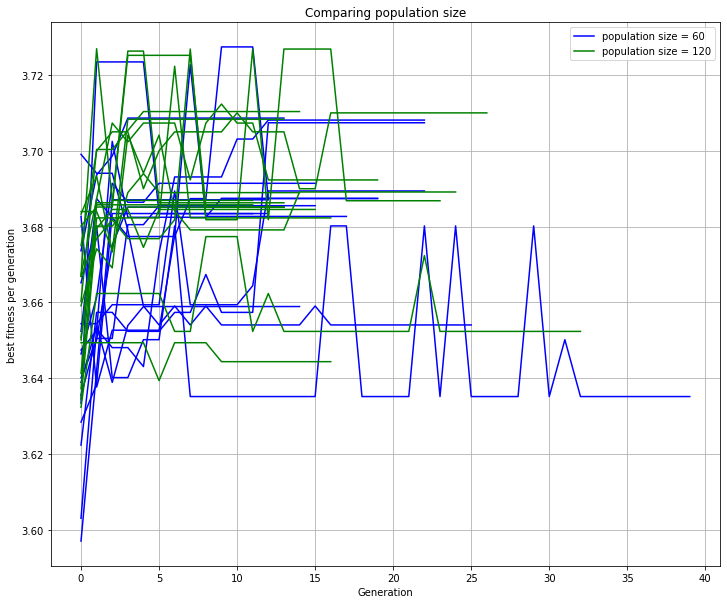

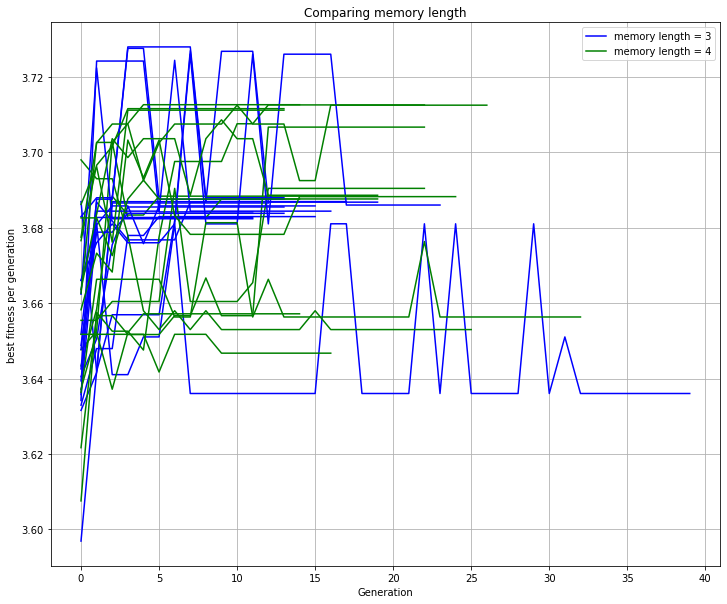

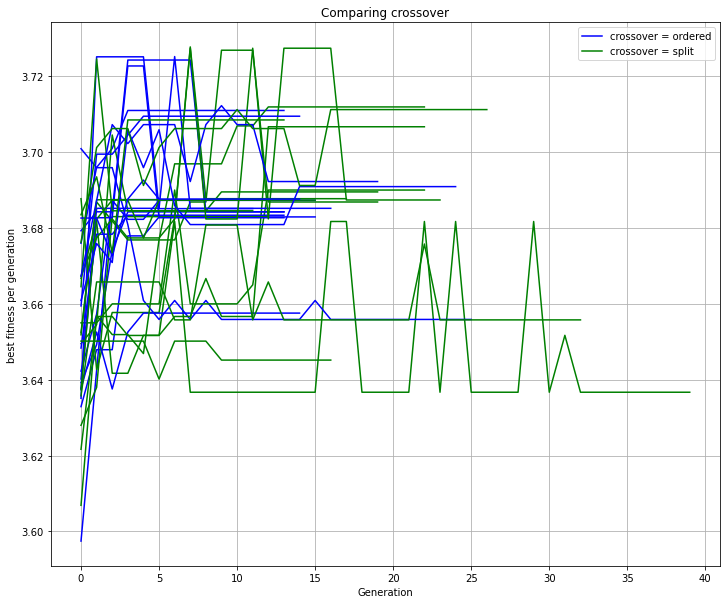

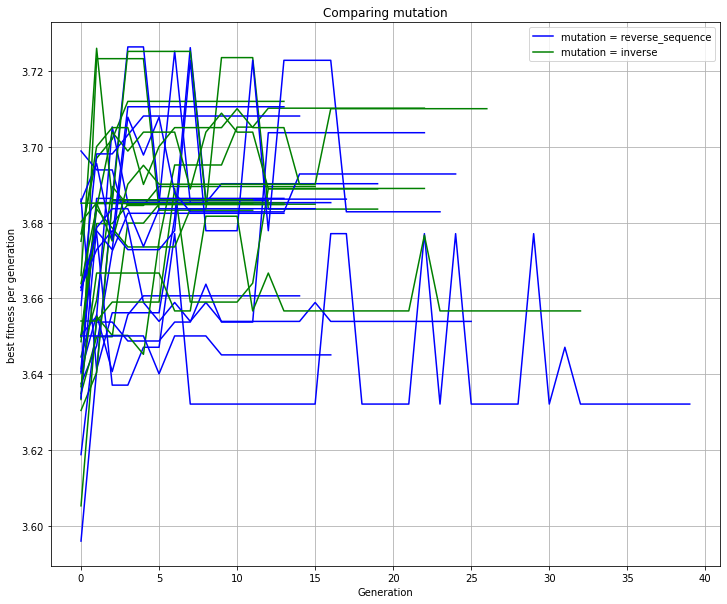

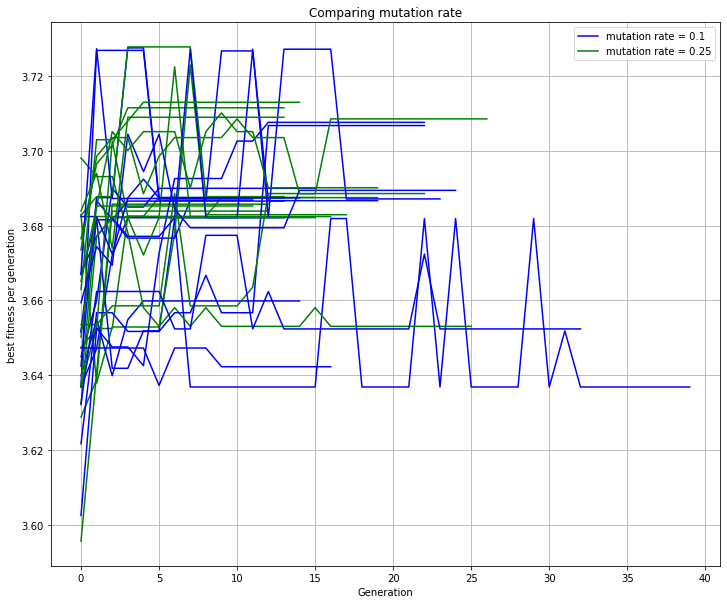

In [132]:
"""
Plotting best population fitness over generations for tit for tat population
""" 

plot(results_t, 'population size', 'best fitness per generation', 0.003)
plot(results_t, 'memory length', 'best fitness per generation', 0.003)
plot(results_t, 'crossover', 'best fitness per generation', 0.003)
plot(results_t, 'mutation', 'best fitness per generation', 0.003)
plot(results_t, 'mutation rate', 'best fitness per generation', 0.003)

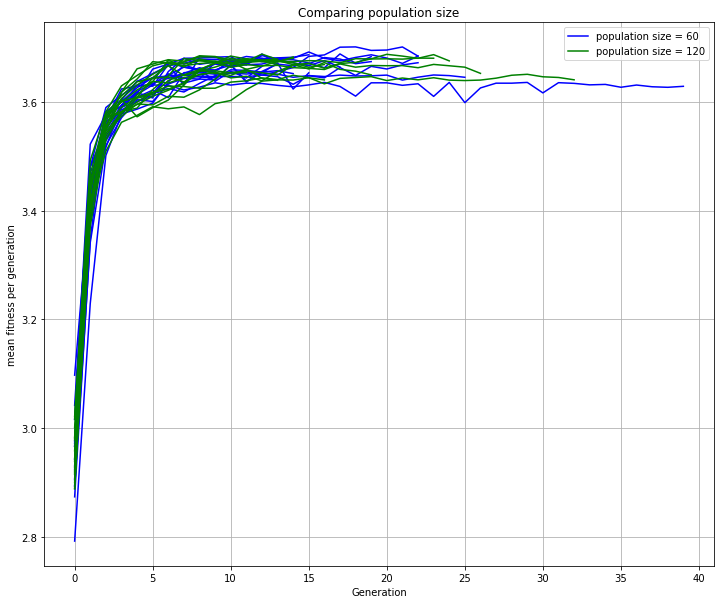

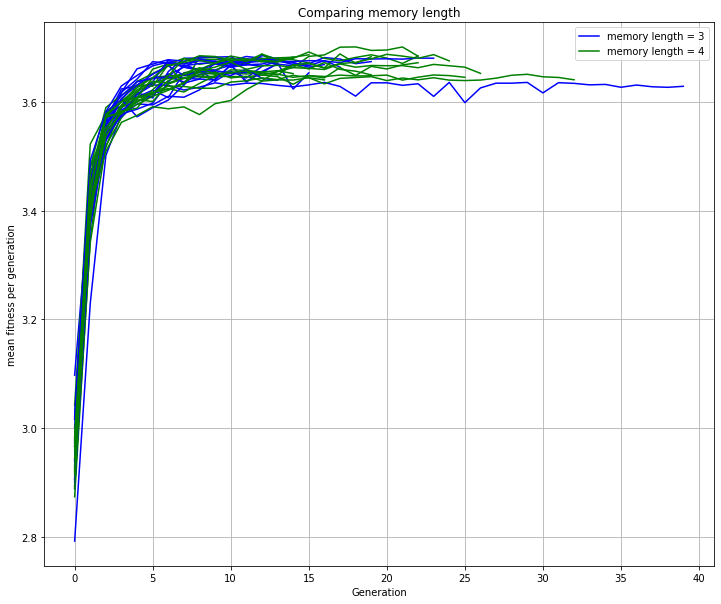

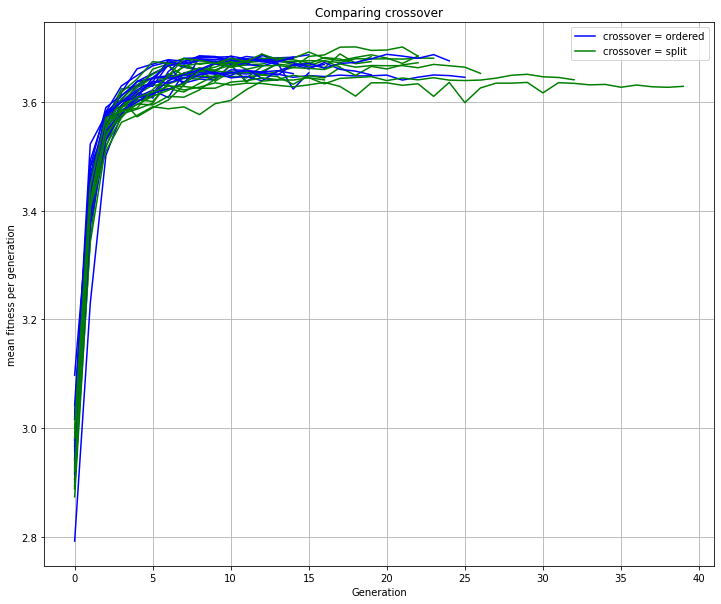

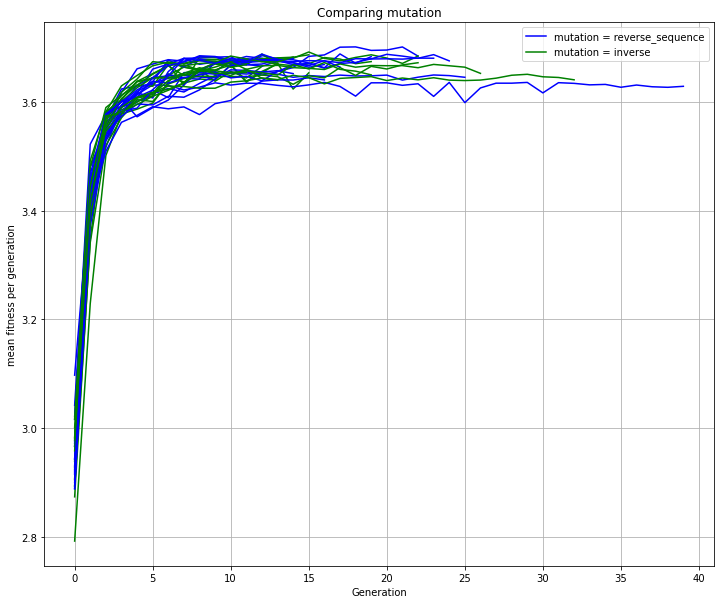

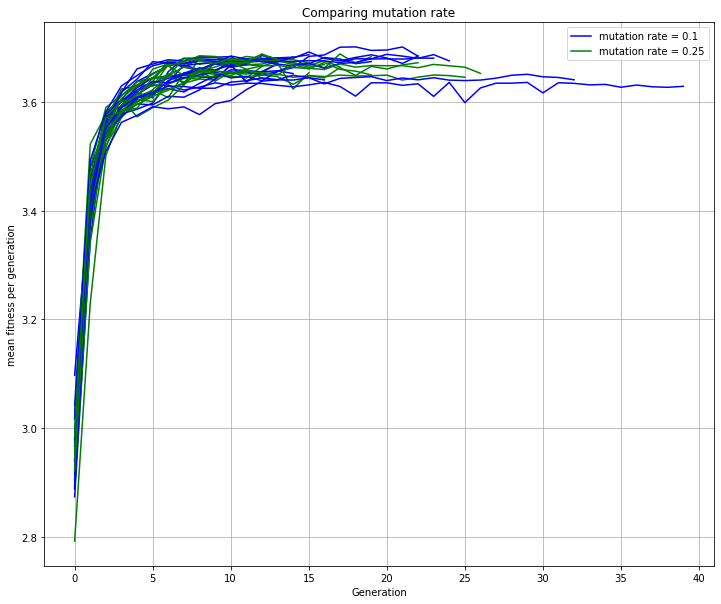

In [133]:
"""
Plotting mean population fitness over generations for tit for tat population
""" 

plot(results_t, 'population size', 'mean fitness per generation', 0)
plot(results_t, 'memory length', 'mean fitness per generation', 0)
plot(results_t, 'crossover', 'mean fitness per generation', 0)
plot(results_t, 'mutation', 'mean fitness per generation', 0)
plot(results_t, 'mutation rate', 'mean fitness per generation', 0)

[0, 0, 0, 0, 1, 1, 0, 1, 0]


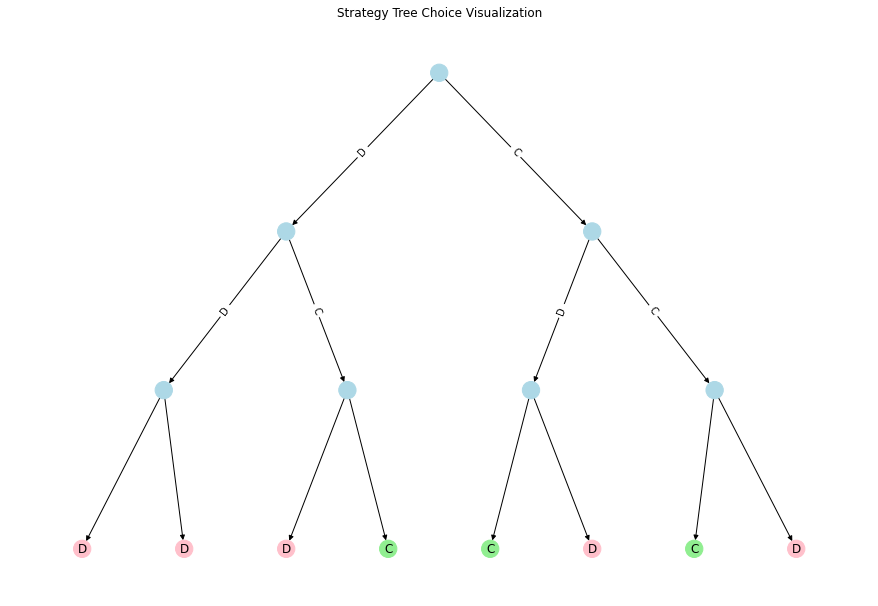

[0, 0, 0, 0, 1, 1, 0, 1, 0]


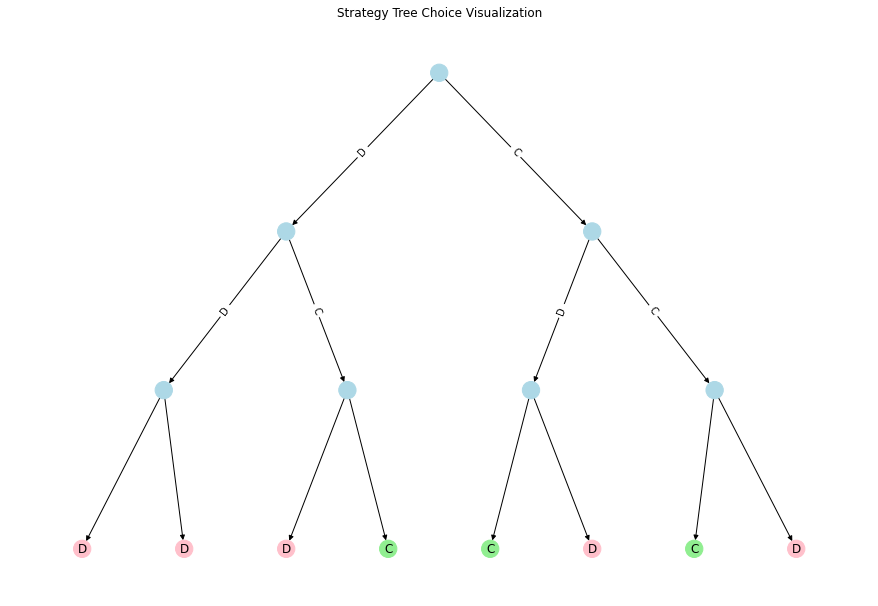

[0, 0, 0, 0, 1, 1, 0, 1, 0]


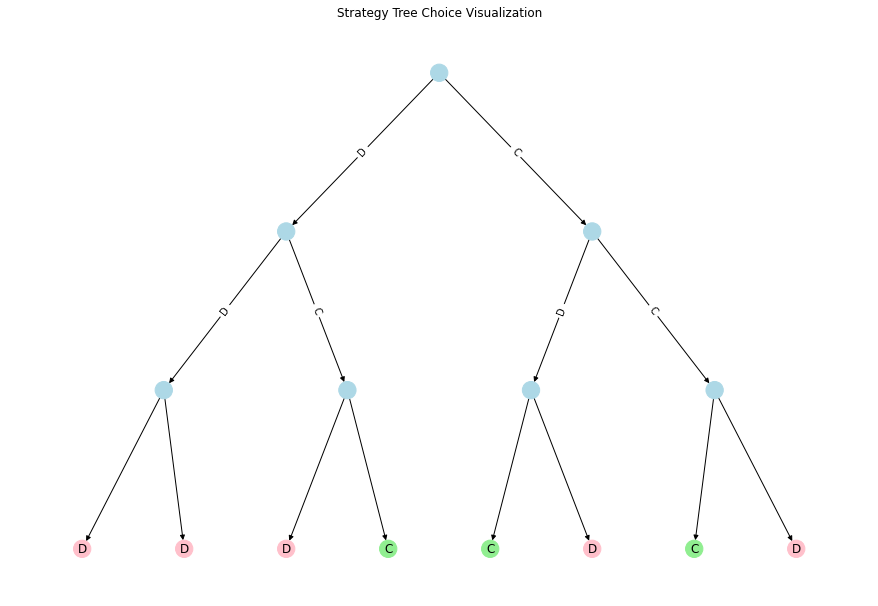

[0, 0, 0, 0, 1, 1, 0, 1, 0]


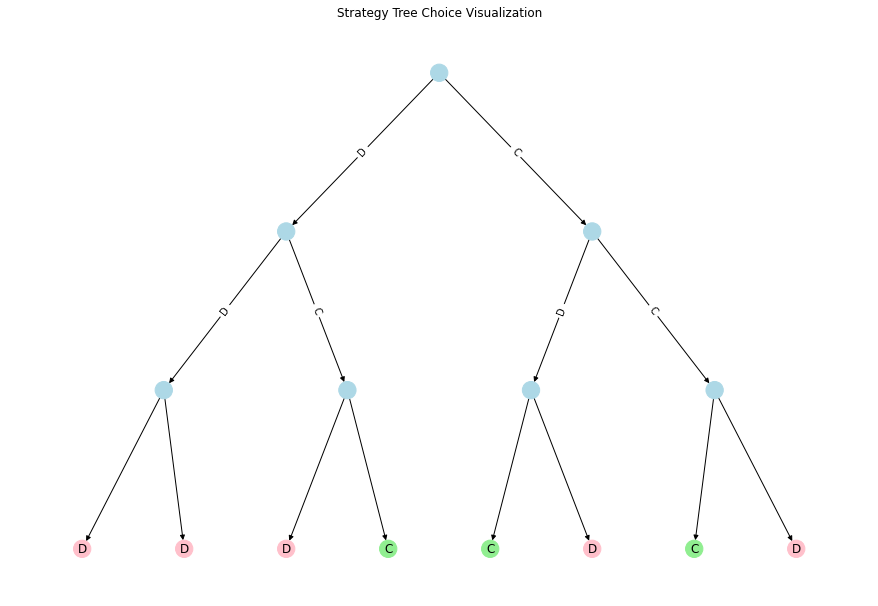

[1, 0, 0, 0, 1, 1, 1, 1, 0]


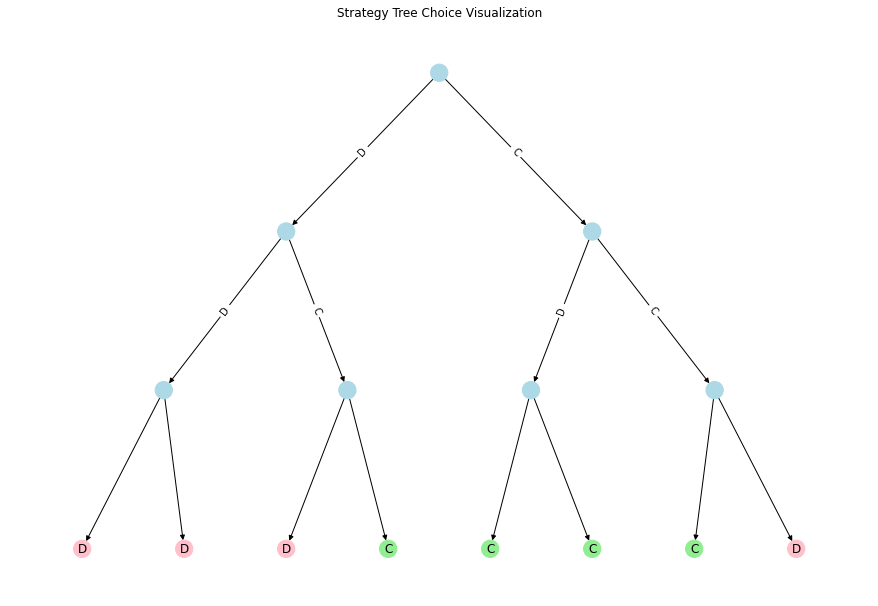

[0, 0, 0, 0, 1, 1, 0, 1, 0]


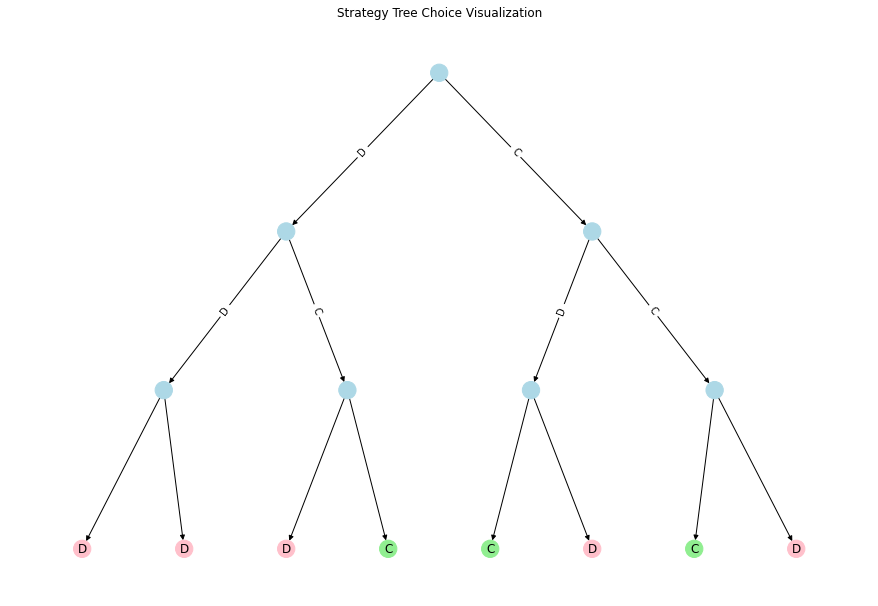

[0, 0, 0, 0, 1, 1, 0, 1, 0]


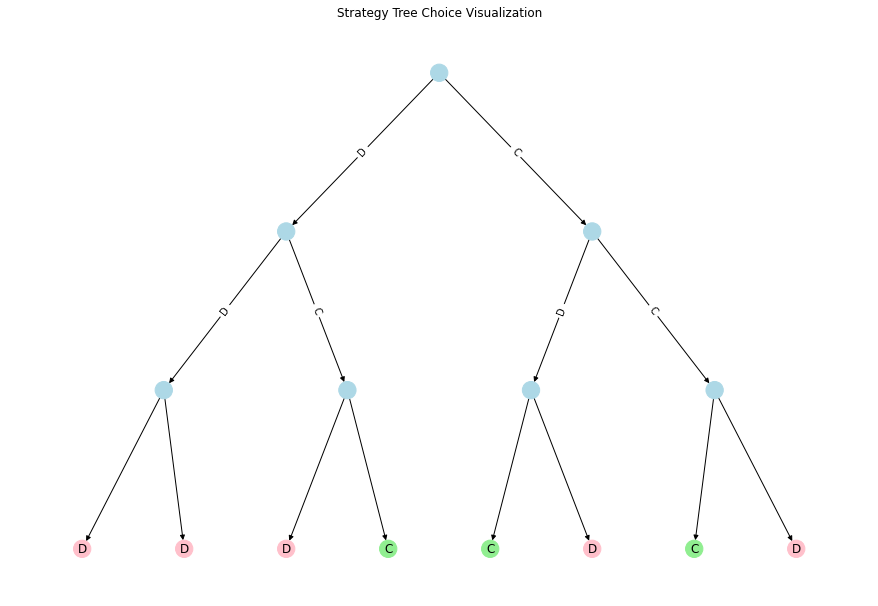

[0, 0, 0, 0, 1, 1, 0, 1, 0]


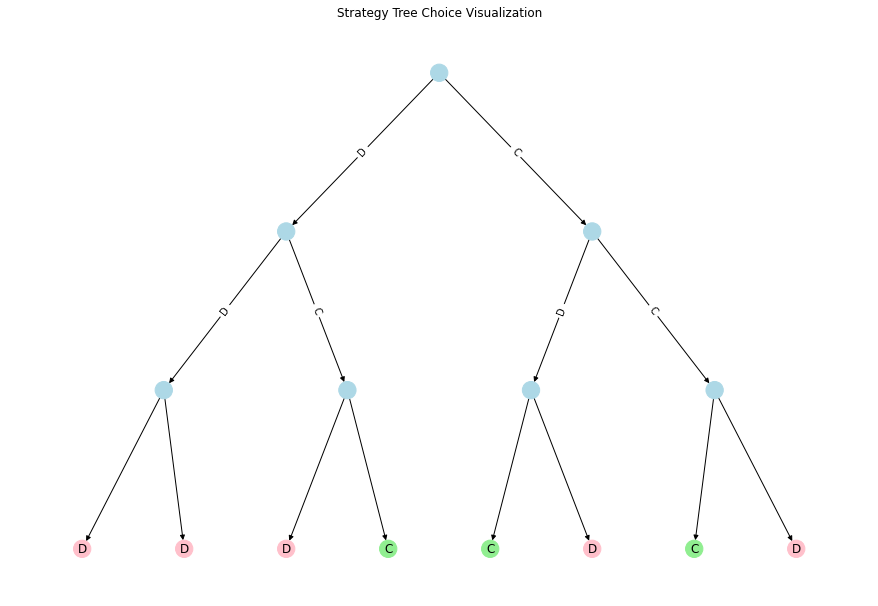

[0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]


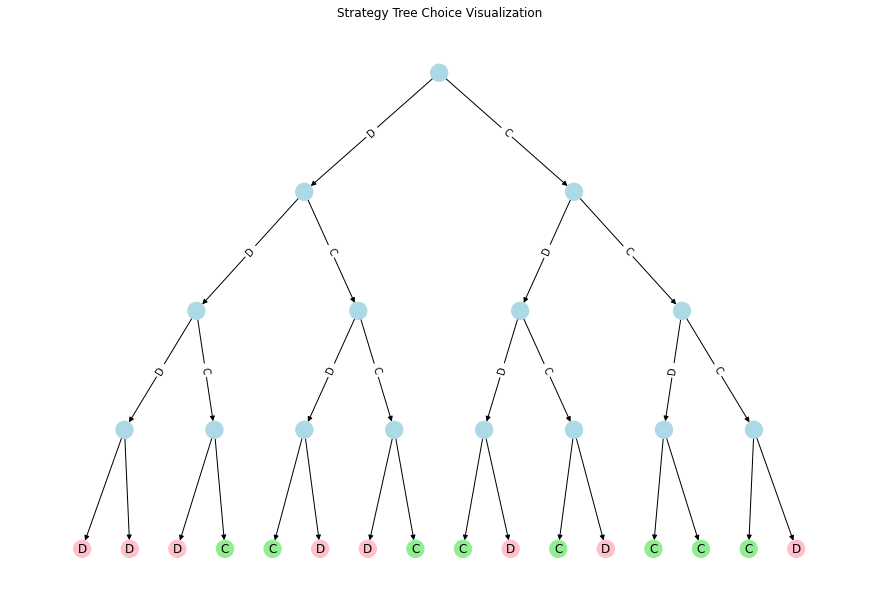

[0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0]


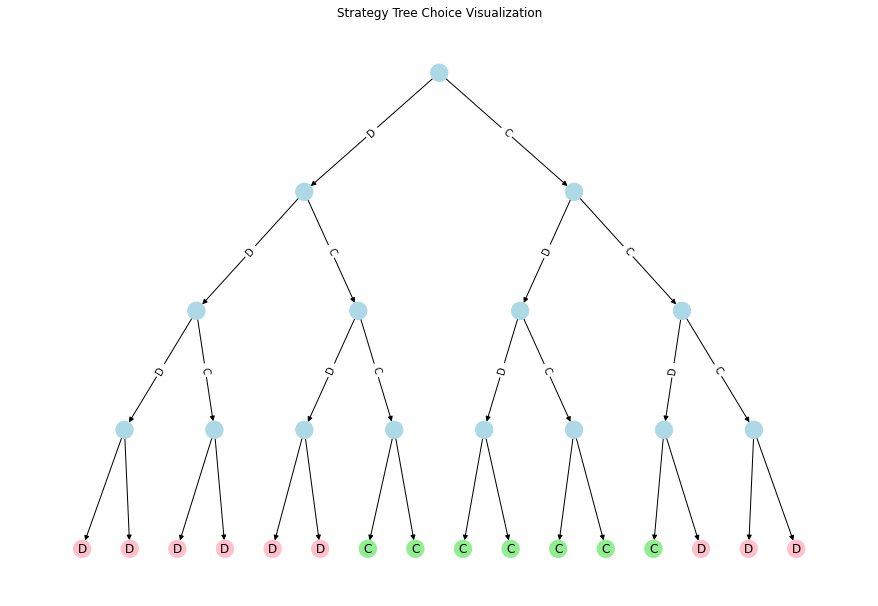

[0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0]


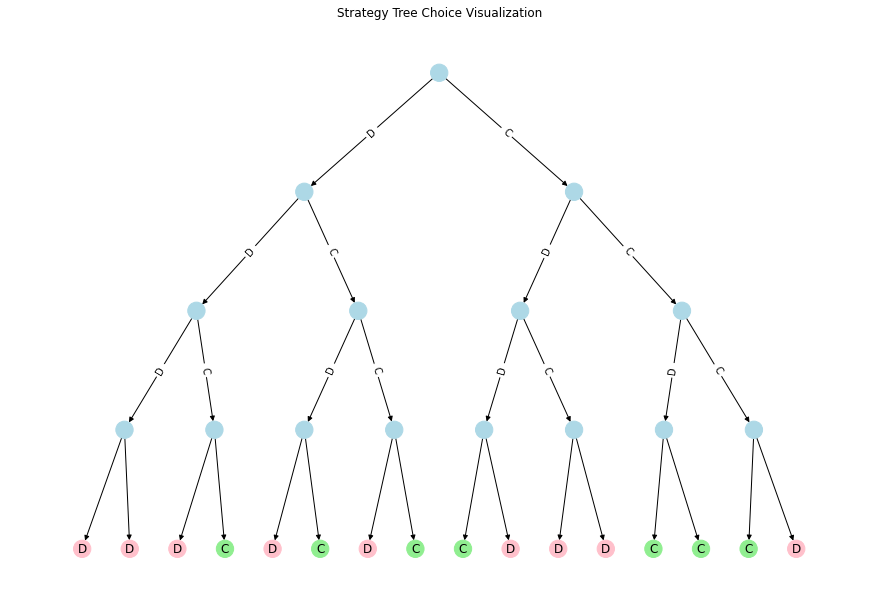

[0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0]


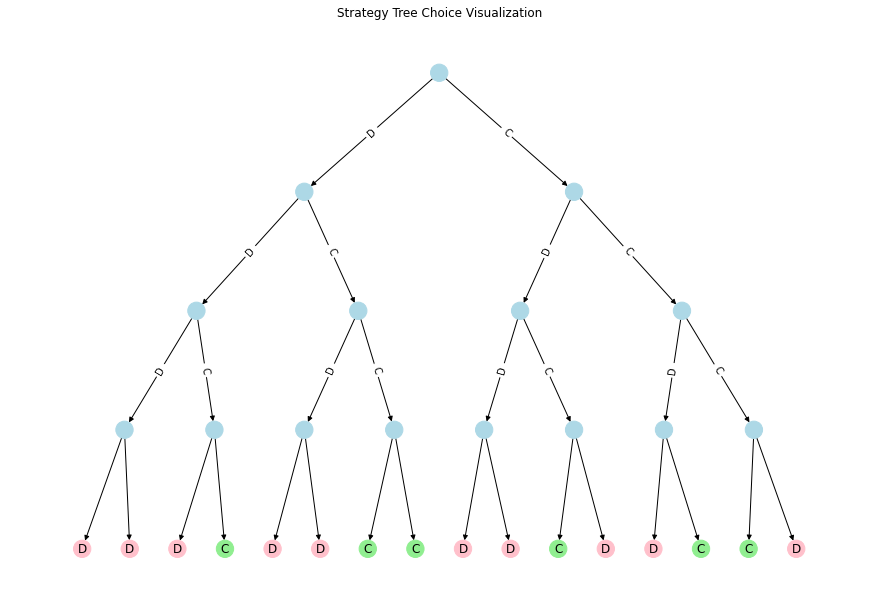

[0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0]


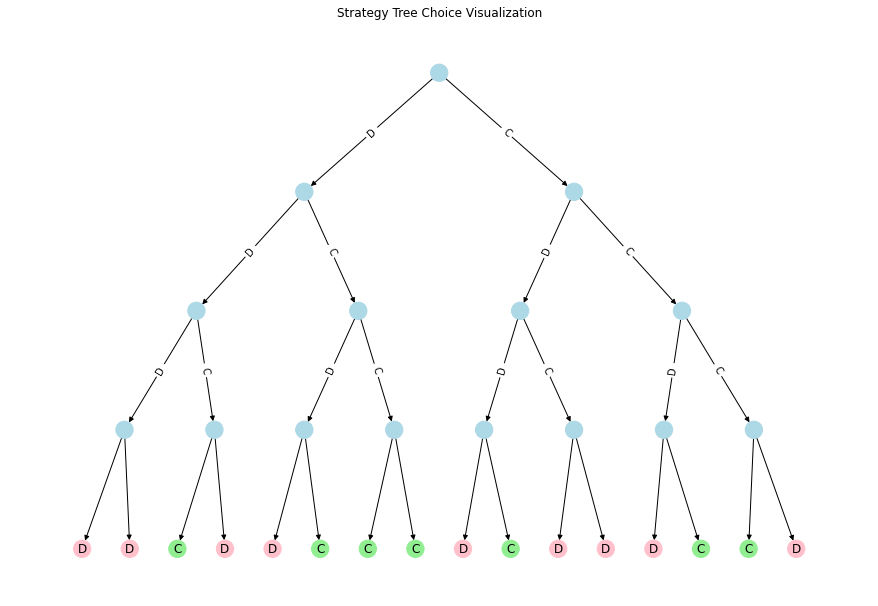

[0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0]


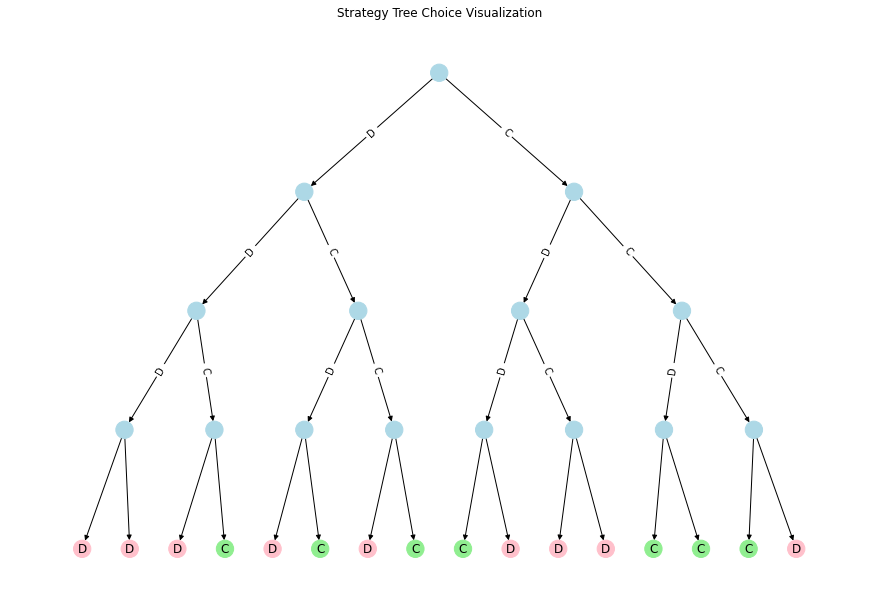

[0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0]


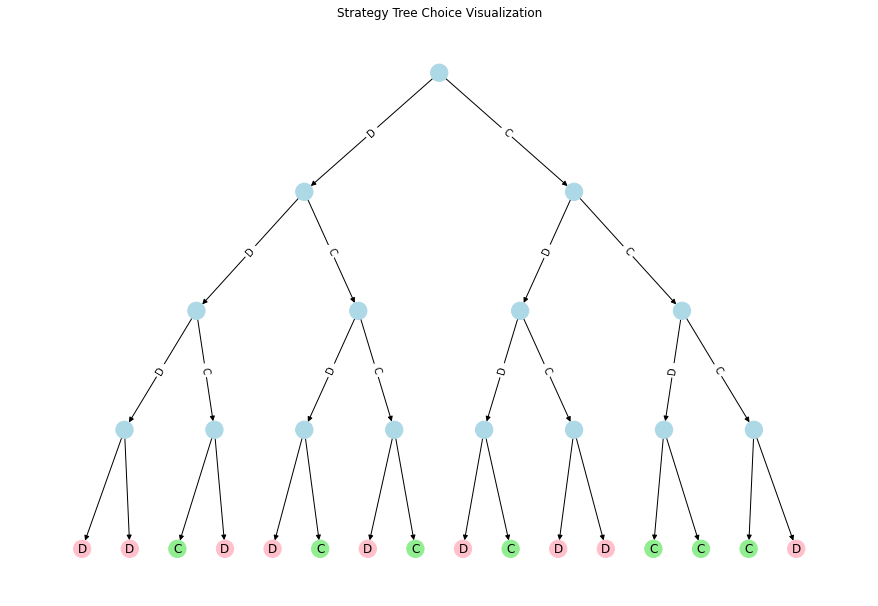

[0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0]


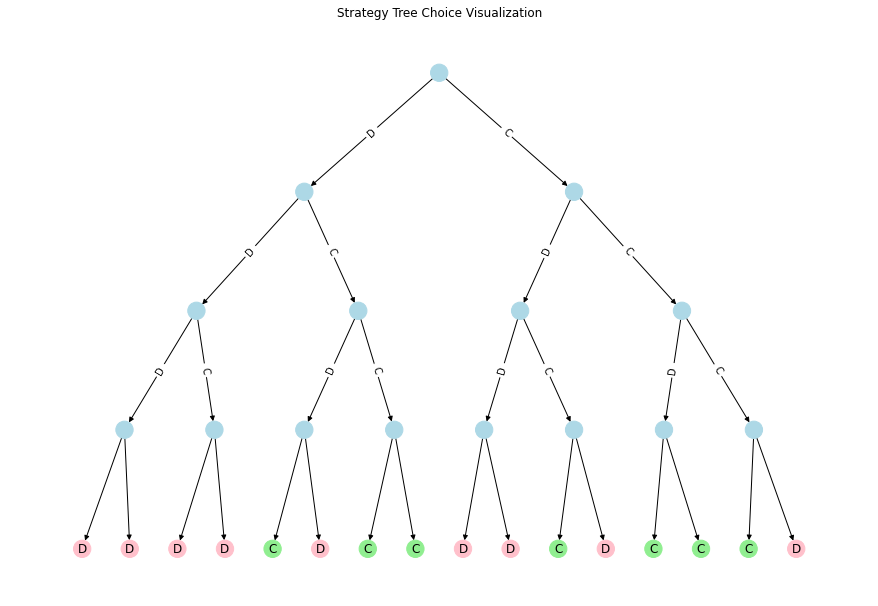

[0, 0, 0, 0, 1, 1, 0, 1, 0]


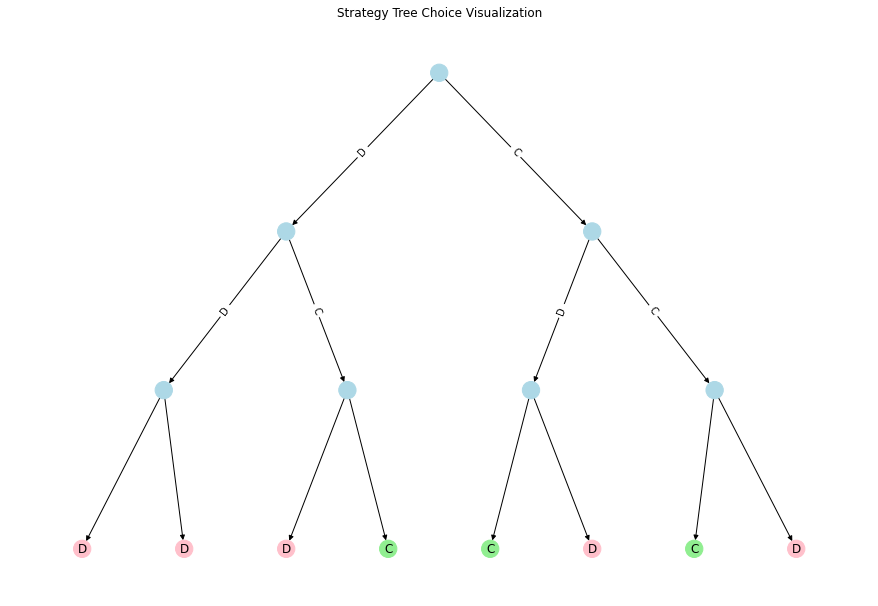

[0, 0, 0, 0, 1, 1, 0, 1, 0]


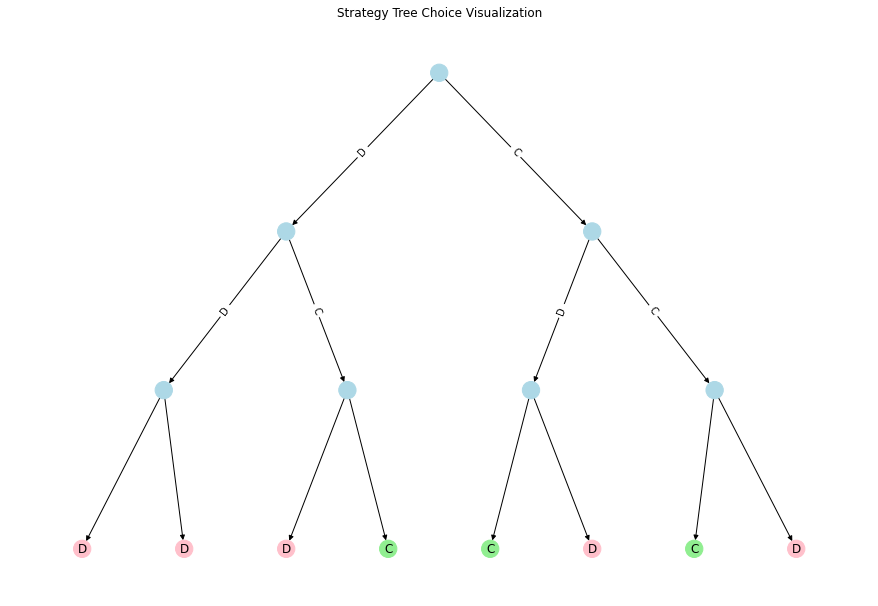

[0, 0, 0, 0, 1, 1, 0, 1, 0]


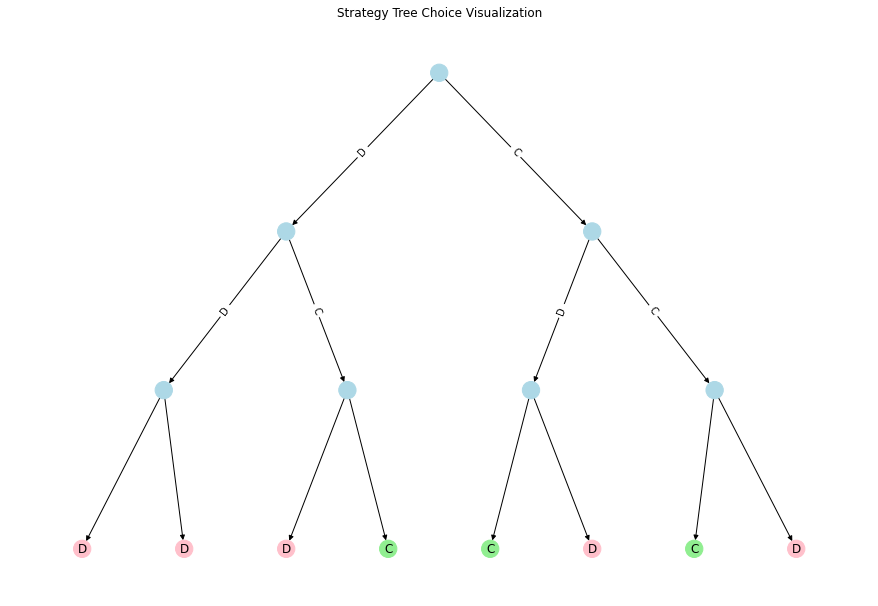

[0, 0, 0, 0, 1, 1, 0, 1, 0]


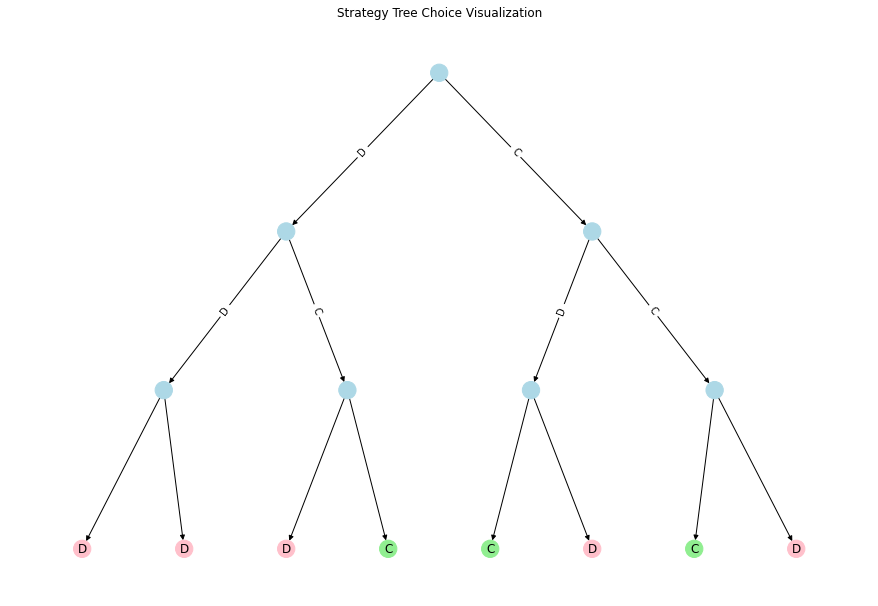

[0, 0, 0, 0, 1, 1, 0, 1, 0]


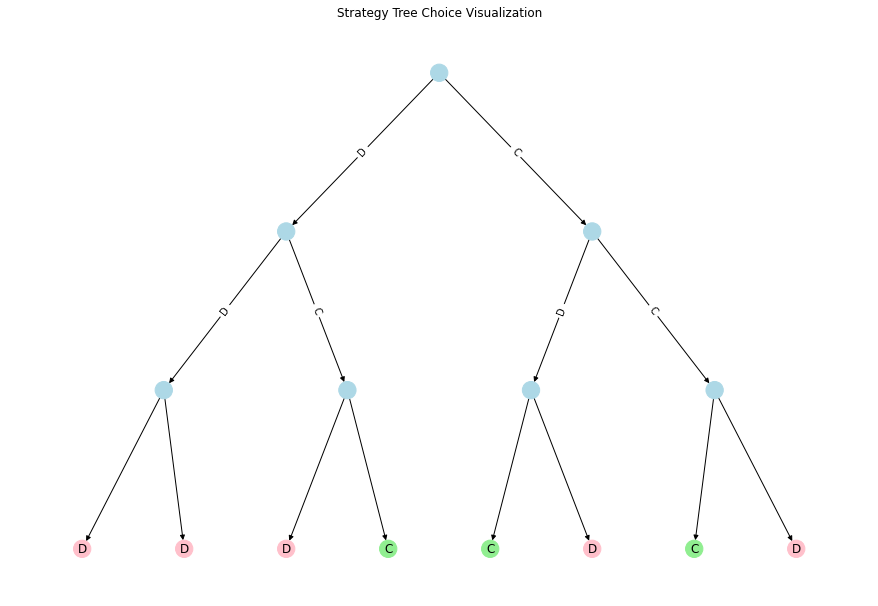

[0, 0, 0, 0, 1, 1, 0, 1, 0]


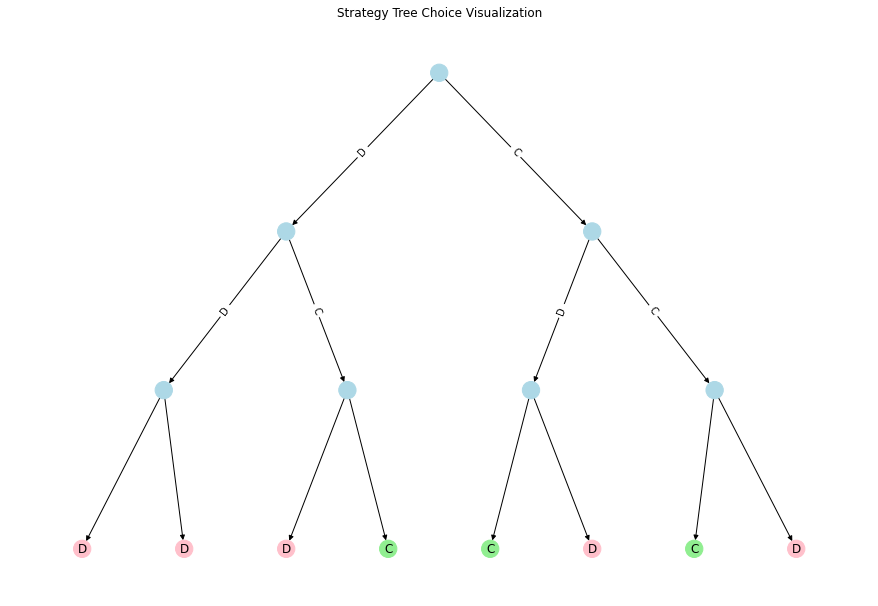

[0, 0, 0, 0, 1, 1, 0, 1, 0]


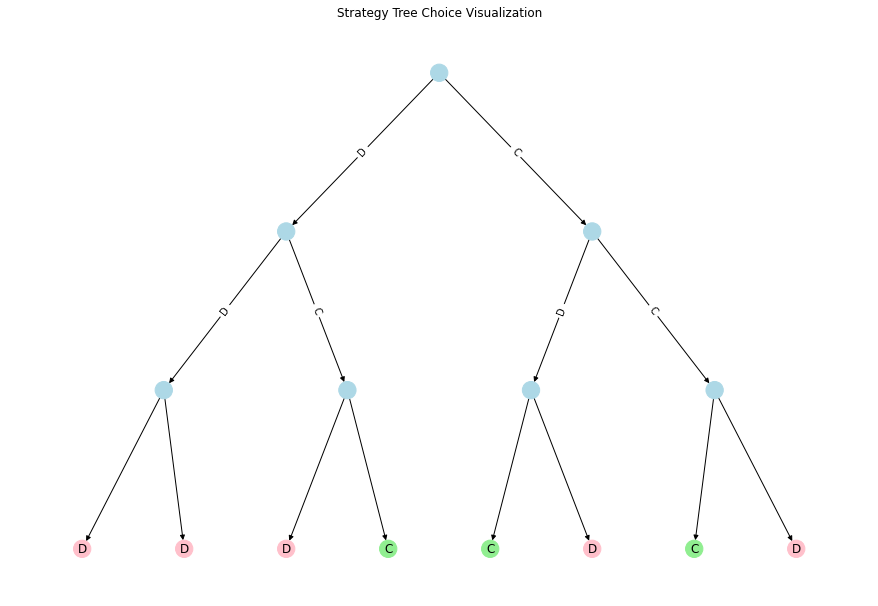

[0, 0, 0, 0, 1, 1, 0, 1, 0]


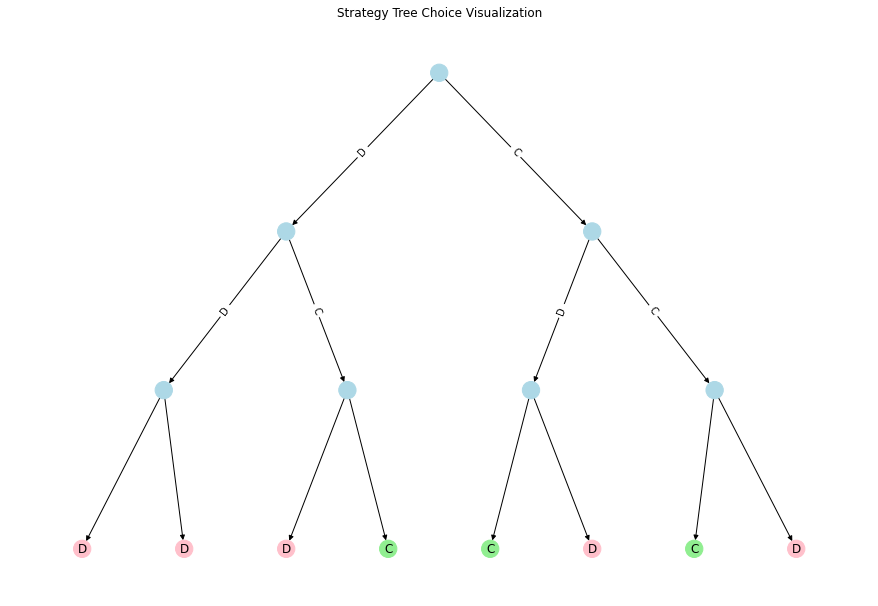

[0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0]


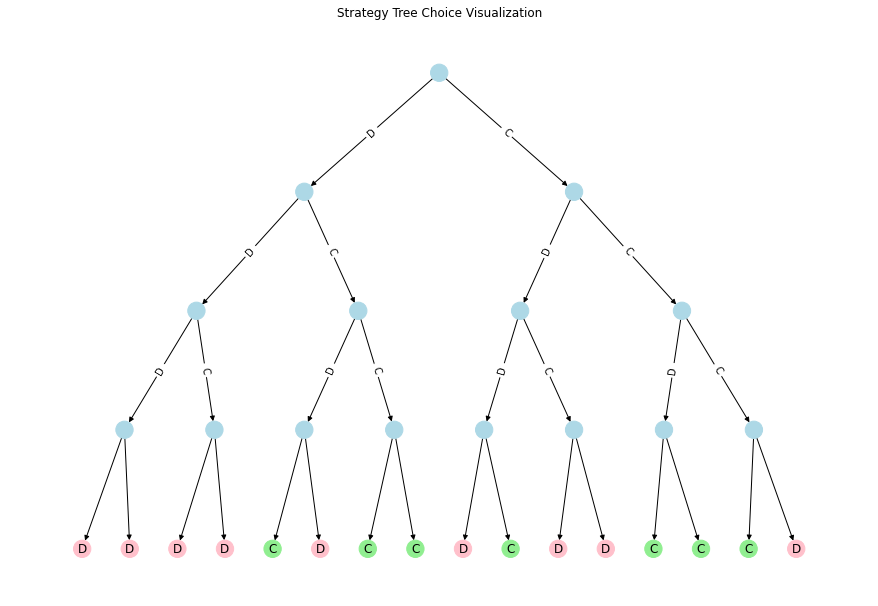

[0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0]


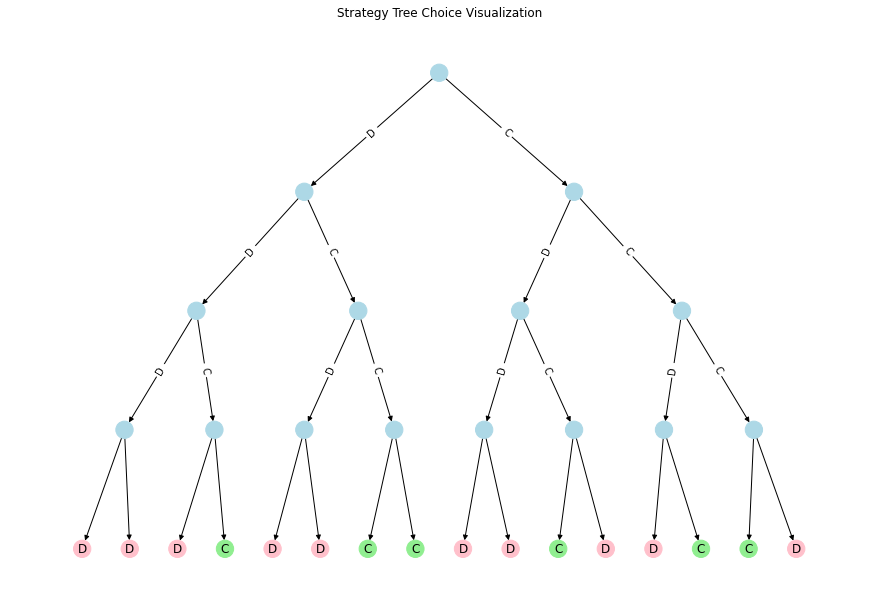

[0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0]


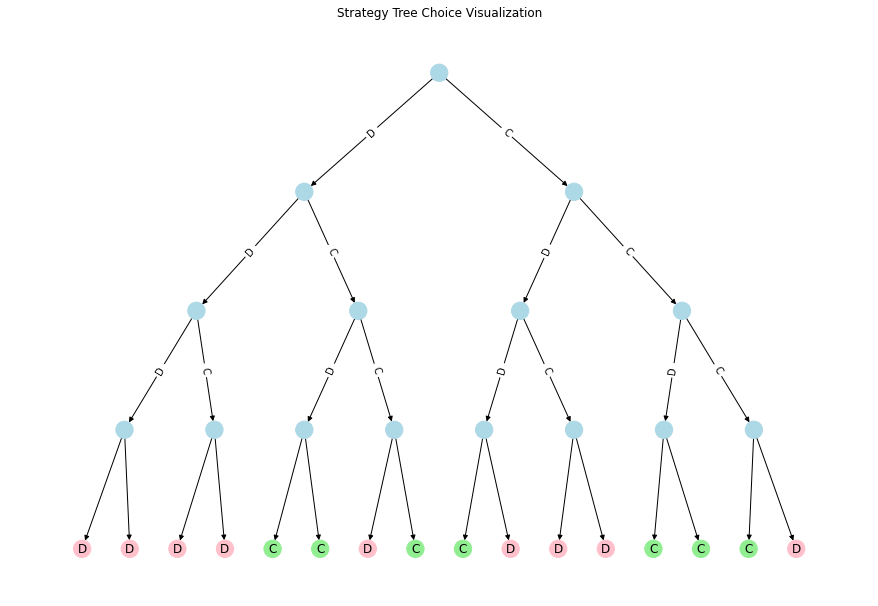

[0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0]


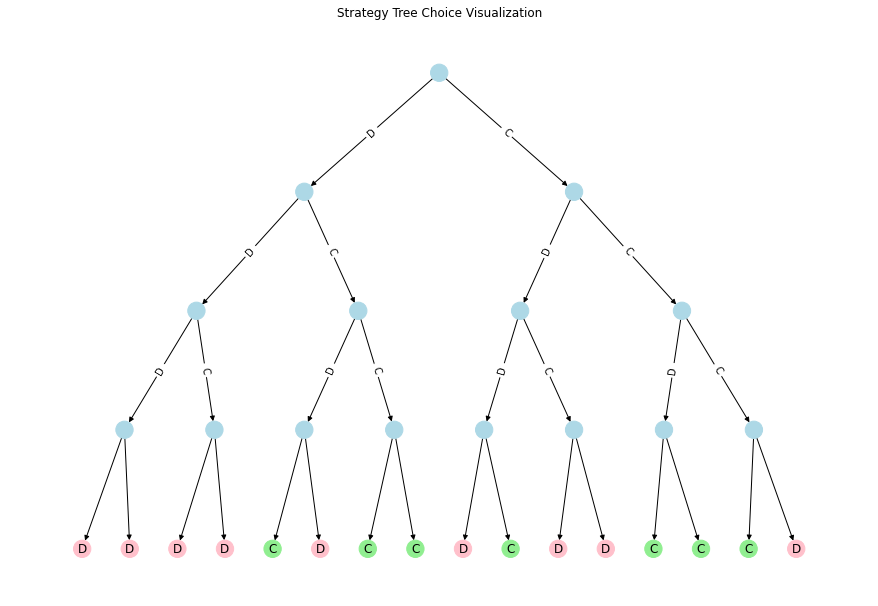

[0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0]


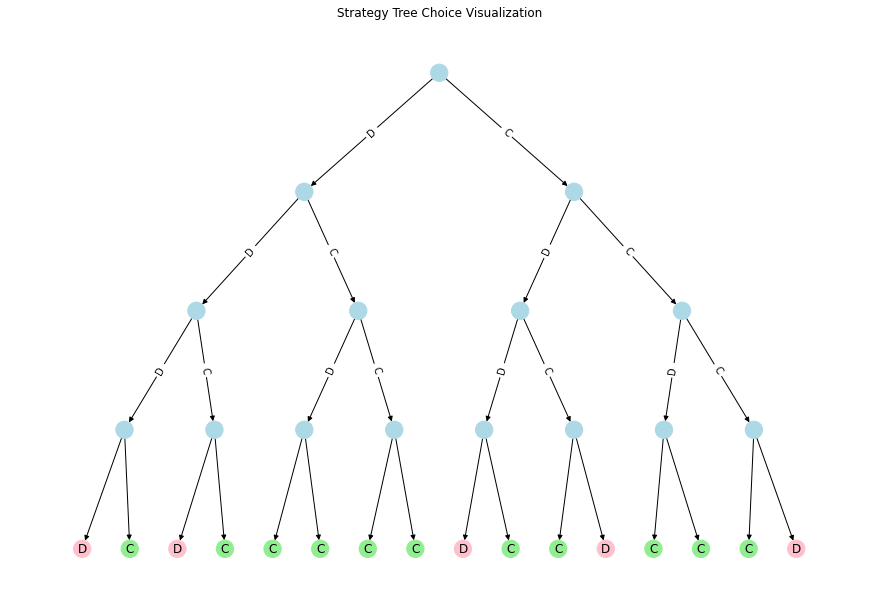

[0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0]


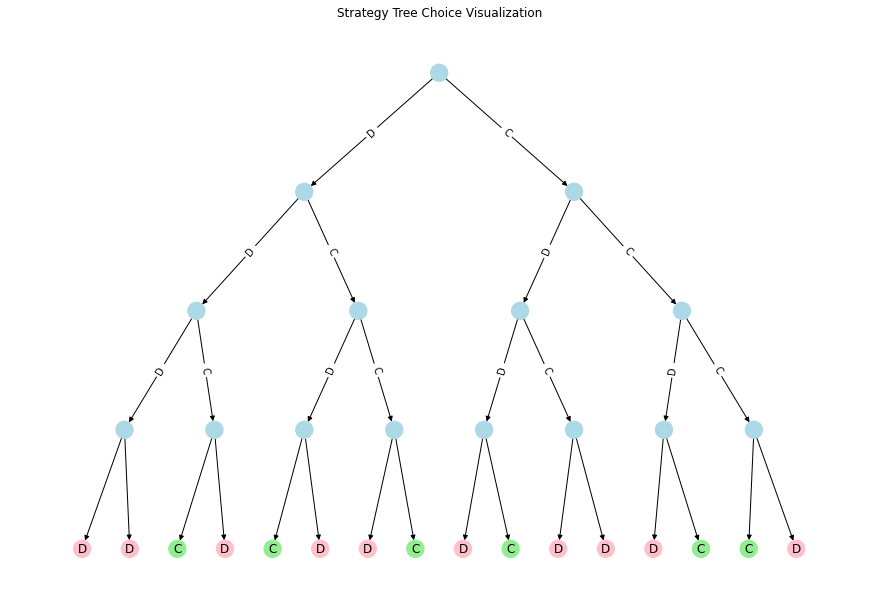

[0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0]


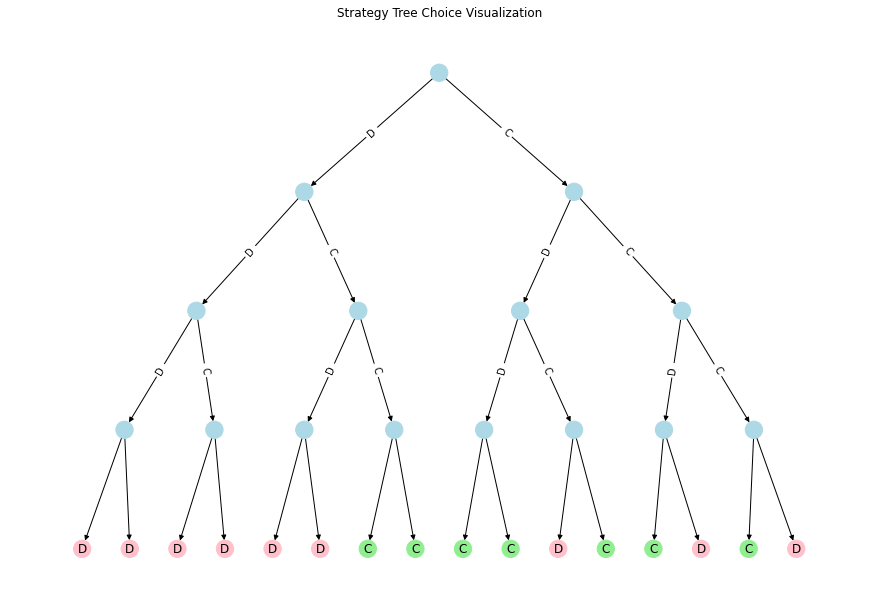

[0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0]


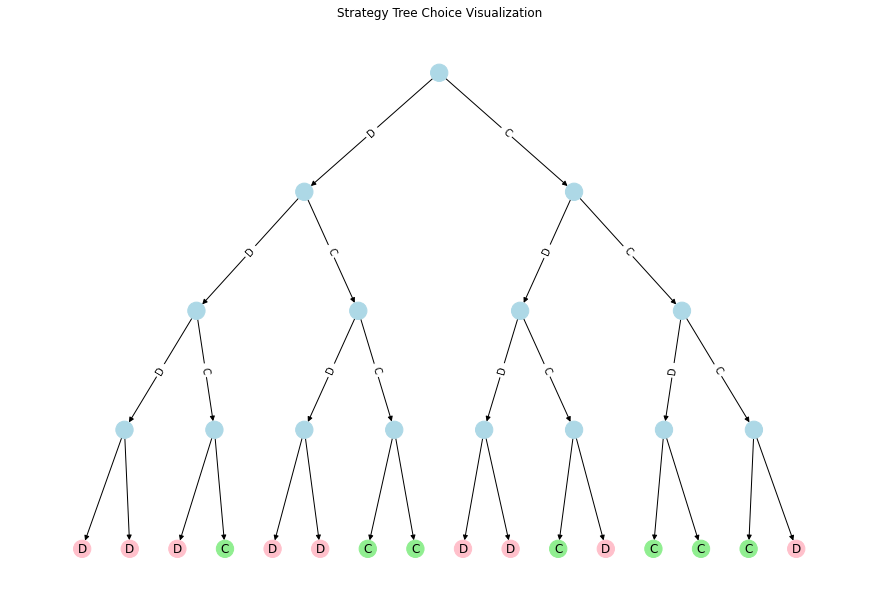

In [134]:
for best_result in results_t:
    best_strategy = best_result['strategy']
    print(best_strategy)
    binary_tree_plot(best_strategy)